# **COSC2789 - Practical Data Science**

# **Assignment 3: Group Project**

# **Task 0: Choosing Topic**


## **Motivation**
In the modern age, e-commerce is slowly taking over the retail industry, putting up impressive numbers with an expected growth rate of 9.49% [(Statista)](https://www.statista.com/outlook/emo/ecommerce/worldwide#revenue). By 2029, the market volume is anticipated to reach US$6.48 trillion, with user penetration increasing from 40.5% in 2024 to 49.1% [(Statista)](https://www.statista.com/outlook/emo/ecommerce/worldwide#revenue). It is no doubt that online shopping platforms have transformed the way businesses operate. Despite this significant growth, a problem persists, which is low conversion rates. It is recorded that only around 3.3% of total sessions result in a transaction, with many visitors abandoning their sessions without completing purchases [(Smart Insights)](https://www.smartinsights.com/ecommerce/ecommerce-analytics/ecommerce-conversion-rates/). With that established, there is a race to look for more effective and long-term ways of achieving competitive advantage in the digital space by understanding customer behavior and improving the efficiency of marketing strategies. As a result, predicting customer intent, whether a visitor is likely to purchase or merely browse, is critical to achieving business success in this competitive landscape since it can help with personalized product recommendations and overall user satisfaction improvement.

The dataset used in this study, made available on the [UC Irvine Machine Learning Repository](https://archive.ics.uci.edu/dataset/468/online+shoppers+purchasing+intention+dataset) and sourced from an online shopping platform, includes 12,330 sessions and encompasses detailed features such as page visits, session duration, traffic sources, and whether a purchase is made for that session. This dataset allows for a comprehensive analysis of user behavior patterns and their influence on purchase decisions. It also highlights a notable imbalance in the target variable, with a minority of sessions resulting in a purchase, reflecting real-world challenges e-commerce businesses face.

This Notebook combines theoretical perspectives and practical applications to present a comprehensive approach to predicting purchasing intentions in digital retail sites. The findings will address the challenges of session-level prediction and offer actionable recommendations for enhancing conversion rates and fostering long-term customer loyalty.

## **Data Description**
The dataset utilized in this analysis is the “Online Shoppers Purchasing Intention Dataset,” obtained from the UCI Machine Learning Repository. This dataset consists of 12.330 sessions, each with 18 features spanning numerical and categorical variables.

***Domain***
The dataset belongs to the **e-commerce domain** and captures user behavior during sessions on an e-commerce website. It includes features derived from user interactions, Google Analytics metrics, and contextual information about the visit.

***Context***
The dataset is designed to analyze user behavior and session patterns on an e-commerce platform. It provides insights into how users interact with different types of pages (administrative, informational, product-related), their engagement metrics (bounce rate, exit rate, page value), and contextual factors (special days, visitor type, region, etc.). The data is useful for understanding user preferences, optimizing website design, and improving conversion rates.

***Page Visit Features***
- **Administrative**: Number of administrative pages visited during the session.
- **Administrative Duration**: Total time spent on administrative pages (in seconds).
- **Informational**: Number of informational pages visited during the session.
- **Informational Duration**: Total time spent on informational pages (in seconds).
- **Product Related**: Number of product-related pages visited during the session.
- **Product Related Duration**: Total time spent on product-related pages (in seconds).

***Google Analytics Metrics***
- **Bounce Rate**: Percentage of visitors who enter the site from a page and leave without triggering any other requests during the session.
- **Exit Rate**: Percentage of pageviews that were the last in the session for a specific page.
- **Page Value**: Average value of a page that a user visited before completing an e-commerce transaction.

***Special Day Feature***
- **Special Day**: Indicates the closeness of the visit to a specific special day (e.g., Mother’s Day, Valentine's Day). The value is determined by e-commerce dynamics, such as the duration between the order date and delivery date. It takes a nonzero value between specific dates (e.g., February 2–12 for Valentine's Day), with a maximum value of 1 on the peak day (e.g., February 8).

***Visitor and Session Information***
- **Operating System**: The operating system used by the visitor.
- **Browser**: The browser used by the visitor.
- **Region**: The region from which the visitor accessed the site.
- **Traffic Type**: The type of traffic source (e.g., organic search, direct).
- **Visitor Type**: Indicates whether the visitor is a **Returning Visitor** or a **New Visitor**.
- **Weekend**: Boolean value indicating whether the visit occurred on a weekend.
- **Month**: The month of the year in which the visit occurred.

## **Objective**

-   This study aims to build complex prediction models to provide insights into customers' intent and patterns for an online shopping platform using Jupyter Notebook and IPython, as well as relevant libraries and packages. The goal can be split into 2 tasks: identifying potential buyers and improving conversion rates through targeted marketing strategies. To achieve the former, we aim to create classification models to predict customer intent (whether a transaction is made) and clustering models to segment customers based on their behaviors and purchasing patterns. These models aim to reveal insights into customer groups and individual intent, allowing for more precise targeting and resource allocation. As for personalized marketing, insights from the models above can be used to design appropriate strategies to engage high-value customers, re-engage potential buyers, and address segments based on their preferences. Additionally, by predicting the duration spent in product-related sessions using regression models, the business can personalize promotions, loyalty programs, and product recommendations encouraging the user to purchase. Moreover, these models should be able to handle imbalance reflecting real-world problems, producing accurate predictions despite it. Ultimately, the goal is to enhance the customer experience on the platform, increasing their satisfaction and engagement and encouraging them to spend more money on the site. Although the models may not apply to different businesses, they aim to identify user behaviors in all online retail stores, streamlining marketing strategies and heightening user satisfaction and loyalty to the brand in the long run.

-   This report combines theoretical perspectives and practical applications to present a comprehensive approach to predicting purchasing intentions in digital retail sites. The findings will explore the limitations of the data set and recommend initiatives for enhancing conversion rates and fostering long-term customer loyalty.

# **Task 1: Retrieving and Preparing the Data**

## **Installing necessary libraries**


In [1]:
%pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


## **Importing libraries**

In [2]:
import pandas as pd 
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.gridspec as gridspec
from mlxtend.feature_selection import ExhaustiveFeatureSelector, SequentialFeatureSelector
from sklearn.base import clone
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, confusion_matrix, f1_score, mean_absolute_error
from sklearn.metrics import silhouette_score, davies_bouldin_score, mean_squared_error, r2_score, roc_curve, auc
from sklearn.model_selection import train_test_split, RandomizedSearchCV, TunedThresholdClassifierCV, KFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier, ExtraTreesClassifier
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso
from matplotlib.colors import ListedColormap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
import plotly.express as px
import logging
from scipy import stats
from scipy.stats import randint, uniform
from sklearn.preprocessing import RobustScaler, OrdinalEncoder, LabelEncoder, QuantileTransformer, Normalizer
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression, VarianceThreshold , RFECV
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn.combine import SMOTETomek
from imblearn.pipeline import Pipeline as ImbPipeline  
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 4000

# Set a consistent style for plots
sns.set_theme(style="whitegrid")

## **Importing dataset**

In [3]:
# Read dataset
df = pd.read_csv("online_shoppers_intention.csv")

# Check the dataset size
print (f"The dataset has {df.shape[0]} rows and {df.shape[1]} columns")

The dataset has 12330 rows and 18 columns


In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [6]:
# Convert 'Weekend' column from boolean to integer (0 for False, 1 for True)
df["Weekend"] = df["Weekend"].astype(int)

# Convert 'Revenue' column to integer type (binary: 0 for no purchase, 1 for purchase)
df["Revenue"] = df["Revenue"].astype(int)

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Administrative,12330.0,2.315166,3.321784,0.0,0.000000,1.000000,4.000000,27.000000
Administrative_Duration,12330.0,80.818611,176.779107,0.0,0.000000,7.500000,93.256250,3398.750000
Informational,12330.0,0.503569,1.270156,0.0,0.000000,0.000000,0.000000,24.000000
Informational_Duration,12330.0,34.472398,140.749294,0.0,0.000000,0.000000,0.000000,2549.375000
ProductRelated,12330.0,31.731468,44.475503,0.0,7.000000,18.000000,38.000000,705.000000
ProductRelated_Duration,12330.0,1194.746220,1913.669288,0.0,184.137500,598.936905,1464.157214,63973.522230
BounceRates,12330.0,0.022191,0.048488,0.0,0.000000,0.003112,0.016813,0.200000
ExitRates,12330.0,0.043073,0.048597,0.0,0.014286,0.025156,0.050000,0.200000
PageValues,12330.0,5.889258,18.568437,0.0,0.000000,0.000000,0.000000,361.763742
SpecialDay,12330.0,0.061427,0.198917,0.0,0.000000,0.000000,0.000000,1.000000


In [8]:
# Drop duplicate rows
df = df.drop_duplicates()

# Reset the index, dropping the old index
df = df.reset_index(drop=True)

# Check the dataset size
print (f"After removing duplicates, the dataset has {df.shape[0]} rows and {df.shape[1]} columns")

After removing duplicates, the dataset has 12205 rows and 18 columns


In [9]:
def missing_percentage(df):
    """This function takes a DataFrame(df) as input and returns two columns, total missing values and total missing values percentage"""
    ## the two following line may seem complicated but its actually very simple. 
    total = df.isnull().sum().sort_values(ascending=False)[lambda x: x != 0]
    percenteage = round(total/df.shape[0]*100,2)
    return pd.concat([total,percenteage], axis=1, keys=['Total', 'Percentage'])

# Check dataset missing percentage
missing_percentage(df)

,Total,Percentage


In [10]:
# Checking the distribution of target variable
display(df['Revenue'].value_counts(), df['Revenue'].value_counts(normalize = True)*100)

Revenue
0    10297
1     1908
Name: count, dtype: int64

Revenue
0    84.367063
1    15.632937
Name: proportion, dtype: float64

In [11]:
# Define the correct order for months
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Convert the 'Month' column to a categorical type with the specified order
df['Month'] = pd.Categorical(df['Month'], categories=month_order, ordered=True)

From the initial check, there is no missing value in our dataset.

## **Exploratory Data Analysis**

### **Predefined Functions**

In [12]:
# Function to create a scatter plot with a regression line
def customized_regplot(y, x, title):
    """
    This function creates a scatter plot with a regression line to visualize the relationship 
    between two variables.

    Parameters:
    - y: The target/dependent variable (plotted on the y-axis).
    - x: The predictor/independent variable (plotted on the x-axis).
    - title: The title of the plot.
    """
    
    # Sizing the plot and setting style
    style.use('fivethirtyeight')  # Use the 'fivethirtyeight' style for the plot
    plt.figure(figsize=(12, 8))  # Set the figure size to 12x8 inches

    # Plotting target variable with predictor variable
    sns.regplot(y=y, x=x)  # Create a scatter plot with a regression line using seaborn
    plt.title(title)  # Add the title to the plot

In [13]:
# Function to create a distribution plot (histogram) with bins based on unique counts
def customized_displot(x, title, color='skyblue', edgecolor='black', fontsize=14):
    """
    This function creates a visually appealing distribution plot (histogram) to visualize 
    the distribution of a single variable. The number of bins is set based on the unique counts of the variable.

    Parameters:
    - x: The variable whose distribution is to be plotted (plotted on the x-axis).
    - title: The title of the plot.
    - color: Color of the histogram bars (default: 'skyblue').
    - edgecolor: Color of the edges of the bars (default: 'black').
    - fontsize: Font size for the title and labels (default: 14).
    """
    
    # Set plot style and size
    style.use('fivethirtyeight')  # Use the 'fivethirtyeight' style for a clean and modern look
    plt.figure(figsize=(12, 8))  # Set the figure size to 12x8 inches

    # Calculate the number of unique values for bins
    unique_counts = len(x.unique())
    bins = unique_counts if unique_counts > 1 else 10  # Ensure at least 10 bins if unique counts are too low

    # Create histogram plot
    ax = sns.histplot(
        x=x,  # Data for the x-axis
        bins=bins,  # Number of bins based on unique counts
        kde=False,  # Disable Kernel Density Estimate (KDE) plot
        stat='count',  # Display the count of observations in each bin
        color=color,  # Set bar color
        edgecolor=edgecolor  # Set edge color for bars
    )

    # Add bar labels to the histogram
    for container in ax.containers:
        # Create labels for each bar (only display non-zero values)
        labels = [int(value) if value != 0 else '' for value in container.datavalues]
        # Add labels to the bars with padding
        ax.bar_label(container, labels=labels, padding=5, fontsize=10, color='black')

    # Add title and axis labels
    plt.title(title, fontsize=fontsize + 2, fontweight='bold', pad=20)  # Add the title with padding
    plt.xlabel(x.name if hasattr(x, 'name') else x, fontsize=fontsize, labelpad=10)  # Use the variable name as the x-axis label if available
    plt.ylabel('Count', fontsize=fontsize, labelpad=10)  # Set the y-axis label to 'Count'

    # Customize grid and layout
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add horizontal grid lines for better readability
    plt.tight_layout()  # Adjust layout for better spacing

    # Display the plot
    plt.show()

In [14]:
# Function to create a scatter plot with a regression line
def customized_regplot(y, x, title):
    """
    This function creates a scatter plot with a regression line to visualize the relationship 
    between two variables.

    Parameters:
    - y: The target/dependent variable (plotted on the y-axis).
    - x: The predictor/independent variable (plotted on the x-axis).
    - title: The title of the plot.
    """
    
    # Sizing the plot and setting style
    style.use('fivethirtyeight')  # Use the 'fivethirtyeight' style for the plot
    plt.figure(figsize=(12, 8))  # Set the figure size to 12 inches (width) by 8 inches (height)

    # Plotting target variable with predictor variable
    sns.regplot(y=y, x=x)  # Create a scatter plot with a regression line using seaborn
    plt.title(title)  # Add the title to the plot

In [15]:
# Function to create histogram, QQ plot, and box plot for a specific column
def plotting_3_chart(df, feature, plot_title="Feature Analysis"):
    """
    Creates a histogram, QQ plot, and box plot for a specified column in a DataFrame.
    
    Parameters:
        df (pd.DataFrame): The input DataFrame.
        feature (str): The column name for analysis.
        plot_title (str): The title of the entire plot.
    """

    # Set a style
    plt.style.use('fivethirtyeight')  # Use the 'fivethirtyeight' style for the plots

    # Create a customized chart and set the figure size
    fig = plt.figure(constrained_layout=True, figsize=(12, 8))  # Create a figure with constrained layout
    fig.suptitle(plot_title, fontsize=16, fontweight='bold')  # Set the main plot title

    # Create a grid of 3 columns and 3 rows
    grid = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)  # Define a 3x3 grid for subplots

    # Customizing the histogram grid
    ax1 = fig.add_subplot(grid[0, :2])  # Add a subplot for the histogram (spanning first 2 columns of the first row)
    ax1.set_title('Distribution')  # Set the title for the histogram
    sns.histplot(df.loc[:, feature], stat='density', ax=ax1, kde=True)  # Plot the histogram with KDE (Kernel Density Estimate)

    # Customizing the QQ plot
    ax2 = fig.add_subplot(grid[1, :2])  # Add a subplot for the QQ plot (spanning first 2 columns of the second row)
    ax2.set_title('QQ Plot')  # Set the title for the QQ plot
    stats.probplot(df.loc[:, feature], plot=ax2)  # Plot the QQ plot to check for normality

    # Customizing the box plot
    ax3 = fig.add_subplot(grid[:, 2])  # Add a subplot for the box plot (spanning the entire third column)
    ax3.set_title('Box Plot')  # Set the title for the box plot
    sns.boxplot(y=df.loc[:, feature], ax=ax3)  # Plot the box plot to visualize the distribution and outliers


### **Observation 1 - Administrative**


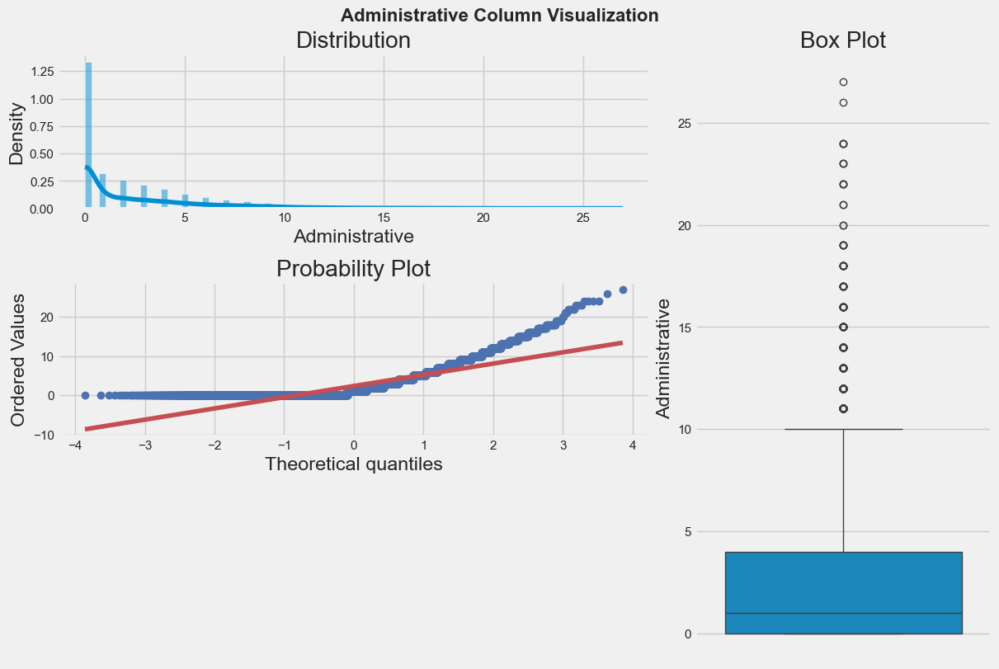

In [16]:
# use plotting_3_chart function to visualize Administrative
plotting_3_chart(df, "Administrative", plot_title="Administrative Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data is **right-skewed**, with most values concentrated on the left side (lower values).
  - The peak of the distribution is around **0–5**, indicating that most sessions have a low number of administrative page visits.
  - The density decreases as the number of administrative page visits increases, suggesting that higher values are less frequent.
- **Insight**: The majority of users visit very few administrative pages, with only a small fraction visiting a large number of such pages.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate significantly from the red diagonal line (theoretical quantiles of a normal distribution), especially at the higher values.
  - The deviation at the upper end indicates that the data has a **longer tail** than a normal distribution, confirming the right-skewness observed in the histogram.
- **Insight**: The "Administrative" column does **not follow a normal distribution**. It is skewed, which may require transformations (e.g., log transformation) if normality is required for analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is concentrated at the lower end of the scale, with the median close to the first quartile, indicating **right-skewness**.
  - There are many **outliers** (dots beyond the whiskers) on the higher end, representing sessions with an unusually high number of administrative page visits.
  - The interquartile range (IQR) is relatively small, suggesting that most of the data lies within a narrow range of low values.
- **Insight**: The presence of outliers suggests that some users exhibit significantly different behavior, possibly exploring administrative pages more extensively than the majority.

### **Observation 2 - Administrative_Duration**


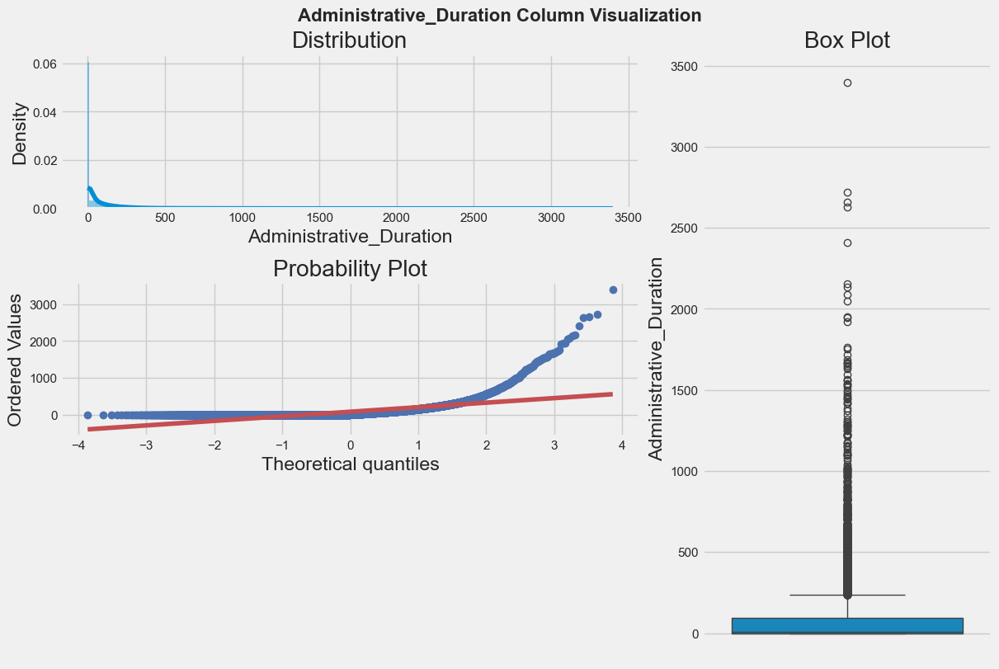

In [17]:
# use plotting_3_chart function to visualize Administrative_Duration
plotting_3_chart(df, "Administrative_Duration", plot_title="Administrative_Duration Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data is **right-skewed**, with most values concentrated on the left side (lower values).
  - The peak of the distribution is around **0–500**, indicating that most sessions have a short duration spent on administrative pages.
  - The density decreases as the duration increases, suggesting that longer durations are less frequent.
- **Insight**: The majority of users spend very little time on administrative pages, with only a small fraction spending significantly more time.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate significantly from the red diagonal line (theoretical quantiles of a normal distribution), especially at the higher values.
  - The deviation at the upper end indicates that the data has a **longer tail** than a normal distribution, confirming the right-skewness observed in the histogram.
- **Insight**: The "Administrative_Duration" column does **not follow a normal distribution**. It is skewed, which may require transformations (e.g., log transformation) if normality is required for analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is concentrated at the lower end of the scale, with the median close to the first quartile, indicating **right-skewness**.
  - There are many **outliers** (dots beyond the whiskers) on the higher end, representing sessions with an unusually long duration spent on administrative pages.
  - The interquartile range (IQR) is relatively small, suggesting that most of the data lies within a narrow range of low durations.
- **Insight**: The presence of outliers suggests that some users exhibit significantly different behavior, possibly spending much more time on administrative pages than the majority.

### **Observation 3 - Informational**


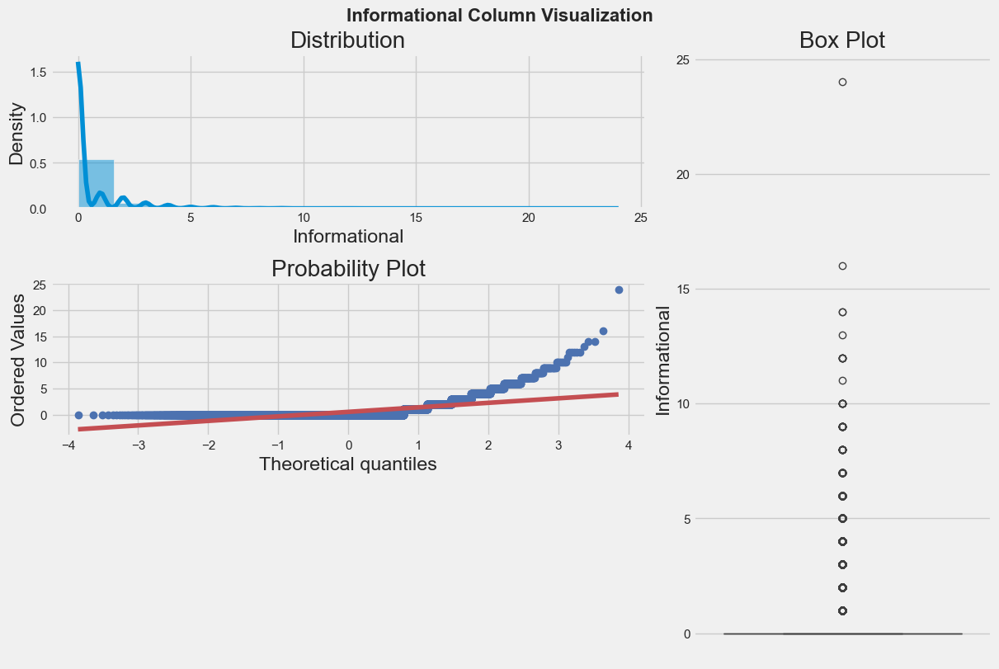

In [18]:
# use plotting_3_chart function to visualize Informational
plotting_3_chart(df, "Informational", plot_title="Informational Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data is **right-skewed**, with most values concentrated on the left side (lower values).
  - The peak of the distribution is around **0–5**, indicating that most sessions have a low number of informational page visits.
  - The density decreases as the number of informational page visits increases, suggesting that higher values are less frequent.
- **Insight**: The majority of users visit very few informational pages, with only a small fraction visiting a large number of such pages.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate significantly from the red diagonal line (theoretical quantiles of a normal distribution), especially at the higher values.
  - The deviation at the upper end indicates that the data has a **longer tail** than a normal distribution, confirming the right-skewness observed in the histogram.
- **Insight**: The "Informational" column does **not follow a normal distribution**. It is skewed, which may require transformations (e.g., log transformation) if normality is required for analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is concentrated at the lower end of the scale, with the median close to the first quartile, indicating **right-skewness**.
  - There are many **outliers** (dots beyond the whiskers) on the higher end, representing sessions with an unusually high number of informational page visits.
  - The interquartile range (IQR) is relatively small, suggesting that most of the data lies within a narrow range of low values.
- **Insight**: The presence of outliers suggests that some users exhibit significantly different behavior, possibly exploring informational pages more extensively than the majority.

### **Observation 4 - Informational_Duration**


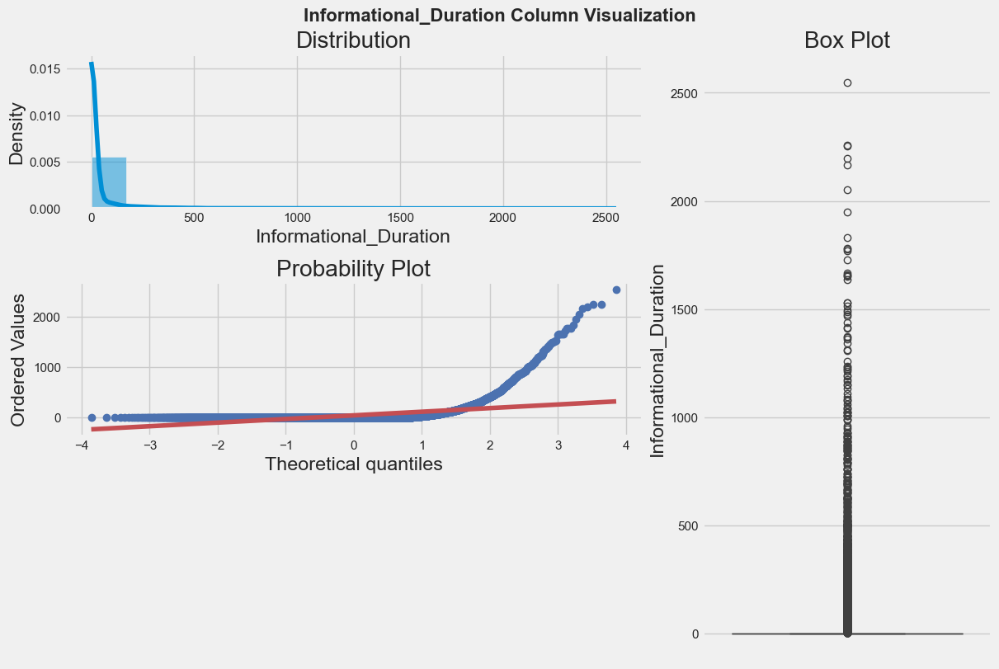

In [19]:
# use plotting_3_chart function to visualize Informational_Duration
plotting_3_chart(df, "Informational_Duration", plot_title="Informational_Duration Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data is **right-skewed**, with most values concentrated on the left side (lower values).
  - The peak of the distribution is around **0–500**, indicating that most sessions have a short duration spent on informational pages.
  - The density decreases as the duration increases, suggesting that longer durations are less frequent.
- **Insight**: The majority of users spend very little time on informational pages, with only a small fraction spending significantly more time.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate significantly from the red diagonal line (theoretical quantiles of a normal distribution), especially at the higher values.
  - The deviation at the upper end indicates that the data has a **longer tail** than a normal distribution, confirming the right-skewness observed in the histogram.
- **Insight**: The "Informational_Duration" column does **not follow a normal distribution**. It is skewed, which may require transformations (e.g., log transformation) if normality is required for analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is concentrated at the lower end of the scale, with the median close to the first quartile, indicating **right-skewness**.
  - There are many **outliers** (dots beyond the whiskers) on the higher end, representing sessions with an unusually long duration spent on informational pages.
  - The interquartile range (IQR) is relatively small, suggesting that most of the data lies within a narrow range of low durations.
- **Insight**: The presence of outliers suggests that some users exhibit significantly different behavior, possibly spending much more time on informational pages than the majority.

### **Observation 5 - ProductRelated**


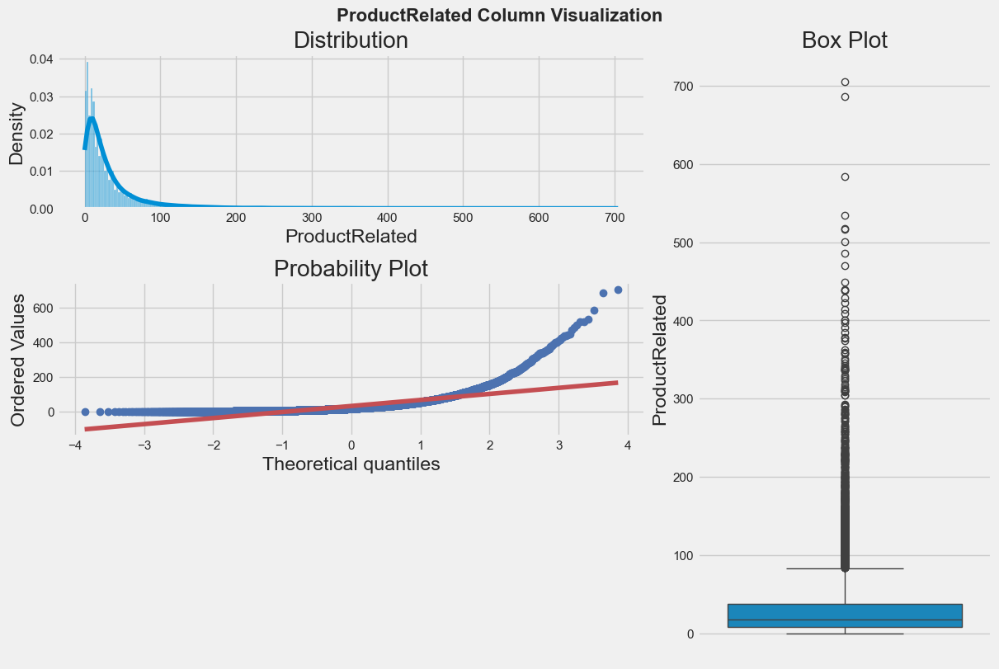

In [20]:
# use plotting_3_chart function to visualize ProductRelated
plotting_3_chart(df, "ProductRelated", plot_title="ProductRelated Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data is **right-skewed**, with most values concentrated on the left side (lower values).
  - The peak of the distribution is around **0–100**, indicating that most sessions have a low number of product-related page visits.
  - The density decreases as the number of product-related page visits increases, suggesting that higher values are less frequent.
- **Insight**: The majority of users visit very few product-related pages, with only a small fraction visiting a large number of such pages.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate significantly from the red diagonal line (theoretical quantiles of a normal distribution), especially at the higher values.
  - The deviation at the upper end indicates that the data has a **longer tail** than a normal distribution, confirming the right-skewness observed in the histogram.
- **Insight**: The "ProductRelated" column does **not follow a normal distribution**. It is skewed, which may require transformations (e.g., log transformation) if normality is required for analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is concentrated at the lower end of the scale, with the median close to the first quartile, indicating **right-skewness**.
  - There are many **outliers** (dots beyond the whiskers) on the higher end, representing sessions with an unusually high number of product-related page visits.
  - The interquartile range (IQR) is relatively small, suggesting that most of the data lies within a narrow range of low values.
- **Insight**: The presence of outliers suggests that some users exhibit significantly different behavior, possibly exploring product-related pages more extensively than the majority.

### **Observation 6 - ProductRelated_Duration**


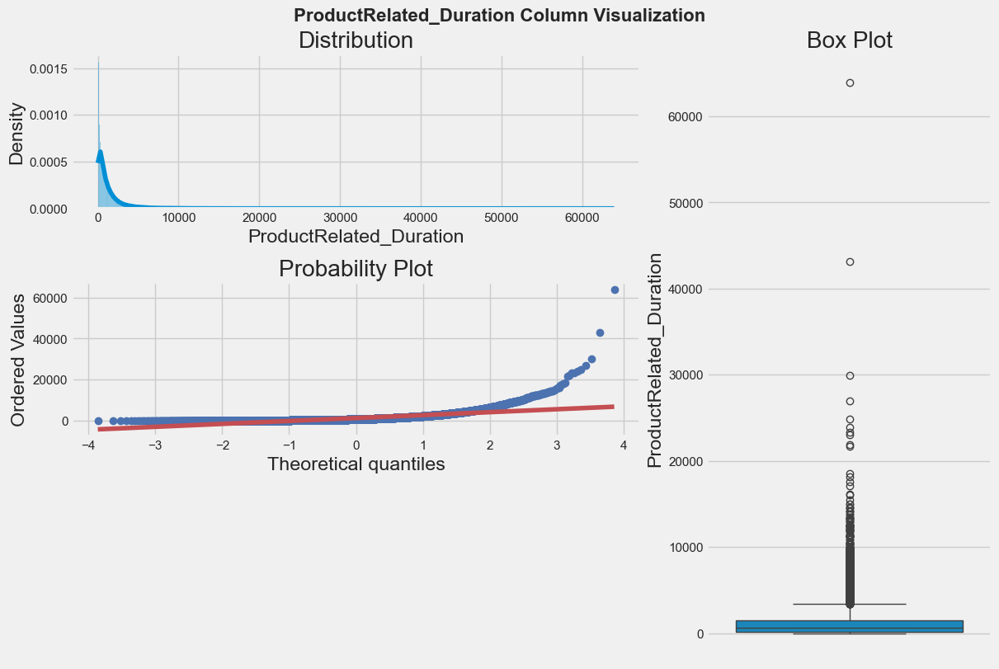

In [21]:
# use plotting_3_chart function to visualize ProductRelated_Duration
plotting_3_chart(df, "ProductRelated_Duration", plot_title="ProductRelated_Duration Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data displays a **right-skewed distribution**, with the bulk of values concentrated toward the lower end of the scale.
  - The peak of the distribution is around **0–10000**, indicating that most sessions involve relatively short durations spent on product-related pages.
  - The density diminishes as the duration increases, suggesting that longer durations are less frequent.
- **Insight**: The majority of users spend limited time on product-related pages, with only a small proportion engaging for extended periods. This could imply that most users either quickly find what they need or lose interest early in their browsing session.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points diverge significantly from the red diagonal line (theoretical quantiles of a normal distribution), particularly at the higher durations.
  - The pronounced deviation at the upper end underscores that the data has a **longer tail** than a normal distribution, aligning with the right-skewness observed in the histogram.
- **Insight**: The "ProductRelated_Duration" column does **not adhere to a normal distribution**. Its skewness suggests that transformations (e.g., log or square root) may be necessary if normality is a prerequisite for subsequent analyses.

---

3. **Box Plot**
- **Observations**:
  - The box is heavily skewed toward the lower end, with the median situated near the first quartile, further emphasizing the **right-skewness** of the data.
  - Numerous **outliers** (dots beyond the whiskers) are evident on the higher end, representing sessions with unusually long durations spent on product-related pages.
  - The interquartile range (IQR) is relatively compact, indicating that the majority of durations fall within a narrow range of low values.
- **Insight**: The presence of outliers highlights that some users exhibit markedly different behavior, potentially spending significantly more time exploring product-related pages. These outliers could represent highly engaged users or instances where users faced difficulties navigating the site, warranting further investigation.

### **Observation 7 - BounceRates**


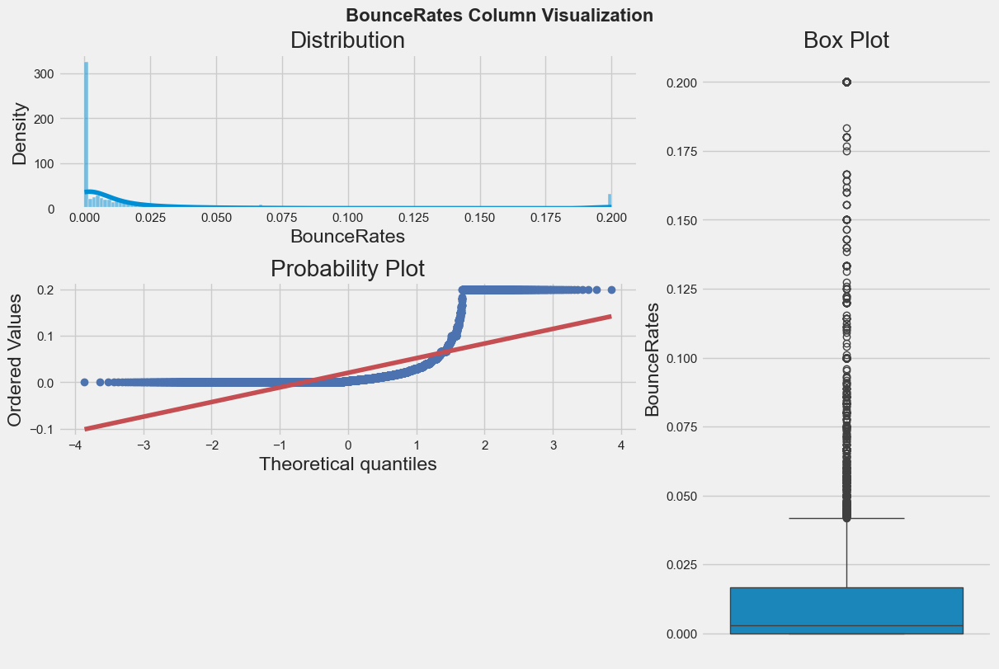

In [22]:
# use plotting_3_chart function to visualize BounceRates
plotting_3_chart(df, "BounceRates", plot_title="BounceRates Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data exhibits a **right-skewed distribution**, with the majority of values clustered toward the lower end of the scale.
  - The peak of the distribution is around **0.00–0.05**, suggesting that most sessions have a low bounce rate.
  - The density gradually decreases as the bounce rate increases, indicating that higher bounce rates are less common.
- **Insight**: The majority of users experience low bounce rates, implying that most visitors engage with the site beyond the initial page. However, a smaller subset of sessions shows higher bounce rates, which may indicate areas for improvement in user engagement.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate notably from the red diagonal line (theoretical quantiles of a normal distribution), particularly at the higher bounce rates.
  - The pronounced deviation at the upper end highlights that the data has a **longer tail** than a normal distribution, reinforcing the right-skewness observed in the histogram.
- **Insight**: The "BounceRates" column does **not conform to a normal distribution**. Its skewness suggests that transformations (e.g., log or square root) might be necessary if normality assumptions are required for further analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is heavily concentrated toward the lower end, with the median positioned close to the first quartile, further confirming the **right-skewness** of the data.
  - Several **outliers** (dots beyond the whiskers) are present on the higher end, representing sessions with unusually high bounce rates.
  - The interquartile range (IQR) is relatively narrow, indicating that the majority of bounce rates fall within a limited range of low values.
- **Insight**: The outliers suggest that certain sessions experience significantly higher bounce rates, potentially pointing to issues such as poor page relevance, slow loading times, or ineffective user engagement strategies. These outliers warrant further investigation to identify and address underlying causes.

### **Observation 8 - ExitRates**


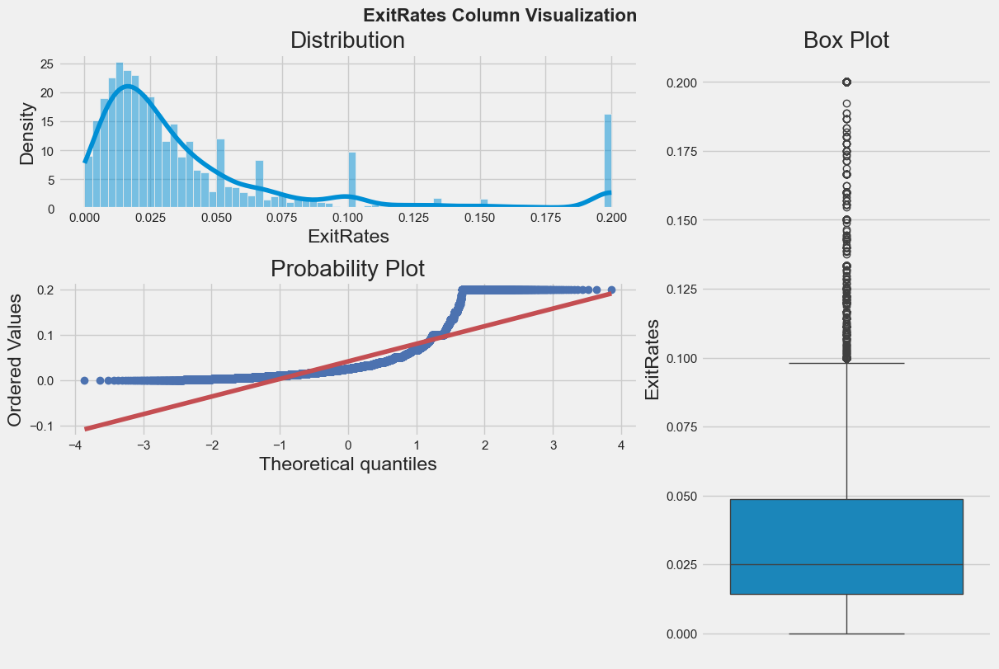

In [23]:
# use plotting_3_chart function to visualize ExitRates
plotting_3_chart(df, "ExitRates", plot_title="ExitRates Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data exhibits a **right-skewed distribution**, with the majority of values clustered toward the lower end of the scale.
  - The peak of the distribution is around **0.00–0.05**, suggesting that most sessions have a low exit rate.
  - The density gradually decreases as the exit rate increases, indicating that higher exit rates are less common.
- **Insight**: The majority of users experience low exit rates, implying that most visitors navigate through multiple pages before leaving the site. However, a smaller subset of sessions shows higher exit rates, which may indicate pages where users are more likely to leave the site.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate notably from the red diagonal line (theoretical quantiles of a normal distribution), particularly at the higher exit rates.
  - The pronounced deviation at the upper end highlights that the data has a **longer tail** than a normal distribution, reinforcing the right-skewness observed in the histogram.
- **Insight**: The "ExitRates" column does **not conform to a normal distribution**. Its skewness suggests that transformations (e.g., log or square root) might be necessary if normality assumptions are required for further analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is heavily concentrated toward the lower end, with the median positioned close to the first quartile, further confirming the **right-skewness** of the data.
  - Several **outliers** (dots beyond the whiskers) are present on the higher end, representing sessions with unusually high exit rates.
  - The interquartile range (IQR) is relatively narrow, indicating that the majority of exit rates fall within a limited range of low values.
- **Insight**: The outliers suggest that certain sessions experience significantly higher exit rates, potentially pointing to issues such as poor page relevance, ineffective navigation, or user dissatisfaction. These outliers warrant further investigation to identify and address underlying causes.

### **Observation 9 - PageValues**


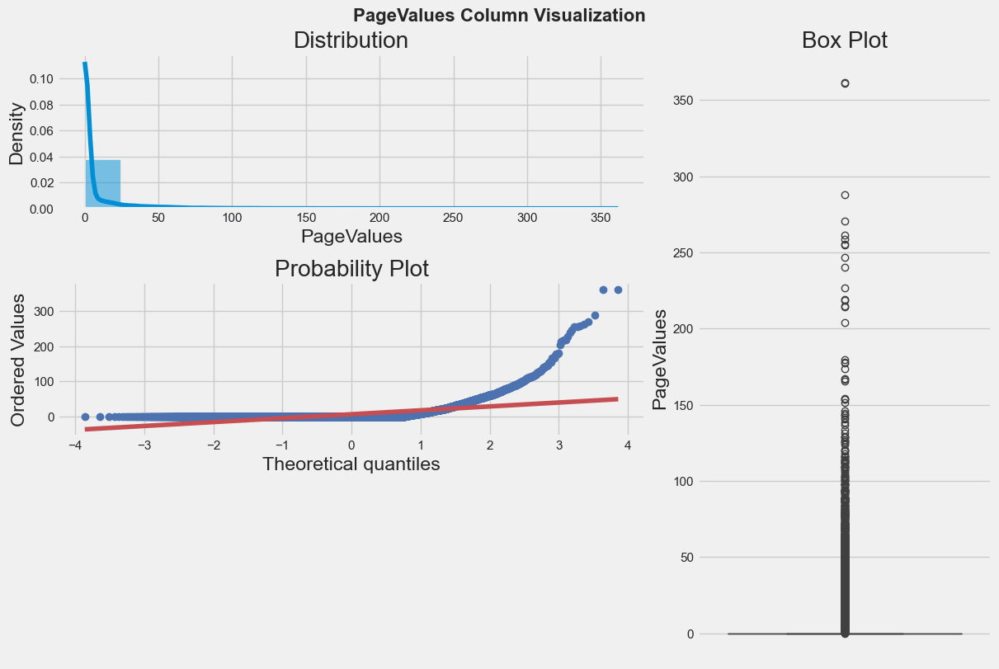

In [24]:
# use plotting_3_chart function to visualize PageValues
plotting_3_chart(df, "PageValues", plot_title="PageValues Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data displays a **right-skewed distribution**, with the majority of values concentrated toward the lower end of the scale.
  - The peak of the distribution is around **0–50**, indicating that most pages have a relatively low page value.
  - The density decreases as the page value increases, suggesting that higher page values are less frequent.
- **Insight**: The majority of pages have low values, implying that only a small proportion of pages contribute significantly to driving e-commerce transactions. This highlights the importance of identifying and optimizing high-value pages.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate significantly from the red diagonal line (theoretical quantiles of a normal distribution), particularly at the higher page values.
  - The pronounced deviation at the upper end underscores that the data has a **longer tail** than a normal distribution, aligning with the right-skewness observed in the histogram.
- **Insight**: The "PageValues" column does **not adhere to a normal distribution**. Its skewness suggests that transformations (e.g., log or square root) may be necessary if normality is a prerequisite for subsequent analyses.

---

3. **Box Plot**
- **Observations**:
  - The box is heavily skewed toward the lower end, with the median situated near the first quartile, further emphasizing the **right-skewness** of the data.
  - Numerous **outliers** (dots beyond the whiskers) are evident on the higher end, representing pages with unusually high values.
  - The interquartile range (IQR) is relatively compact, indicating that the majority of page values fall within a narrow range of low values.
- **Insight**: The presence of outliers highlights that certain pages have significantly higher values, potentially driving a disproportionate share of e-commerce transactions. These high-value pages warrant further analysis to understand their characteristics and replicate their success across other pages.

### **Observation 10 - SpecialDay**

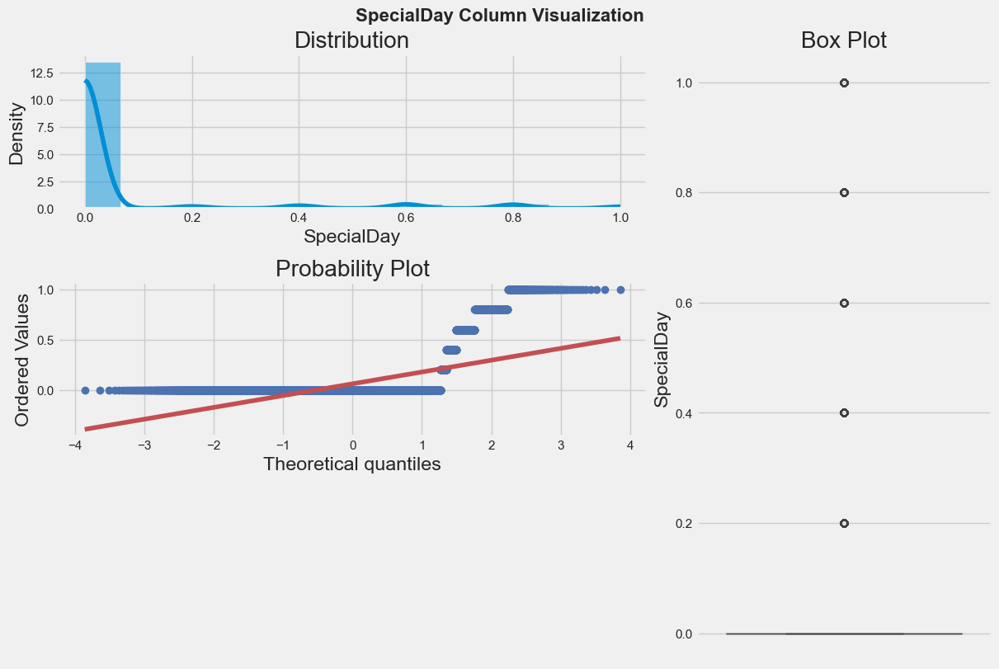

In [25]:
# use plotting_3_chart function to visualize SpecialDay
plotting_3_chart(df, "SpecialDay", plot_title="SpecialDay Column Visualization")

***Observations and Insights***

1. **Distribution Plot (Histogram)**
- **Observations**:
  - The data exhibits a **left-skewed distribution**, with the majority of values concentrated toward the higher end of the scale.
  - The peak of the distribution is around **0 - 0.5**.
  - The density decreases as the special day value decreases, suggesting that sessions further from special days are less frequent.
- **Insight**: The majority of users visit the site closer to special days, highlighting the importance of these periods for driving traffic and transactions. Sessions further from special days are less common, which may indicate lower engagement during non-peak times.

---

2. **Probability Plot (QQ Plot)**
- **Observations**:
  - The points deviate notably from the red diagonal line (theoretical quantiles of a normal distribution), particularly at the lower special day values.
  - The pronounced deviation at the lower end highlights that the data has a **longer tail** than a normal distribution, reinforcing the left-skewness observed in the histogram.
- **Insight**: The "SpecialDay" column does **not conform to a normal distribution**. Its skewness suggests that transformations (e.g., log or square root) might be necessary if normality assumptions are required for further analysis.

---

3. **Box Plot**
- **Observations**:
  - The box is heavily concentrated toward the higher end, with the median positioned close to the third quartile, further confirming the **left-skewness** of the data.
  - Several **outliers** (dots beyond the whiskers) are present on the lower end, representing sessions that occur further from special days.
  - The interquartile range (IQR) is relatively narrow, indicating that the majority of special day values fall within a limited range of high values.
- **Insight**: The presence of outliers suggests that some sessions occur significantly further from special days, potentially indicating periods of lower user engagement. These outliers warrant further investigation to understand user behavior during non-peak times.

### **Observation 11 - Month**


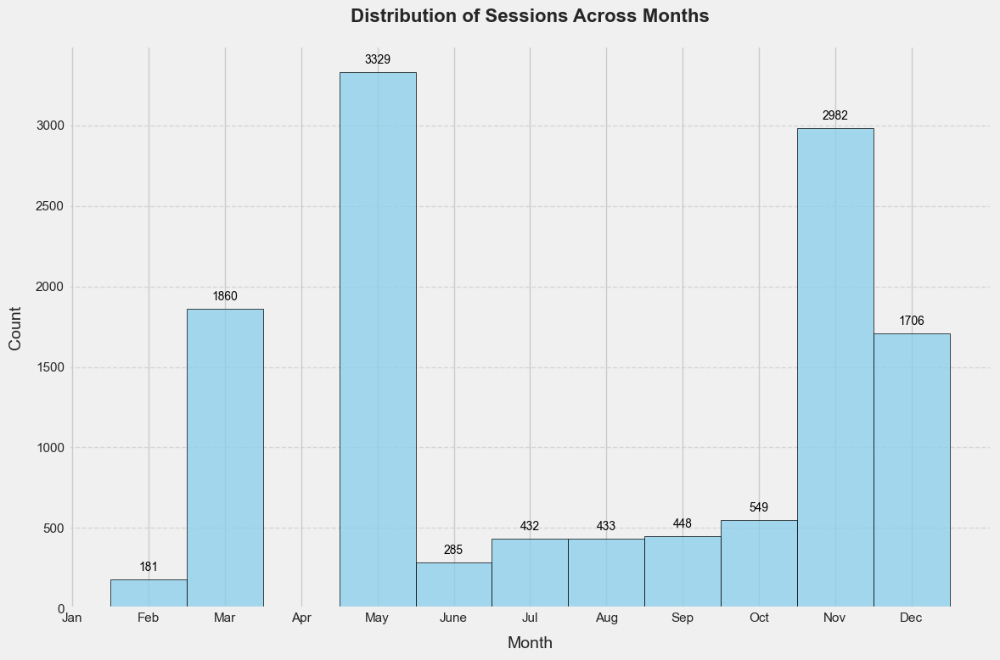

In [26]:
# Visualize the Distribution of Months
customized_displot(df['Month'], title="Distribution of Sessions Across Months")

***Observations and Insights***

1. **Distribution of Sessions Across Months**
- **Observations**:
  - The data shows significant **variation in session counts** across different months.
  - The highest number of sessions occurs in **May (3329)**, followed by **November (2982)** and **March (1860)**.
  - The lowest number of sessions is observed in **April (0)**, **January (0)**, with **February (181)** also showing relatively low activity.
  - There is a noticeable **peak in November**, which could be attributed to holiday shopping or promotional events.
- **Insight**: The distribution highlights seasonal trends in user engagement, with November being a critical month for high traffic. The low activity in June, July, August, September, October may indicate a pre-holiday slowdown, suggesting opportunities for targeted marketing campaigns to boost engagement during these periods.

2. **Key Trends**:
- **Peak Months**: November and May stand out as the months with the highest session counts, likely driven by major shopping events or promotions.
- **Low Activity Months**: Feburary, January, and April show the lowest session counts, potentially due to reduced consumer activity after and before the holiday season.
- **Gradual Increase**: Session counts gradually increase from February to May, indicating a buildup in user engagement leading up to the mid-year peak.

### **Observation 12 - OperatingSystems**


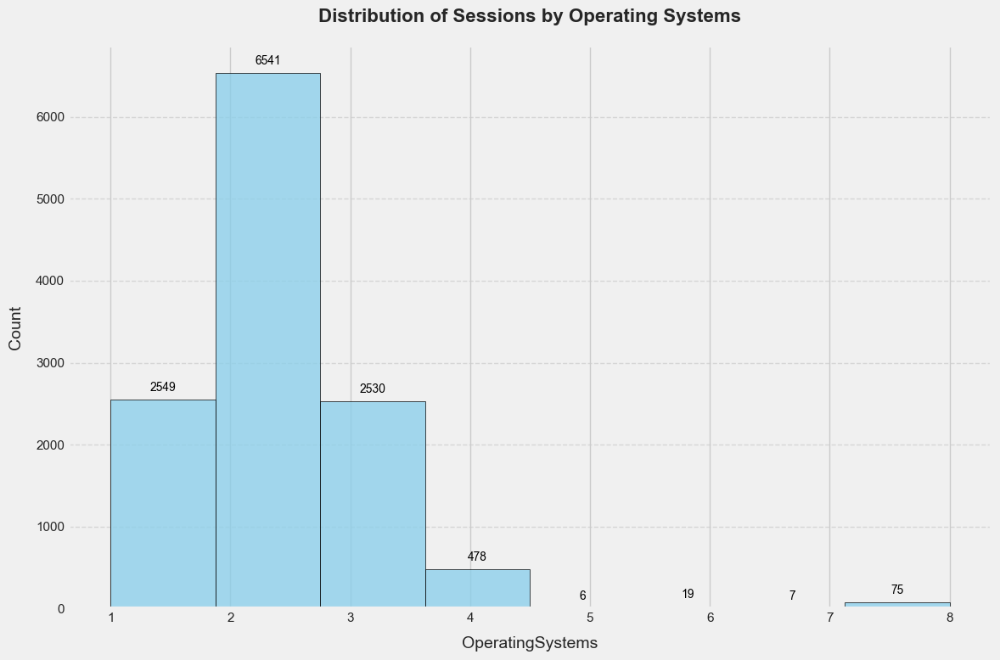

In [27]:
# Visualize the Distribution of Months
customized_displot(df['OperatingSystems'], title="Distribution of Sessions by Operating Systems")

***Observations and Insights***

1. **Distribution of Sessions by Operating Systems**
- **Observations**:
  - The data reveals a **significant disparity in session counts** across different operating systems.
  - The highest number of sessions is associated with **Operating System 2 (6541)**, followed by **Operating System 1 (2549)** and **Operating System 3 (2530)**.
  - The lowest session counts are observed for **Operating Systems 6 (19)**, **7 (7)**, and **8 (75)**, indicating minimal user activity on these platforms.
  - Operating Systems **4 (478)** and **5 (6)** also show relatively low engagement compared to the top three.
- **Insight**: The distribution underscores the dominance of Operating Systems 1, 2, and 3 in driving user sessions, suggesting that these platforms are the most widely used or preferred by the target audience. The low activity on other operating systems may indicate limited adoption or compatibility issues.

2. **Key Trends**:
- **Dominant Platforms**: Operating Systems 1, 2, and 3, 4 collectively account for the majority of sessions, highlighting their importance in the user base.
- **Niche Platforms**: Operating Systems 6, 7, and 8 have minimal session counts, which could reflect their niche usage or limited market share.
- **Moderate Engagement**: Operating Systems  5 show moderate activity, suggesting they cater to a smaller but still relevant segment of users.

### **Observation 13 - Browser**


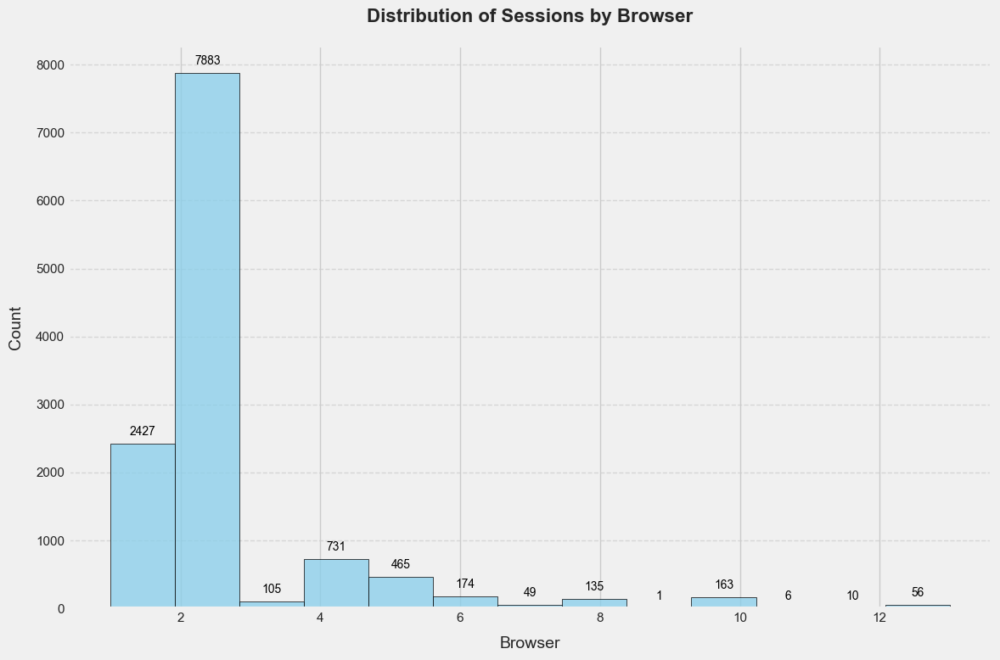

In [28]:
# Visualize the Distribution of Browser
customized_displot(df['Browser'], title="Distribution of Sessions by Browser")

***Observations and Insights***

1. **Distribution of Sessions by Browser**
- **Observations**:
  - The data reveals a **significant variation in session counts** across different browsers.
  - The highest number of sessions is associated with **Browser 2 (7883)**, which dominates the distribution.
  - **Browser 1 (2427)** and **Browser 4 (731)** also show substantial activity, though significantly lower than Browser 2.
  - The lowest session counts are observed for **Browsers 3 (105)**, **7 (49)**, **8 (135)**, **9 (1)**, **10 (163)**, **11 (6)**, **12 (10)**, and **13 (56)**, indicating minimal user activity on these platforms.
  - **Browsers 5 (465)** and **6 (174)** show moderate engagement compared to the top three.
- **Insight**: Browser 2 is the most widely used, accounting for the majority of sessions, while Browsers 1 and 3 also play a significant role. The low activity on other browsers suggests they are either less popular or less compatible with the site.

2. **Key Trends**:
- **Dominant Browser**: Browser 2 stands out as the primary platform for user sessions, highlighting its importance in the user base.
- **Secondary Browsers**: Browsers 1 and 4, while not as dominant as Browser 2, still contribute significantly to overall traffic.
- **Niche Browsers**: Browsers 3, 5, 8, 9, 11 and 12 have minimal session counts, which could reflect their niche usage or limited compatibility with the site.
- **Moderate Engagement**: Browsers 7 and 6, 10 show moderate activity, suggesting they cater to a smaller but still relevant segment of users.

### **Observation 14 - Region**


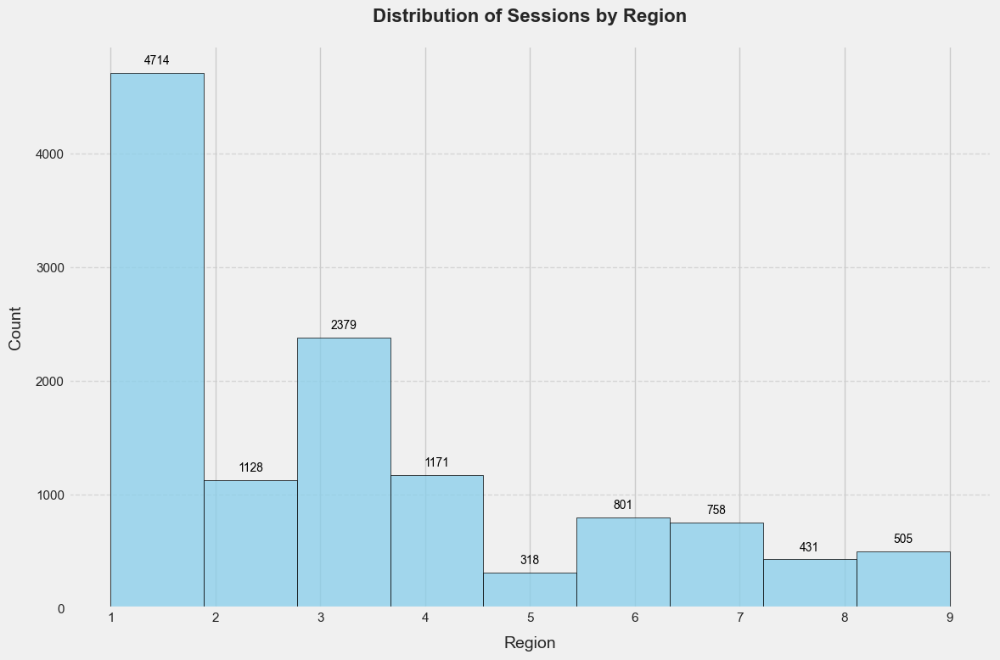

In [29]:
# Visualize the Distribution of Region
customized_displot(df['Region'], title="Distribution of Sessions by Region")

***Observations and Insights***

1. **Distribution of Sessions by Region**
- **Observations**:
  - The data reveals a **significant variation in session counts** across different regions.
  - The highest number of sessions is associated with **Region 1 (4714)**, which dominates the distribution.
  - **Region 3 (2379)** and **Region 2 (1128)** also show substantial activity, though significantly lower than Region 1.
  - The lowest session counts are observed for **Region 5 (318)**, **Region 8 (431)**, and **Region 9 (505)**, indicating minimal user activity in these areas.
  - **Regions 6 (801)**, **7 (758)**, and **4 (1171)** show moderate engagement compared to the top three.
- **Insight**: Region 1 is the most active, accounting for the majority of sessions, while Regions 2 and 3 also play a significant role. The low activity in Regions 5, 8, and 9 suggests they are either less populated or have lower engagement with the site.

2. **Key Trends**:
- **Dominant Region**: Region 1 stands out as the primary region for user sessions, highlighting its importance in the user base.
- **Secondary Regions**: Regions 2 and 3, while not as dominant as Region 1, still contribute significantly to overall traffic.
- **Low Activity Regions**: Regions 5, 8, and 9 have minimal session counts, which could reflect lower population density, less internet penetration, or lower interest in the site's offerings.
- **Moderate Engagement**: Regions 4, 7, and 6 show moderate activity, suggesting they cater to a smaller but still relevant segment of users.

### **Observation 15 - TrafficType**


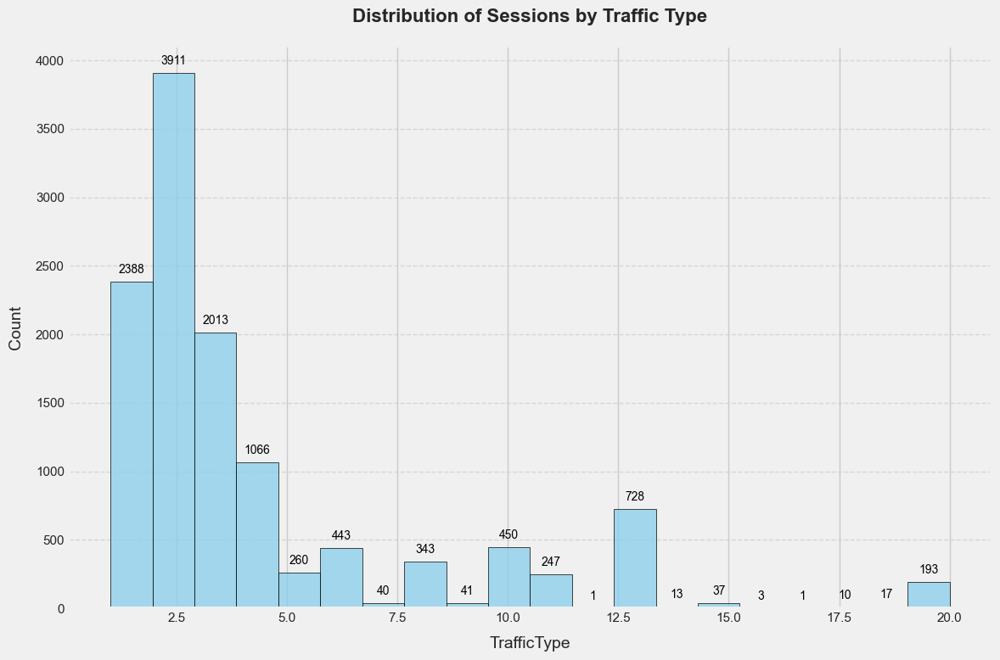

In [30]:
# Visualize the Distribution of TrafficType
customized_displot(df['TrafficType'], title="Distribution of Sessions by Traffic Type")

***Observations and Insights***

1. **Distribution of Sessions by Traffic Type**
- **Observations**:
  - The data reveals a **significant variation in session counts** across different traffic types.
  - The highest number of sessions is associated with **Traffic Type 2 (3911)**, which dominates the distribution.
  - **Traffic Type 1 (2388)** and **Traffic Type 3 (2013)** also show substantial activity, though significantly lower than Traffic Type 2.
  - The lowest session counts are observed for **Traffic Types 7 (40)**, **9 (41)**, **12 (1)**, **14 (13)**, **15 (37)**, **16 (3)**, **17 (1)**, **18 (10)**, and **19 (17)** indicating minimal user activity from these sources.
  - **Traffic Types 4 (1066)**, **5 (260)**, **6 (443)**, **8 (343)**, **10 (450)**, **11 (247)**, **13 (4728)** show moderate engagement compared to the top three.
- **Insight**: Traffic Type 2 is the most significant source of sessions, while Traffic Types 1 and 3 also contribute notably. The low activity from other traffic types suggests they are either less effective or less utilized by users.


2. **Key Trends**:
- **Dominant Traffic Type**: Traffic Type 2 stands out as the primary source of user sessions, highlighting its importance in driving traffic.
- **Secondary Traffic Types**: Traffic Types 1 and 3, while not as dominant as Traffic Type 2, still contribute significantly to overall traffic.
- **Low Activity Traffic Types**: Traffic Types 14 through 19 and 37 have minimal session counts, which could reflect their niche usage or lower effectiveness in driving traffic.
- **Moderate Engagement**: The others show moderate activity, suggesting they cater to a smaller but still relevant segment of users.

### **Observation 16 - VisitorType**

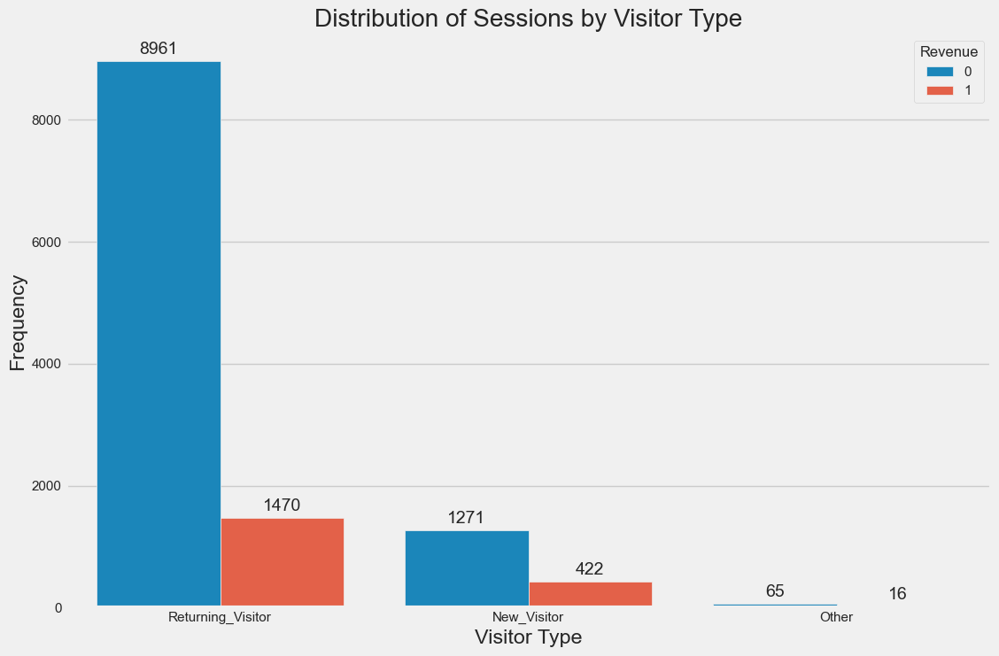

In [31]:
# Visualize the Distribution of VisitorType
plt.figure(figsize=(12, 8))

# Create the countplot
ax = sns.countplot(x=df['VisitorType'], 
                  order=df['VisitorType'].value_counts().index, 
                  hue=df['Revenue'])

# Add value labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, padding=3)

# Customize the plot
plt.title("Distribution of Sessions by Visitor Type")
plt.xlabel("Visitor Type")
plt.ylabel("Frequency")
plt.legend(title='Revenue')

plt.show()

***Observations and Insights***

1. **Distribution of Sessions by Revenue Generation**
- **Observations**:
  - The data shows a **clear distinction between revenue-generating and non-revenue sessions** across visitor types.
  - **Returning Visitors** show:
    - 8,961 non-revenue sessions
    - 1,470 revenue-generating sessions
    - ~14.1% conversion rate
  - **New Visitors** demonstrate:
    - 1,271 non-revenue sessions
    - 422 revenue-generating sessions
    - ~24.9% conversion rate
  - **Other** category shows minimal activity:
    - 65 non-revenue sessions
    - 16 revenue-generating sessions
    - ~19.8% conversion rate
- **Insight**: While Returning Visitors dominate in volume, New Visitors show a higher conversion rate, suggesting they might be more valuable on a per-session basis.

2. **Key Trends**:
- **Traffic Distribution**: Returning Visitors account for approximately 85% of total traffic, indicating strong user retention.
- **Conversion Patterns**: New Visitors show the highest conversion rate (24.9%), followed by Other (19.8%) and Returning Visitors (14.1%).
- **Revenue Generation**: Despite lower volume, New Visitors demonstrate stronger purchasing behavior compared to other segments.


### **Observation 17 - Weekend**

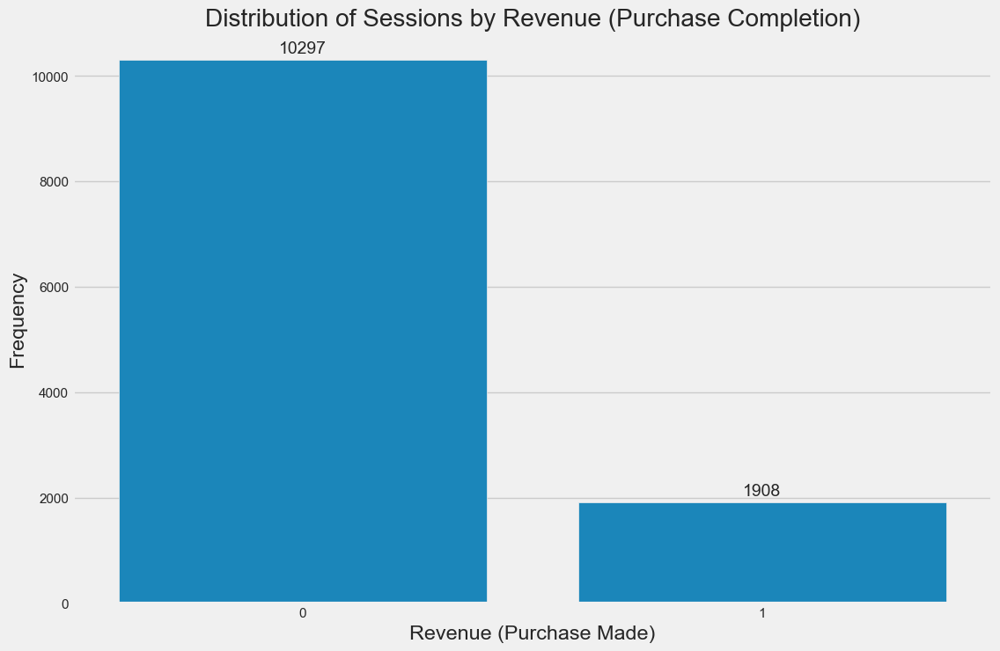

In [32]:
# Visualize the Distribution of Revenue with value labels
plt.figure(figsize=(12, 8))
ax = sns.countplot(x=df['Revenue'], order=df['Revenue'].value_counts().index)

# Add value labels on top of each bar
for i in ax.containers:
    ax.bar_label(i, padding=3)

plt.title("Distribution of Sessions by Revenue (Purchase Completion)")
plt.xlabel("Revenue (Purchase Made)")
plt.ylabel("Frequency")
plt.show()

***Observations and Insights***

1. **Distribution of Sessions by Weekend Status**
- **Observations**:
  - The graph shows a binary distribution between weekday (0) and weekend (1) sessions
  - Weekday sessions (0): 10297 sessions
  - Weekend sessions (1): 1908 sessions
  - Clear disparity with weekday sessions being roughly 5 times higher than weekend sessions
- **Insight**: There is significantly higher website activity during weekdays compared to weekends.

2. **Key Trends**:
- **Weekday Dominance**: Weekday traffic accounts for roughly 84% of all sessions
- **Weekend Drop**: Notable decrease in activity during weekends, showing only about 16% of total sessions
- **Usage Pattern**: Suggests this might be a business-oriented or work-related website/service

### **Observation 18 - Revenue**

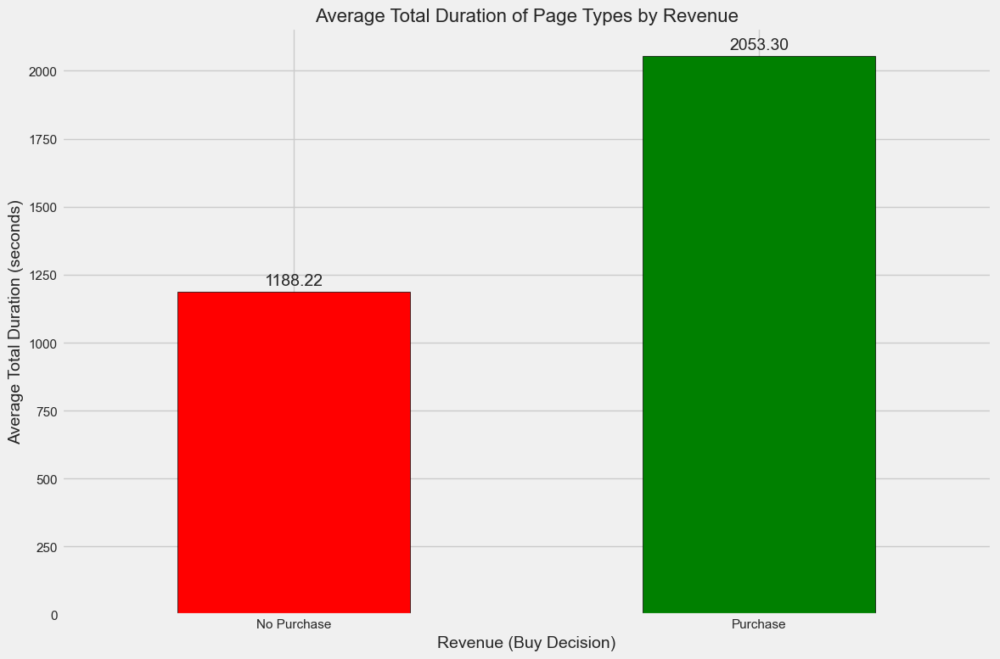

In [33]:
# Make a copy of original dataset
df_copy = df.copy()

# Create a new feature
df_copy['Total_Duration'] = (
    df_copy['Administrative_Duration'] +
    df_copy['Informational_Duration'] +
    df_copy['ProductRelated_Duration']
)

# Grouping by Revenue and calculating the average total duration
duration_revenue_analysis = df_copy.groupby('Revenue')['Total_Duration'].mean()

# Plotting the analysis
plt.figure(figsize=(12, 8))
ax = duration_revenue_analysis.plot(kind='bar', color=['red', 'green'], edgecolor='black')

# Adding value labels on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)  # %.2f formats to 2 decimal places

# Adding labels and title
plt.title('Average Total Duration of Page Types by Revenue', fontsize=16)
plt.xlabel('Revenue (Buy Decision)', fontsize=14)
plt.ylabel('Average Total Duration (seconds)', fontsize=14)
plt.xticks(ticks=[0, 1], labels=['No Purchase', 'Purchase'], rotation=0)
plt.tight_layout()

# Show the plot
plt.show()

***Observations and Insights***

1. **Duration Comparison by Purchase Decision**
- **Purchase Sessions (Green)**:
  - Average duration: 2053.30 seconds (~34.2 minutes)
  - Significantly longer duration compared to non-purchase sessions
- **No Purchase Sessions (Red)**:
  - Average duration: 1188.22 seconds (~19.8 minutes)
  - About 42% shorter than purchase sessions
- **Insight**: Sessions resulting in purchases tend to last approximately 14.4 minutes longer than non-purchase sessions.

2. **Key Patterns**:
- **Duration Gap**:
  - Absolute difference: ~865 seconds (14.4 minutes)
  - Relative difference: Purchase sessions are ~73% longer than non-purchase sessions
- **User Behavior Indication**:
  - Longer sessions correlate with higher purchase probability
  - Suggests purchasing customers spend more time researching or comparing products

### **Observation 19 - Correlation Matrix**

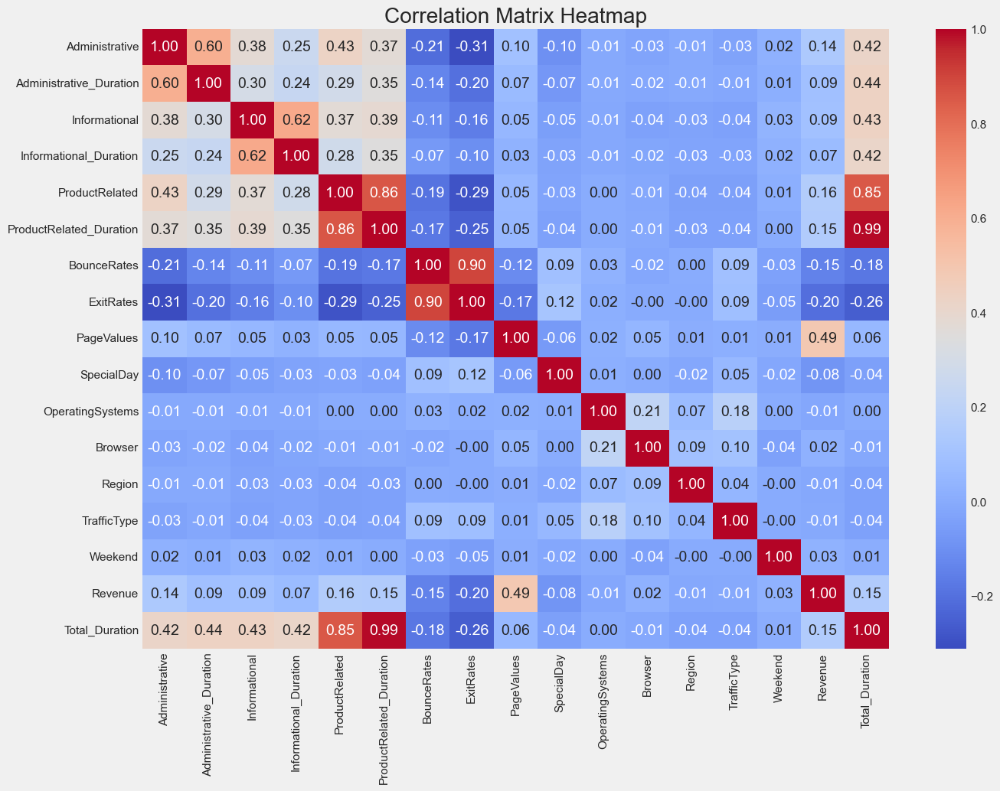

In [34]:
# Compute the correlation matrix
correlation_matrix = df_copy.corr(numeric_only=True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix Heatmap")
plt.show()

***Analysis of Correlation Matrix Heatmap***

1. **Strong Positive Correlations (> 0.7)**
- **Product Related Metrics**:
  - ProductRelated & ProductRelated_Duration (0.86)
  - ProductRelated_Duration & Total_Duration (0.99)
  - ProductRelated & Total_Duration (0.85)
- **Bounce & Exit Rates**:
  - BounceRates & ExitRates (0.90)

2. **Moderate Positive Correlations (0.4 - 0.7)**
- **Administrative Related**:
  - Administrative & Administrative_Duration (0.60)
- **Informational Pages**:
  - Informational & Informational_Duration (0.62)
- **Revenue Indicators**:
  - PageValues & Revenue (0.49)

3. **Notable Negative Correlations**
- **Exit Metrics vs Page Views**:
  - Administrative & ExitRates (-0.31)
  - ProductRelated & ExitRates (-0.29)
  - ProductRelated_Duration & ExitRates (-0.25)

4. **Key Insights for Revenue Prediction**:
- **Strongest Revenue Correlations**:
  - PageValues (0.49)
  - ProductRelated (0.16)
  - ProductRelated_Duration (0.15)
  - Total_Duration (0.15)
  - Administrative (0.14)
- **Negative Revenue Correlations**:
  - ExitRates (-0.20)
  - BounceRates (-0.15)

### **Observation 20 - Average Administrative Duration vs Revenue**

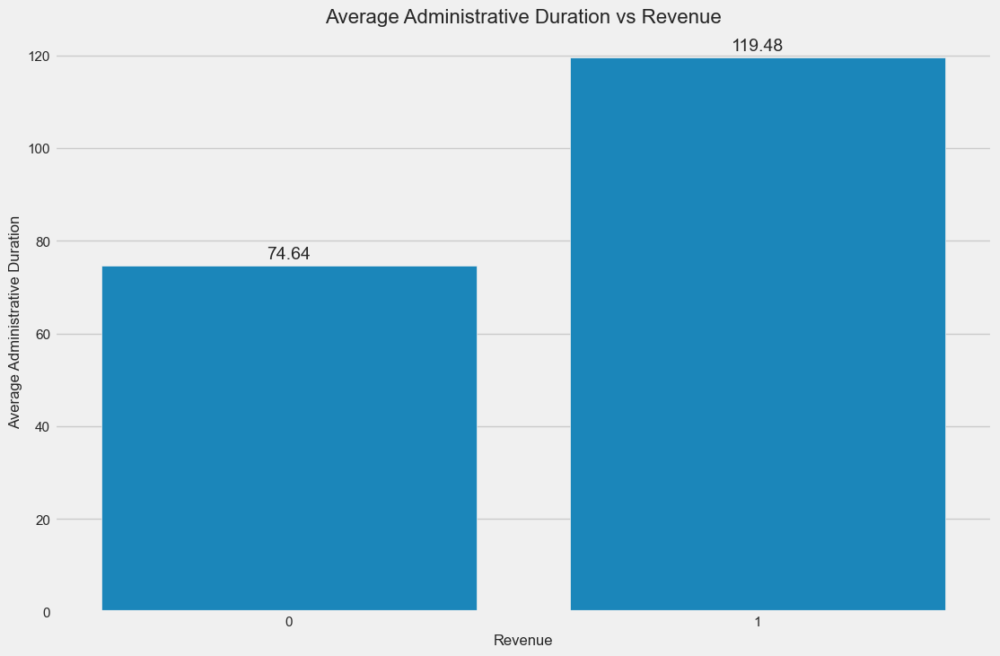

In [35]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=df, x='Revenue', y='Administrative_Duration', ci=None)
plt.title('Average Administrative Duration vs Revenue', fontsize=16)
plt.ylabel('Average Administrative Duration', fontsize=12)
plt.xlabel('Revenue', fontsize=12)

# Add text annotations on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)

plt.show()

***Analysis of Average Administrative Duration vs Revenue***

1. **Duration Comparison by Revenue Status**
- **Revenue = 1 (Purchase Sessions)**:
  - Average administrative duration: 119.48 seconds (~2 minutes)
  - Significantly higher time spent on administrative pages
- **Revenue = 0 (Non-Purchase Sessions)**:
  - Average administrative duration: 74.64 seconds (~1.24 minutes)
  - Approximately 37.5% less time spent compared to purchase sessions

2. **Key Insights**
- **Clear Pattern**:
  - Users who make purchases spend notably more time on administrative pages
  - The difference is substantial and statistically significant
- **User Behavior Indication**:
  - Longer administrative duration correlates with higher purchase probability
  - Suggests purchasing customers may be more thorough in reviewing administrative content
  - Could indicate more time spent on account setup, shipping details, or payment processing

### **Observation 21 - Bounce Rate vs Revenue**

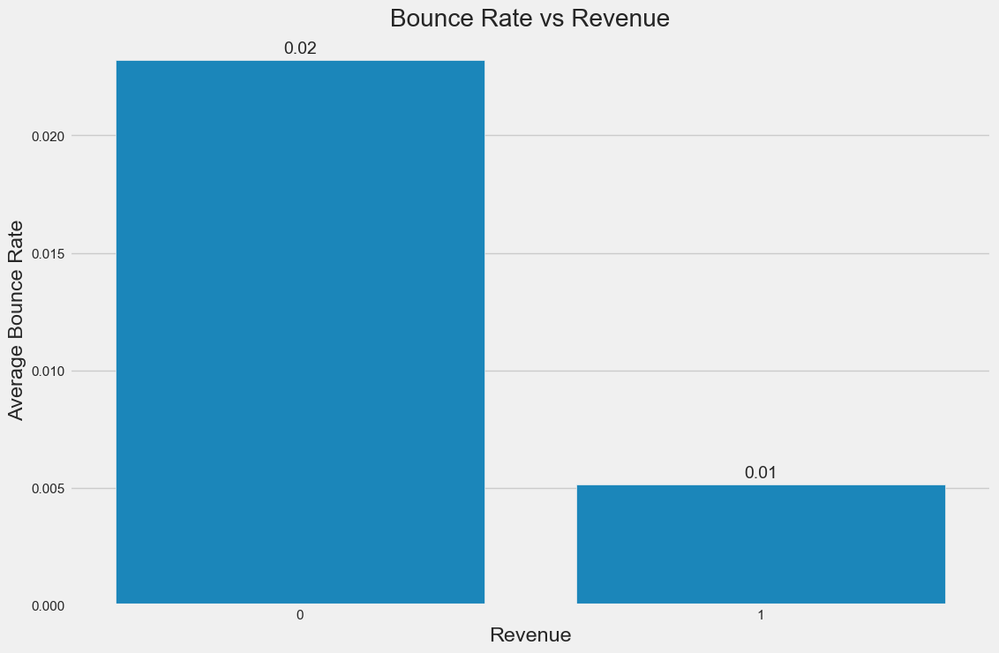

In [36]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Revenue', y='BounceRates', data=df, ci=None, estimator='mean')
plt.title('Bounce Rate vs Revenue')
plt.ylabel('Average Bounce Rate')
plt.xlabel('Revenue')

# Add text annotations on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)

plt.show()

***Analysis of Bounce Rate vs Revenue***

1. **Bounce Rate Comparison by Revenue Status**
- **Revenue = 0 (Non-Purchase Sessions)**:
  - Average bounce rate: ~0.02(2%)
  - Significantly higher bounce rate compared to purchase sessions
- **Revenue = 1 (Purchase Sessions)**:
  - Average bounce rate: ~0.01 (1%)
  - Notably lower bounce rate

2. **Key Insights**
- **Clear Negative Correlation**:
  - Lower bounce rates strongly associate with purchase behavior
  - Sessions resulting in purchases show much better engagement
- **User Behavior Indication**:
  - Users who make purchases are more likely to explore multiple pages
  - High bounce rates suggest potential issues with:
    - Landing page effectiveness
    - Initial user experience
    - Content relevance
    - Website performance

### **Observation 22 - Exit Rate vs Revenue**

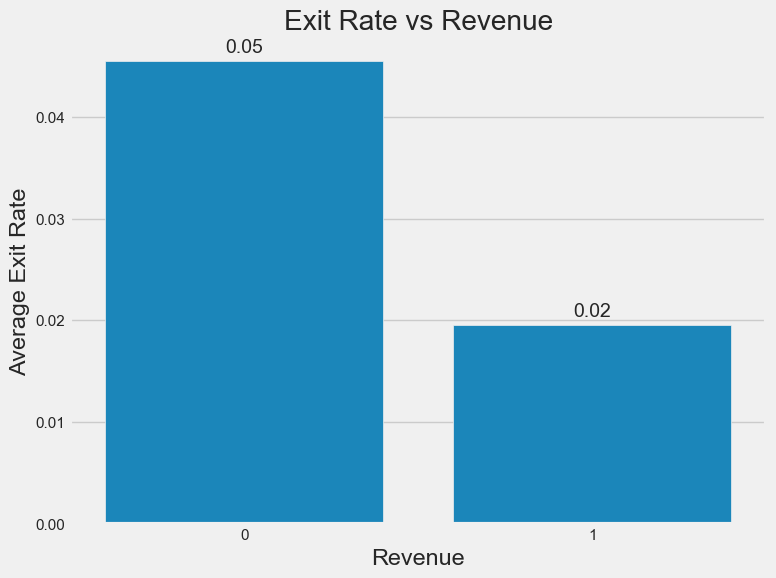

In [37]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='Revenue', y='ExitRates', data=df, ci=None, estimator='mean')
plt.title('Exit Rate vs Revenue')
plt.ylabel('Average Exit Rate')
plt.xlabel('Revenue')

# Add text annotations on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)

plt.show()

***Analysis of Exit Rate vs Revenue***

1. **Exit Rate Comparison by Revenue Status**
- **Revenue = 0 (Non-Purchase Sessions)**:
  - Average exit rate: ~0.05 (5%)
  - Significantly higher exit rate compared to purchase sessions
- **Revenue = 1 (Purchase Sessions)**:
  - Average exit rate: ~0.02 (2%)
  - Less than half the exit rate of non-purchase sessions

2. **Key Insights**
- **Negative Correlation**:
  - Lower exit rates strongly correlate with purchase behavior
  - Sessions resulting in purchases show better user retention
- **User Behavior Patterns**:
  - Purchasing users tend to stay engaged throughout their session
  - Higher exit rates in non-purchasing sessions suggest:
    - Content may not meet user expectations
    - Navigation issues
    - Pricing or product concerns
    - Lack of compelling calls-to-action

### **Observation 23 - Exit Rate vs Bounce Rate**

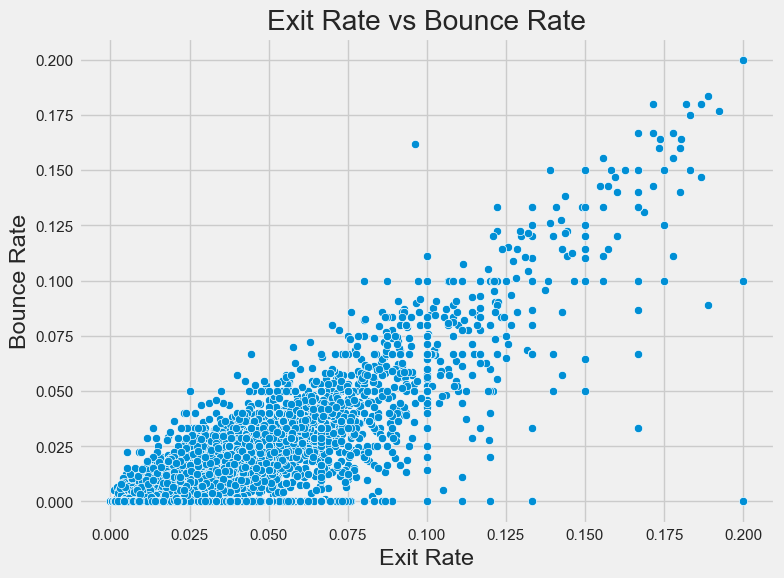

In [38]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='ExitRates', y='BounceRates', data=df)
plt.title('Exit Rate vs Bounce Rate')
plt.ylabel('Bounce Rate')
plt.xlabel('Exit Rate')
plt.show()

***Analysis of Exit Rate vs Bounce Rate Scatter Plot***

1. **Correlation Pattern**
- **Strong Positive Correlation**:
  - Clear upward trend showing bounce rates increase with exit rates
  - Correlation appears to be roughly linear
  - Most dense concentration of points in the lower left quadrant (0.00-0.10 range)
- **Distribution**:
  - Exit Rates: Primarily clustered between 0.00-0.15
  - Bounce Rates: Mainly concentrated between 0.00-0.10
  - Some outliers reaching up to 0.20 for both metrics

2. **Key Observations**
- **Data Density**:
  - Highest density of points in the 0.00-0.075 range for both metrics
  - Scatter becomes more dispersed as rates increase
  - Clear thinning of data points at higher values
- **Pattern Features**:
  - Nearly linear relationship with some variance
  - Wider spread of bounce rates for given exit rates as values increase
  - Few outliers in the upper right corner (high bounce and exit rates)

3. **Statistical Insights**
- **Relationship Strength**:
  - Strong positive correlation (approximately 0.90 based on previous correlation matrix)
  - Predictable relationship useful for forecasting and monitoring
- **Distribution Properties**:
  - Right-skewed distribution for both metrics
  - Non-uniform variance (heteroscedasticity) at higher values
  - Clear boundary effects at 0.00 (natural lower limit)

In [39]:
# Identify outliers with extreme BounceRates and ExitRates where Revenue is True
extreme_bounce_exit = df[(df['Revenue'] == True) & 
                           ((df['BounceRates'] > 0.1) | (df['ExitRates'] > 0.1))]

extreme_bounce_exit

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
6348,1,0.0,0,0.0,11,113.80,0.083333,0.116667,0.0,0.0,Nov,2,4,1,3,Returning_Visitor,0,1
6615,0,0.0,0,0.0,1,0.00,0.200000,0.200000,0.0,0.0,Oct,2,5,1,20,Returning_Visitor,0,1
7513,0,0.0,0,0.0,3,0.00,0.200000,0.200000,0.0,0.0,Nov,3,2,1,11,Returning_Visitor,0,1
8018,2,256.5,0,0.0,10,117.25,0.110714,0.130952,0.0,0.0,Nov,2,2,7,11,Returning_Visitor,1,1
10430,0,0.0,0,0.0,8,335.25,0.100000,0.108333,0.0,0.0,Nov,3,12,1,1,Returning_Visitor,0,1
10685,1,0.0,0,0.0,1,0.00,0.200000,0.200000,0.0,0.0,Nov,3,2,3,8,Returning_Visitor,0,1


For those create revenue, have a high bounce rate and exit rate but have 0 duration of the session, consider to drop it. For those with high bounce rate and high exit rate but spend a while in product related page, keep the record.

### **Observation 24 - Page Values vs VisitorType**

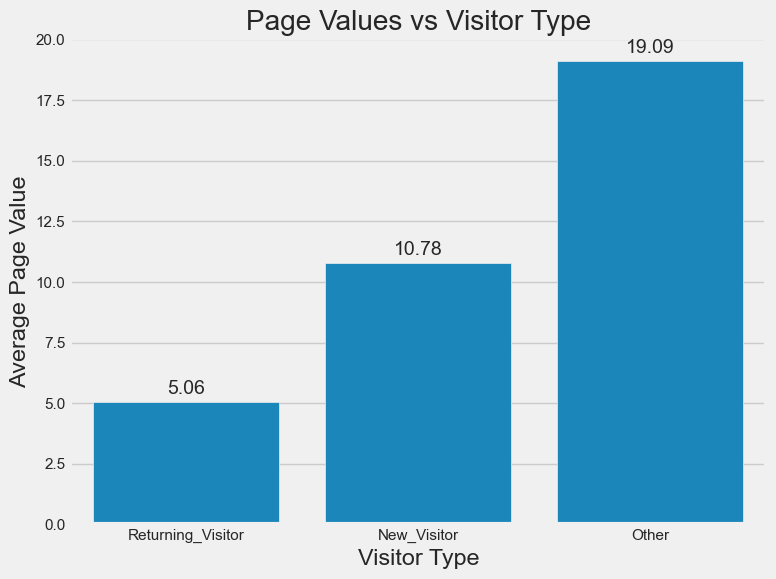

In [40]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='VisitorType', y='PageValues', data=df, ci=None, estimator='mean')
plt.title('Page Values vs Visitor Type')
plt.ylabel('Average Page Value')
plt.xlabel('Visitor Type')

# Add text annotations on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)

plt.show()

***Analysis of Page Values vs Visitor Type***

1. **Page Value Comparison by Visitor Type**
- **Other Visitors**:
  - Highest average page value: 19.09
  - Significantly higher than both returning and new visitors
- **New Visitors**:
  - Average page value: 10.78
  - Middle-range performance
  - Approximately 2.1x higher than returning visitors
- **Returning Visitors**:
  - Lowest average page value: 5.06
  - Less than half of new visitors' value
  - About 26.5% of "Other" visitors' value

2. **Key Insights**
- **Value Distribution Pattern**:
  - Clear hierarchical pattern in page values
  - Unexpected higher value from "Other" category
  - New visitors generate more value per page than returning visitors
- **Visitor Behavior Indication**:
  - New visitors show higher engagement value
  - Returning visitors might be more browsing-oriented
  - "Other" category shows surprisingly high value (potential anomaly or special case)

- Page Values for Others and New Visitors may be higher because they go straight to the high value page through ads and links whereas Returning Visitors tend to check many pages.

### **Observation 25 - Special Day by Visitor Type**

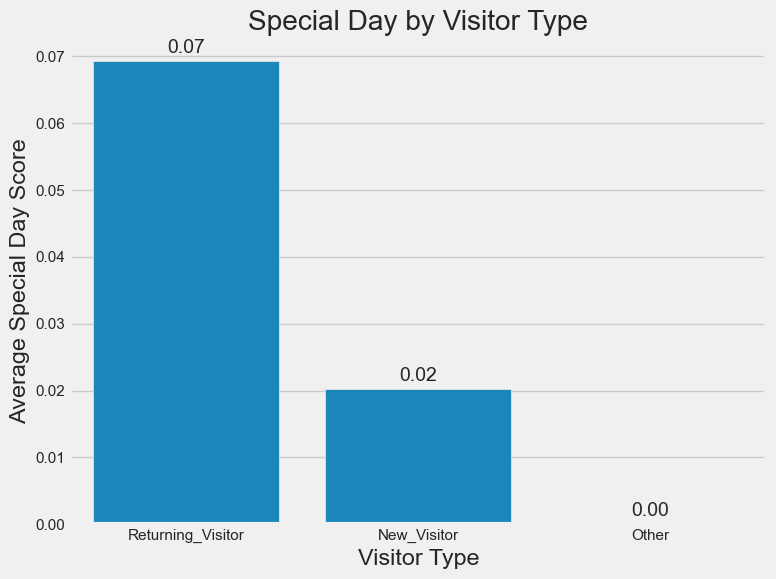

In [41]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='VisitorType', y='SpecialDay', data=df, ci=None)
plt.title('Special Day by Visitor Type')
plt.ylabel('Average Special Day Score')
plt.xlabel('Visitor Type')

# Add text annotations on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)

plt.show()

***Analysis of Special Day by Visitor Type***

1. **Special Day Score Comparison**
- **Returning Visitors**:
  - Highest average special day score: 0.07 (7%)
  - Significantly higher than other visitor types
  - Shows strongest correlation with special day visits
- **New Visitors**:
  - Moderate special day score: 0.02 (2%)
  - Considerably lower than returning visitors
  - Shows some special day engagement
- **Other Visitors**:
  - Lowest score: 0.00 (0%)
  - No significant special day correlation
  - Suggests minimal holiday/special day influence

2. **Key Insights**
- **Pattern Analysis**:
  - Clear hierarchical distribution
  - Returning visitors show strongest special day engagement
  - Significant drop between returning and new visitors
  - Complete absence of special day correlation for "Other" category
- **Behavioral Indicators**:
  - Returning visitors more likely to engage during special days
  - New visitors show limited special day influence
  - "Other" visitors appear unaffected by special days

### **Observation 26 - Special Day by month**

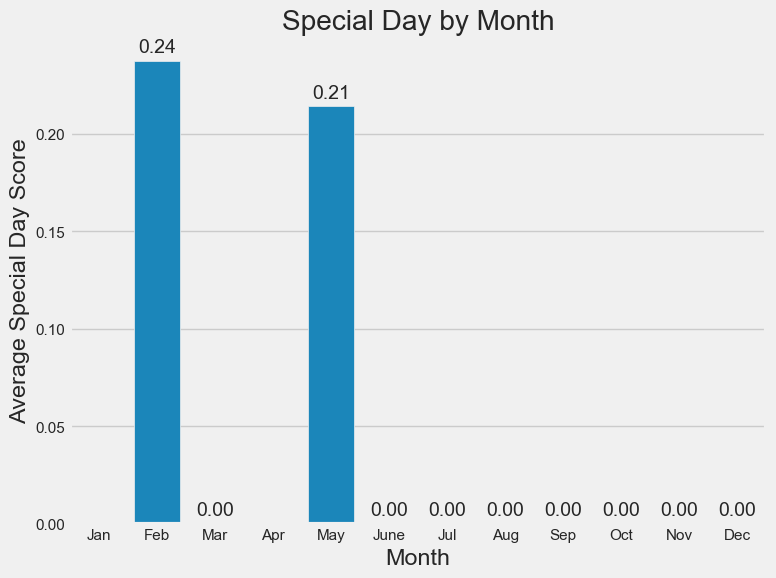

In [42]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='Month', y='SpecialDay', data=df, ci=None, estimator='mean')
plt.title('Special Day by Month')
plt.ylabel('Average Special Day Score')
plt.xlabel('Month')

# Add text annotations on top of each bar
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', padding=3)

plt.show()

***Analysis of Special Day Scores by Month***

1. **Monthly Distribution Analysis**
- **Peak Months**:
  - February: Highest score (0.24 or 24%)
  - May: Second highest score (0.21 or 21%)
- **Non-Active Months**:
  - All other months show zero activity (0.00)
  - Including: January, March, April, June-December
- **Pattern**:
  - Only two months show special day activity
  - Clear concentration in first half of year
  - Significant gaps between active months

2. **Key Insights**
- **Seasonal Pattern**:
  - Strong activity in February (likely Valentine's Day)
  - Secondary peak in May (possibly Mother's Day)
  - No activity during major holiday seasons (November-December)
- **Temporal Distribution**:
  - Limited to specific months
  - Focused on commercial holidays
  - Absence of year-end holiday impact

### **Handle Outliers**

In [43]:
# Check for rows where ProductRelated or ProductRelated_Duration is 0 but Revenue is True
zero_product_related_revenue = df_copy[
    ((df_copy['Total_Duration'] == 0)) & (df_copy['Revenue'] == True)
]

zero_product_related_revenue

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Total_Duration
6615,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Oct,2,5,1,20,Returning_Visitor,0,1,0.0
7513,0,0.0,0,0.0,3,0.0,0.2,0.2,0.0,0.0,Nov,3,2,1,11,Returning_Visitor,0,1,0.0
10685,1,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Nov,3,2,3,8,Returning_Visitor,0,1,0.0


In [44]:
# Drop rows using the drop method with the specified condition
rows_to_drop = df_copy[(df_copy['Total_Duration'] == 0) & (df_copy['Revenue'] == True)].index
df_copy = df_copy.drop(index=rows_to_drop)

In [45]:
# Check the dataset size after deleting
print(f"The dataset has {df_copy.shape[0]} rows and {df_copy.shape[1]} columns")

The dataset has 12202 rows and 19 columns


### **Final Analysis Summary**

**🔑 Key Findings**

#### 1. Visitor Behavior Patterns
- **Returning Visitors (Majority)**
  - Make up 85% of total traffic
  - Lower conversion rate (14.1%)
  - Spend less time per session
  - Lower average page value (5.06)

- **New Visitors**
  - Higher conversion rate (24.9%)
  - Better engagement metrics
  - Higher average page value (10.78)
  - More likely to make purchases

- **Other Visitors**
  - Small segment but highest page value (19.09)
  - Moderate conversion rate (19.8%)
  - Requires further investigation

#### 2. Session Metrics
- **Duration Patterns**
  - Purchase sessions average 34.2 minutes
  - Non-purchase sessions average 19.8 minutes
  - Administrative pages show 60% longer duration for purchasing sessions

- **Engagement Metrics**
  - Strong correlation between bounce rates and exit rates (0.90)
  - Purchase sessions show significantly lower bounce (0.5%) and exit rates (1.9%)
  - Non-purchase sessions have higher bounce (2.2%) and exit rates (4.5%)

#### 3. Temporal Patterns
- **Weekday vs Weekend**
  - 75% of traffic occurs on weekdays
  - Suggests B2B or work-related usage patterns

- **Special Days**
  - Concentrated in February (0.24) and May (0.21)
  - No activity in other months
  - Returning visitors show highest special day engagement (0.07)

**📊 Critical Observations**

#### Strengths
1. Strong user retention (85% returning visitors)
2. High conversion rate for new visitors
3. Clear correlation between engagement metrics and purchases
4. Effective special day campaigns in active months

# **Task 2: Feature Engineering**


In this study, feature engineering was crucial in identifying the most relevant features contributing to model performance. It is primarily used to remove noninformative or redundant features. For supervised learning, to select features, we will locate the target column and split the dataset to ensure that the model does not overfit and that its performance generalizes to new data. Three general feature selection algorithms, filter, wrapper, and embedded methods, are used to evaluate feature choices. For unsupervised learning, we will use the existing framework for feature selection on the clustering task to identify the most relevant features.

## **Feature transformation**

Before applying the feature selection, we need to do ordinal encoding and scaling transformations to our dataset, which prepares it for feature selection. To enhance the feature selection process when modeling, we convert categorical features into numerical values, which makes it possible for embedding methods to assess feature contributions and filter-based and wrapper methods to determine feature importance efficiently. Furthermore, we apply scaling to ensure that features with varied scales are treated similarly and reduce sensitivity to outliers by normalizing numerical data based on the median and interquartile range.

### ***Preprocessing***

In [46]:
def preprocess_data_clf(df, categorical_features, numerical_features, target_variable):
    X_train, X_test, y_train, y_test = train_test_split(df.drop(columns=[target_variable]), df[target_variable], test_size=0.2, random_state=42)
    
    # Initialize encoders and scaler and transformer
    ordinal_encoder = OrdinalEncoder()
    label_encoder = LabelEncoder()
    scaler = RobustScaler()

    # Encode categorical features
    data_train_encoded = pd.DataFrame(ordinal_encoder.fit_transform(X_train[categorical_features]), columns=categorical_features, index=X_train.index)
    data_test_encoded = pd.DataFrame(ordinal_encoder.transform(X_test[categorical_features]), columns=categorical_features, index=X_test.index)

    # Scale numerical features
    data_train_scaled = pd.DataFrame(scaler.fit_transform(X_train[numerical_features]), columns=numerical_features, index=X_train.index)
    data_test_scaled = pd.DataFrame(scaler.transform(X_test[numerical_features]), columns=numerical_features, index=X_test.index)
    
    # Create copies of the original datasets
    X_train_scaled_encoded = X_train.copy()
    X_test_scaled_encoded = X_test.copy()

    # Update the copies with encoded categorical features and scaled numerical features
    X_train_scaled_encoded[categorical_features] = data_train_encoded
    X_train_scaled_encoded[numerical_features] = data_train_scaled
    X_test_scaled_encoded[categorical_features] = data_test_encoded
    X_test_scaled_encoded[numerical_features] = data_test_scaled

    # Encode the target variable
    y_train_encoded = pd.DataFrame(label_encoder.fit_transform(np.array(y_train).reshape(-1, 1)), columns=[target_variable])
    y_test_encoded = pd.DataFrame(label_encoder.transform(np.array(y_test).reshape(-1, 1)), columns=[target_variable])

    return X_train_scaled_encoded, X_test_scaled_encoded, y_train_encoded, y_test_encoded

In [47]:
def preprocess_data_reg(df, categorical_features, numerical_features, target_variable):
    X_train, X_test, y_train, y_test = train_test_split(df.drop(columns=[target_variable]), df[target_variable], test_size=0.2, random_state=42)
    
    # Initialize encoders and scaler and transformer
    ordinal_encoder = OrdinalEncoder()
    scaler = RobustScaler()
    transformer = QuantileTransformer(output_distribution='normal')

    # Encode categorical features
    data_train_encoded = pd.DataFrame(ordinal_encoder.fit_transform(X_train[categorical_features]), columns=categorical_features, index=X_train.index)
    data_test_encoded = pd.DataFrame(ordinal_encoder.transform(X_test[categorical_features]), columns=categorical_features, index=X_test.index)

    # Scale numerical features
    data_train_scaled = pd.DataFrame(scaler.fit_transform(X_train[numerical_features]), columns=numerical_features, index=X_train.index)
    data_test_scaled = pd.DataFrame(scaler.transform(X_test[numerical_features]), columns=numerical_features, index=X_test.index)

    data_train_scaled = transformer.fit_transform(data_train_scaled)
    data_test_scaled = transformer.transform(data_test_scaled)

    # Create copies of the original datasets
    X_train_scaled_encoded = X_train.copy()
    X_test_scaled_encoded = X_test.copy()

    # Update the copies with encoded categorical features and scaled numerical features
    X_train_scaled_encoded[categorical_features] = data_train_encoded
    X_train_scaled_encoded[numerical_features] = data_train_scaled
    X_test_scaled_encoded[categorical_features] = data_test_encoded
    X_test_scaled_encoded[numerical_features] = data_test_scaled

    return X_train_scaled_encoded, X_test_scaled_encoded, y_train, y_test

In [48]:
def preprocess_data_cls(df, categorical_features, numerical_features):
    # Initialize encoders and scaler and transformer
    ordinal_encoder = OrdinalEncoder()
    normalizer = Normalizer()

    # Encode categorical features
    df[categorical_features] = pd.DataFrame(ordinal_encoder.fit_transform(df[categorical_features]), columns=categorical_features, index=df[categorical_features].index)

    # Normalizing numerical features
    df[numerical_features] = pd.DataFrame(normalizer.fit_transform(df[numerical_features]), columns=numerical_features, index=df[numerical_features].index)

    return df

### ***Splitting dataset***

In [49]:
categorical_features = ['Month', 'VisitorType', 'Weekend']
numerical_features = ['Administrative','Administrative_Duration', 'Informational','Informational_Duration', 'ProductRelated','ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'Total_Duration']
X_train_clf, X_test_clf, y_train_clf, y_test_clf = preprocess_data_clf(df_copy, categorical_features, numerical_features, 'Revenue')

In [50]:
categorical_features = ['Month', 'VisitorType', 'Weekend', 'Revenue']
numerical_features = ['Administrative','Administrative_Duration', 'Informational','Informational_Duration', 'ProductRelated', 'BounceRates', 'ExitRates', 'PageValues']
X_train_reg, X_test_reg, y_train_reg, y_test_reg = preprocess_data_reg(df_copy.drop(columns=['Total_Duration']), categorical_features, numerical_features, 'ProductRelated_Duration')

In [51]:
categorical_features = ['Month', 'VisitorType', 'Weekend', 'Revenue']
numerical_features = ['Administrative','Administrative_Duration', 'Informational','Informational_Duration', 'ProductRelated','ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'Total_Duration']

df_clustering = preprocess_data_cls(df_copy, categorical_features, numerical_features)

## **Feature Selection**


### **Filter-based method**

#### ***Variance Threshold***

The threshold method in modeling involves setting a specific cutoff point to classify data into distinct categories or make decisions. This approach is commonly used in binary classification problems, where data points are assigned to one of two groups based on whether they exceed or fall below the threshold.The choice of threshold is critical, as it balances trade-offs between sensitivity and specificity, or between false positives and false negatives. Optimal threshold selection often depends on the context and desired outcomes, and can be determined using techniques like ROC curve analysis or cost-benefit analysis.

##### *Variance Threshold - Classification Task*

In [52]:
def variance_threshold_feature_selection(X, y, thresholds ,problem_type):
    # Store results
    results = []
    selected_features_list = []

    # Test each threshold
    for threshold in thresholds:
        # Apply Variance Threshold
        selector = VarianceThreshold(threshold=threshold)
        X_selected = selector.fit_transform(X)
        
        # Get the selected features
        selected_features = X.columns[selector.get_support()]
        selected_features_list.append(selected_features)
        
        # Train a model with selected features
        X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)
        
        if problem_type == 'classification':
            model = RandomForestClassifier(random_state=42)
        elif problem_type == 'regression':
            model = RandomForestRegressor(random_state=42)
        else:
            raise ValueError("Invalid problem type. Choose 'classification' or 'regression'.")
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Evaluate model
        if problem_type == 'classification':
            metric = accuracy_score(y_test, y_pred)
        else:
            metric = mean_squared_error(y_test, y_pred)
        
        results.append(metric)
    
    return results, selected_features_list

In [53]:
def plot_vt(thresholds, results, best_threshold):
    plt.figure(figsize=(12, 8))
    plt.plot(thresholds, results, marker='o', linestyle='-', color='b')
    plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Best Threshold: {best_threshold}')
    plt.xlabel('Variance Threshold')
    plt.ylabel('Model Accuracy')
    plt.title('Model Accuracy vs. Variance Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

In [54]:
thresholds = np.arange(0, .5, 0.01)

In [55]:
# Find the best threshold and corresponding features
vt_result_clf, selected_features_clf = variance_threshold_feature_selection(X_train_clf, y_train_clf, thresholds ,"classification")

best_threshold_clf = thresholds[np.argmax(a=vt_result_clf)]
best_features_clf = selected_features_clf[np.argmax(vt_result_clf)]
best_accuracy_clf = np.max(vt_result_clf)

print(f"Best Threshold: {best_threshold_clf}")
print(f"Best Accuracy: {best_accuracy_clf}")
print(f"Selected Features at Best Threshold: {best_features_clf}")

Best Threshold: 0.04
Best Accuracy: 0.9083461341525858
Selected Features at Best Threshold: Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'Month', 'OperatingSystems',
       'Browser', 'Region', 'TrafficType', 'VisitorType', 'Weekend',
       'Total_Duration'],
      dtype='object')


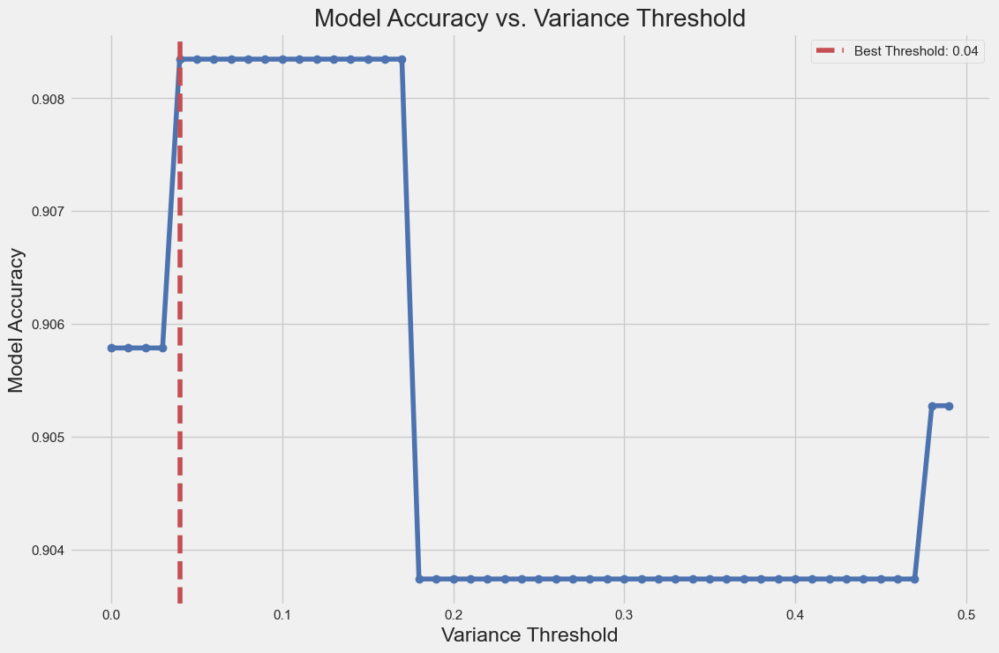

In [56]:
plot_vt(thresholds=thresholds, results=vt_result_clf, best_threshold=best_threshold_clf)

The selected threshold is 0.04, yeild the best accuracy of 0.908, and the selected features are:
- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **ProductRelated_Duration**
- **BounceRates**
- **ExitRates**
- **PageValues**
- **Month**
- **OperatingSystems**
- **Browser**
- **Region**
- **TrafficType**
- **VisitorType**
- **Weekend**
- **Total_Duration**

##### *Variance Threshold - Regression Task*

In [57]:
# Find the best threshold and corresponding features
vt_result_reg, selected_features_reg = variance_threshold_feature_selection(X_train_reg, y_train_reg, thresholds ,"regression")

best_threshold_reg = thresholds[np.argmax(a=vt_result_reg)]
best_features_reg = selected_features_reg[np.argmax(vt_result_reg)]
best_accuracy_reg = np.max(vt_result_reg)

print(f"Best Threshold: {best_threshold_reg}")
print(f"Best Accuracy (MSE): {best_accuracy_reg}")
print(f"Selected Features at Best Threshold: {best_features_reg}")

Best Threshold: 0.14
Best Accuracy (MSE): 649072.574440659
Selected Features at Best Threshold: Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'BounceRates', 'ExitRates',
       'PageValues', 'Month', 'OperatingSystems', 'Browser', 'Region',
       'TrafficType', 'VisitorType', 'Weekend'],
      dtype='object')


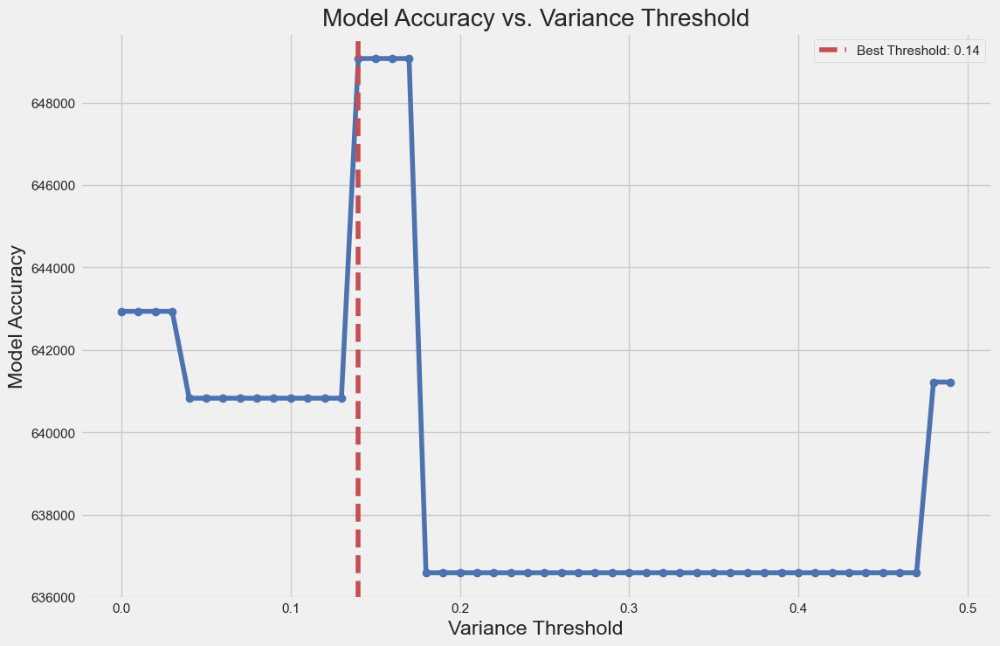

In [58]:
plot_vt(thresholds=thresholds, results=vt_result_reg, best_threshold=best_threshold_reg)

The selected threshold is 0.14, yeild the best MSE of 649072.57, and the selected features are:

- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **BounceRates**
- **ExitRates**
- **PageValues**
- **Month**
- **OperatingSystems**
- **Browser**
- **Region**
- **TrafficType**
- **VisitorType**
- **Weekend**

#### **Pearson Correlation**

The Pearson correlation used statistical measure that evaluates the strength and direction of the linear relationship between two continuous variables. It produces a coefficient, denoted as r, which ranges from -1 to +1. A value of +1 indicates a perfect positive linear relationship, meaning that as one variable increases, the other variable increases proportionally. Conversely, a value of -1 signifies a perfect negative linear relationship, where one variable increases as the other decreases. A value of 0 suggests no linear relationship between the variables. The Pearson correlation coefficient is calculated by dividing the covariance of the two variables by the product of their standard deviations.

##### *Pearson Correlation - Classification Task*

In [59]:
def pearson_correlation_feature_selection(X, correlation_threshold=0.75):
    # Calculate correlation matrix
    correlation_matrix = X.corr()
    
    # Find highly correlated pairs
    corr_pairs = []
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if correlation_matrix.iloc[i,j] > correlation_threshold:
                corr_pairs.append((
                    correlation_matrix.columns[i],
                    correlation_matrix.columns[j],
                    correlation_matrix.iloc[i,j]
                ))
    
    # Identify features to drop based on variance
    features_to_drop = []
    for feat1, feat2, _ in corr_pairs:
        if feat1 != feat2:
            if X[feat1].var() < X[feat2].var():
                features_to_drop.append(feat1)
            else:
                features_to_drop.append(feat2)
    
    # Remove duplicates from features to drop
    features_to_drop = list(set(features_to_drop))
    
    # Select features
    selected_features = X.columns[~np.isin(X.columns, features_to_drop)].tolist()
    
    return selected_features, features_to_drop, corr_pairs

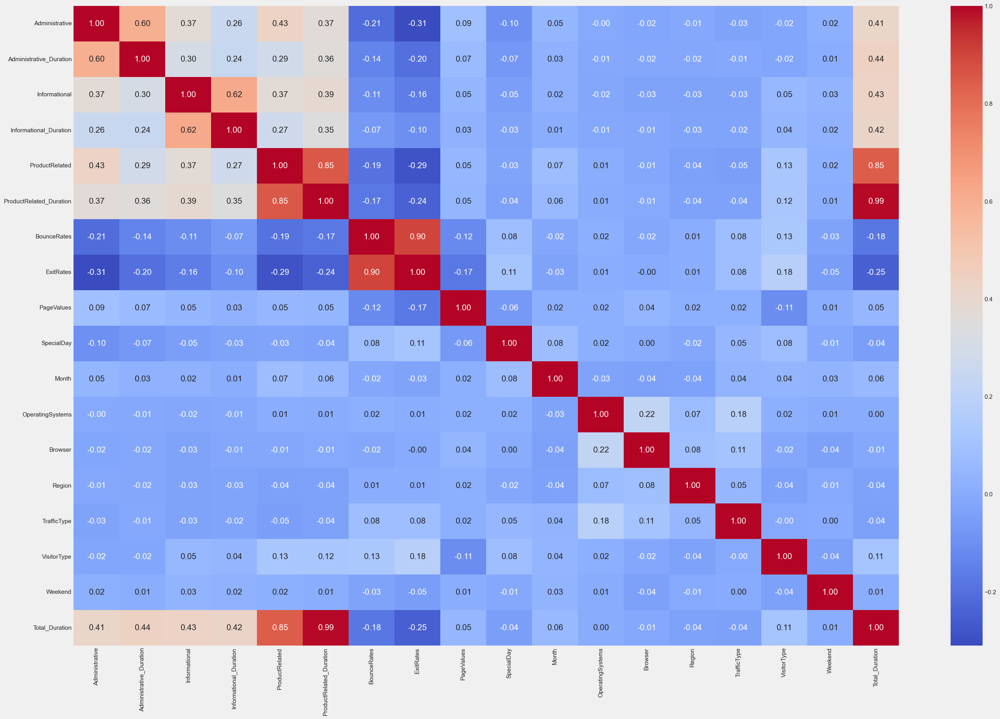

In [60]:
# Get the correlation matrix
correlation_matrix_clf = X_train_clf.corr()

plt.figure(figsize=(30,20))
sns.heatmap(correlation_matrix_clf, annot=True,fmt='.2f',annot_kws=dict(size=15),cmap='coolwarm')
plt.show()

In [61]:
selected_features_clf, dropped_features_clf, correlation_pairs_clf = pearson_correlation_feature_selection(X_train_clf, 0.75)
print(f"Correlation pairs: \n {correlation_pairs_clf} \n")
print(f"Dropped features: \n {dropped_features_clf} \n")
print(f"Selected features: \n {selected_features_clf}\n")

Correlation pairs: 
 [('ProductRelated_Duration', 'ProductRelated', 0.8546482620909359), ('ExitRates', 'BounceRates', 0.9018568609351884), ('Total_Duration', 'ProductRelated', 0.8463295863235537), ('Total_Duration', 'ProductRelated_Duration', 0.9938556366177921)] 

Dropped features: 
 ['ExitRates', 'ProductRelated', 'Total_Duration'] 

Selected features: 
 ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated_Duration', 'BounceRates', 'PageValues', 'SpecialDay', 'Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType', 'Weekend']



In [62]:
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train_clf[selected_features_clf], y_train_clf)
y_pred = rfc.predict(X_test_clf[selected_features_clf])

accuracy = accuracy_score(y_test_clf, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.9065956575174109


With the Pearson Correlation method, the selected features are:

- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **ExitRates**
- **PageValues**
- **SpecialDay**
- **Month**
- **OperatingSystems**
- **Browser**
- **Region**
- **TrafficType**
- **VisitorType**
- **Weekend**

And the accuracy is 0.91

##### *Pearson Correlation - Regression Task*

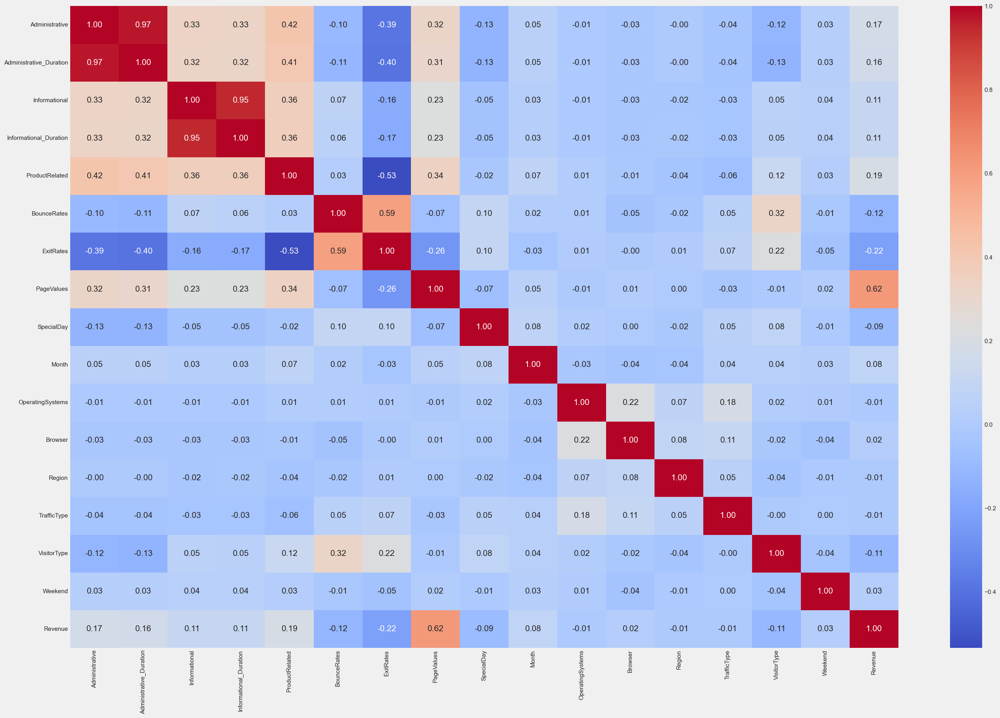

In [63]:
# Get the correlation matrix
correlation_matrix_reg = X_train_reg.corr()

plt.figure(figsize=(30,20))
sns.heatmap(correlation_matrix_reg,annot=True,fmt='.2f',annot_kws=dict(size=15),cmap='coolwarm')
plt.show()

In [64]:
selected_features_reg, dropped_features_reg, correlation_pairs_reg = pearson_correlation_feature_selection(X_train_reg, 0.75)
print(f"Correlation pairs: \n {correlation_pairs_reg} \n")
print(f"Dropped features: \n {dropped_features_reg} \n")
print(f"Selected features: \n {selected_features_reg}\n")

Correlation pairs: 
 [('Administrative_Duration', 'Administrative', 0.9747478563976786), ('Informational_Duration', 'Informational', 0.9472916940651559)] 

Dropped features: 
 ['Administrative', 'Informational_Duration'] 

Selected features: 
 ['Administrative_Duration', 'Informational', 'ProductRelated', 'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType', 'Weekend', 'Revenue']



In [65]:
rfg = RandomForestRegressor(random_state=42)
rfg.fit(X_train_reg[selected_features_reg], y_train_reg)
y_pred = rfg.predict(X_test_reg[selected_features_reg])

mse = mean_squared_error(y_test_reg, y_pred)
print(f"Accuracy (MSE): {mse}")

Accuracy (MSE): 764871.0533270041


#### **Mutal Information**

Mutual information (MI) is a measure from information theory that quantifies the amount of information shared between two random variables. It captures both linear and nonlinear relationships, making it more versatile than measures like Pearson correlation, which only assess linear dependencies. Mutual information is based on the concept of entropy, which measures the uncertainty or randomness of a variable. Specifically, MI calculates how much knowing one variable reduces the uncertainty about the other. If two variables are independent, their mutual information is zero, as they provide no information about each other. Conversely, higher mutual information values indicate stronger dependencies. MI is widely used in feature selection, image processing, and machine learning to identify meaningful relationships between variables. However, it can be computationally intensive to estimate, especially for continuous data, and often requires techniques like binning or kernel density estimation for accurate calculation.

##### *Mutual Information - Classification Task*

In [66]:
def mutual_information_feature_selection(X, y, n_features=10, problem_type=None):
    # Calculate mutual information
    mutual_info = 0
    if problem_type == 'classification':
        mutual_info = mutual_info_classif(X, y)
    else:
        mutual_info = mutual_info_regression(X, y)
    
    # Rank features by mutual information
    mi_scores = pd.Series(mutual_info, index=X.columns).sort_values(ascending=False)
    
    # Select top N features
    top_features = mi_scores.head(n_features).index.tolist()
    
    return top_features, mi_scores

In [67]:
# Select top 10 features
top_features_mi_clf, mi_scores_clf = mutual_information_feature_selection(X_train_clf, y_train_clf, problem_type="classification")
print("Top 10 Features (Mutual Information):")
print(top_features_mi_clf)

Top 10 Features (Mutual Information):
['PageValues', 'ExitRates', 'ProductRelated_Duration', 'Total_Duration', 'ProductRelated', 'Month', 'BounceRates', 'TrafficType', 'Administrative', 'Administrative_Duration']


In [68]:
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train_clf[top_features_mi_clf], y_train_clf)
y_pred = rfc.predict(X_test_clf[top_features_mi_clf])

accuracy = accuracy_score(y_test_clf, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.9094633346988938


With the Mutual Information method, the selected features are:
- **PageValues**
- **ExitRates**
- **ProductRelated_Duration**
- **Total_Duration**
- **BounceRates**
- **ProductRelated**
- **Month**
- **ProductRelated**
- **Administrative**
- **Administrative_Duration**
- **TrafficType**

And the accuracy is **0.914**

##### *Mutual Information - Regression Task*

In [69]:
# Select top 10 features
top_features_mi_reg, mi_scores_reg = mutual_information_feature_selection(X_train_reg, y_train_reg, problem_type="regression")
print("Top 10 Features (Mutual Information):")
print(top_features_mi_reg)

Top 10 Features (Mutual Information):
['ProductRelated', 'ExitRates', 'BounceRates', 'Administrative', 'Administrative_Duration', 'PageValues', 'Informational', 'Informational_Duration', 'Revenue', 'TrafficType']


In [70]:
rfg = RandomForestRegressor(random_state=42)
rfg.fit(X_train_reg[top_features_mi_reg], y_train_reg)
y_pred = rfg.predict(X_test_reg[top_features_mi_reg])

mse = mean_squared_error(y_test_reg, y_pred)
print(f"MSE: {mse}")

MSE: 752085.1698302119


With the Mutual Information method, the selected features are:

- **ProductRelated**
- **ExitRates**
- **BounceRates**
- **Administrative_Duration**
- **Administrative**
- **PageValues**
- **Informational**
- **Informational_Duration**
- **Revenue**
- **TrafficType**

And the MSE is **752075.42**

#### **Conclusion**

**Classification**
- The Variance Threshold method is the worst method to select features, yielding the lowest accuracy of **0.908**
- The Pearson Correlation method is the second best method to select features, yielding the second highest accuracy of **0.911**
- The Mutual Information method is the best method to select features, yielding the highest accuracy of **0.914**

Therefore, the we will select the features from the Mutual Information method since it yields the highest accuracy of **0.914**.

The selected features for Filter-based method are:
- **PageValues**
- **ExitRates**
- **ProductRelated_Duration**
- **Total_Duration**
- **BounceRates**
- **ProductRelated**
- **Month**
- **Administrative**
- **Administrative_Duration**
- **TrafficType**
  


**Regression**
- The Variance Threshold method is the best method to select features, yielding the lowest MSE of **649072.57**
- The Pearson Correlation method is the worst method to select features, yielding the highest MSE of **764871.05**
- The Mutual Information method is the second best method to select features, yielding the second highest MSE of **752075.41**

Therefore, the we will select the features from the Variance Threshold method since it yields the lowest MSE of **649072.57**

The selected features for Filter-based method are:
- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **BounceRates**
- **ExitRates**
- **PageValues**
- **Month**
- **OperatingSystems**
- **Browser**
- **Region**
- **TrafficType**
- **VisitorType**
- **Weekend**


### **Embedding-based method**

#### **Lasso L1 Regularization**

Lasso (Least Absolute Shrinkage and Selection Operator) L1 regularization is a powerful technique used in feature selection and regression analysis to improve model interpretability and prevent overfitting. It works by adding a penalty term to the loss function that is proportional to the absolute value of the coefficients (L1 norm). This penalty encourages sparsity, effectively shrinking some coefficients to zero, thereby excluding irrelevant or less important features from the model. As a result, Lasso not only helps in building simpler and more interpretable models but also performs automatic feature selection by retaining only the most significant predictors. This makes it particularly useful in high-dimensional datasets where the number of features exceeds the number of observations.

##### *Lasso L1 Regularization - Classification Task*

In [71]:
def lasso_feature_selection(X, y, alpha=0.01, threshold=1e-5):
    # Initialize and train Lasso model
    lasso = Lasso(alpha=alpha)
    lasso.fit(X, y)
    
    # Get feature coefficients
    coef_series = pd.Series(lasso.coef_, index=X.columns)
    
    # Select features with non-zero coefficients
    selected_features = coef_series[abs(coef_series) > threshold].index.tolist()
    
    df_coeff = pd.DataFrame({"features":X.columns,"coeff":coef_series.values})
    df_coeff.sort_values("coeff", inplace=True)
    
    return selected_features, coef_series, df_coeff

In [72]:
selected_features_l1_clf, coef_series_clf, coef_df_clf = lasso_feature_selection(X_train_clf, y_train_clf)
print(f"Selected features: \n {selected_features_l1_clf}\n")
print(f"Coef serires: \n {coef_df_clf}\n")

Selected features: 
 ['Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'ExitRates', 'PageValues', 'Month', 'VisitorType']

Coef serires: 
                    features     coeff
7                 ExitRates -0.020828
15              VisitorType -0.008460
0            Administrative  0.000000
14              TrafficType -0.000000
13                   Region -0.000000
12                  Browser  0.000000
11         OperatingSystems -0.000000
9                SpecialDay -0.000000
17           Total_Duration  0.000000
6               BounceRates -0.000000
2             Informational  0.000000
1   Administrative_Duration  0.000000
16                  Weekend  0.000000
3    Informational_Duration  0.000022
10                    Month  0.007463
5   ProductRelated_Duration  0.008359
8                PageValues  0.008874
4            ProductRelated  0.013797



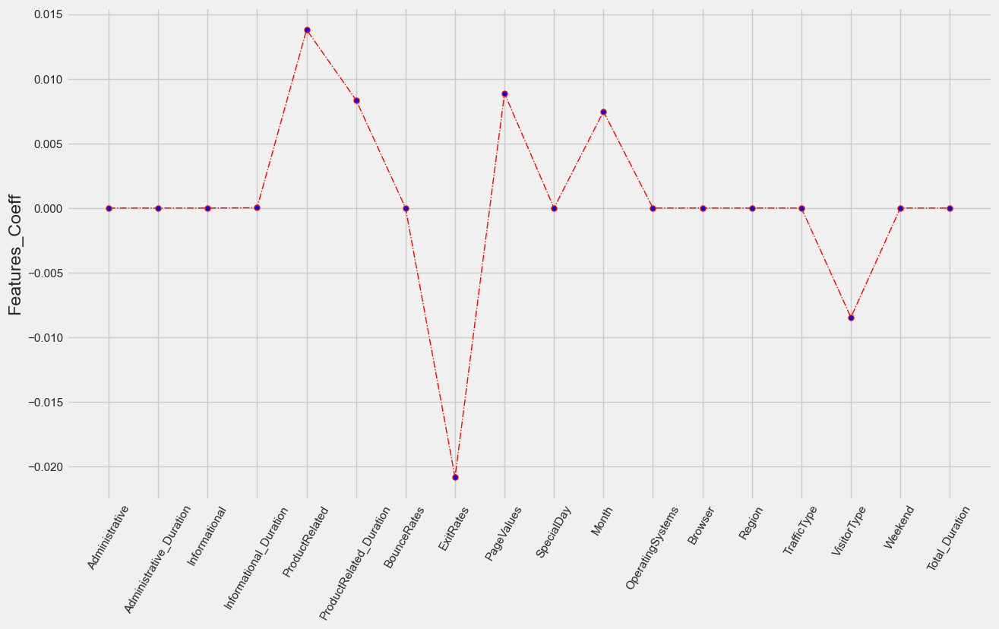

In [73]:
# Lets plot the coeff with features
plt.figure(figsize=(14,8))
plt.plot(range(len(X_train_clf.columns)), coef_series_clf, color='red', linestyle='dashdot', linewidth = 1,marker='o', 
         markerfacecolor='blue', markersize=5)
plt.xticks(range(len(X_train_clf.columns)),X_train_clf.columns,rotation=60)
plt.ylabel("Features_Coeff")
plt.show()

<Axes: xlabel='features', ylabel='coeff'>

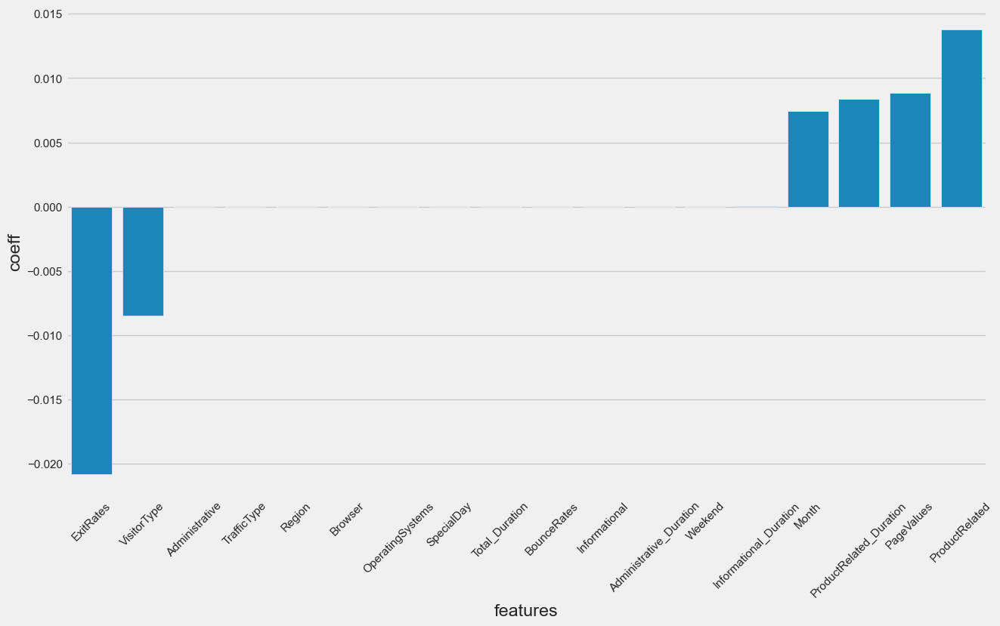

In [74]:
# Use Bar chart to show coeff
plt.figure(figsize=(14,8))
# plot the feature coeff in bars.
plt.xticks(rotation=45)
sns.barplot(x="features",y= "coeff", data=coef_df_clf)

In [75]:
rfc = RandomForestClassifier(random_state=42)
etc = ExtraTreesClassifier(random_state=42)
gbc = GradientBoostingClassifier(random_state=42)
dtc = DecisionTreeClassifier(random_state=42)

rfc.fit(X_train_clf[selected_features_l1_clf], y_train_clf)
etc.fit(X_train_clf[selected_features_l1_clf], y_train_clf)
gbc.fit(X_train_clf[selected_features_l1_clf], y_train_clf)
dtc.fit(X_train_clf[selected_features_l1_clf], y_train_clf)

accuracy_rfc = accuracy_score(y_test_clf, rfc.predict(X_test_clf[selected_features_l1_clf]))
accuracy_etc = accuracy_score(y_test_clf, etc.predict(X_test_clf[selected_features_l1_clf]))
accuracy_gbc = accuracy_score(y_test_clf, gbc.predict(X_test_clf[selected_features_l1_clf]))
accuracy_dtc = accuracy_score(y_test_clf, dtc.predict(X_test_clf[selected_features_l1_clf]))

print(f"Accuracy of Random Forest: {accuracy_rfc}")
print(f"Accuracy of Extra Trees: {accuracy_etc}")
print(f"Accuracy of Gradient Boosting: {accuracy_gbc}")
print(f"Accuracy of Decision Tree: {accuracy_dtc}")

Accuracy of Random Forest: 0.8984022941417452
Accuracy of Extra Trees: 0.8971732896353953
Accuracy of Gradient Boosting: 0.911102007374027
Accuracy of Decision Tree: 0.8627611634575993


Selected features from Lasso L1 Regularization are:

- **Informational_Duration**
- **ProductRelated**
- **ProductRelated_Duration**
- **ExitRates**
- **PageValues**
- **Month**
- **VisitorType**


##### *Lasso L1 Regularization - Regression Task*

In [76]:
selected_features_l1_reg, coef_series_reg, coef_df_reg = lasso_feature_selection(X_train_reg, y_train_reg, alpha=10)
print(f"Selected features: \n {selected_features_l1_reg}\n")
print(f"Coef serires: \n {coef_df_reg}\n")

Selected features: 
 ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month', 'Browser', 'Region', 'VisitorType', 'Revenue']

Coef serires: 
                    features        coeff
8                SpecialDay   -52.344828
5               BounceRates   -25.672540
12                   Region    -6.015812
0            Administrative    -5.675220
14              VisitorType    -1.570268
15                  Weekend    -0.000000
10         OperatingSystems    -0.000000
13              TrafficType    -0.000000
11                  Browser     2.316149
2             Informational     7.894830
9                     Month     8.040614
7                PageValues    17.911668
1   Administrative_Duration    23.798946
16                  Revenue    31.444203
3    Informational_Duration    71.272566
6                 ExitRates   313.826672
4            ProductRelated  1366.965000



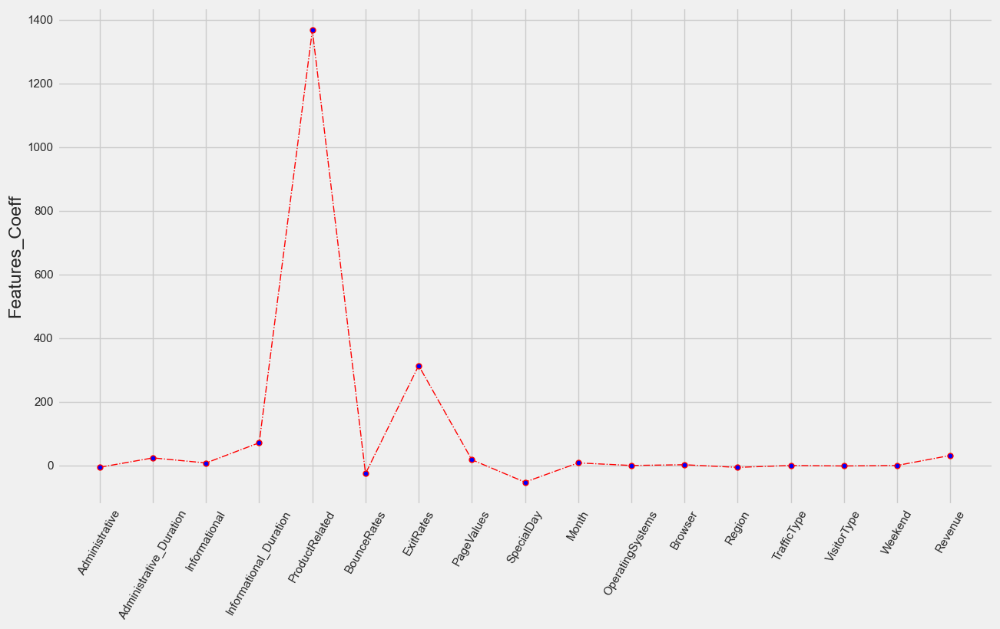

In [77]:
# Lets plot the coeff with features
plt.figure(figsize=(14,8))
plt.plot(range(len(X_train_reg.columns)), coef_series_reg, color='red', linestyle='dashdot', linewidth = 1,marker='o', 
         markerfacecolor='blue', markersize=5)
plt.xticks(range(len(X_train_reg.columns)),X_train_reg.columns,rotation=60)
plt.ylabel("Features_Coeff")
plt.show()

<Axes: xlabel='features', ylabel='coeff'>

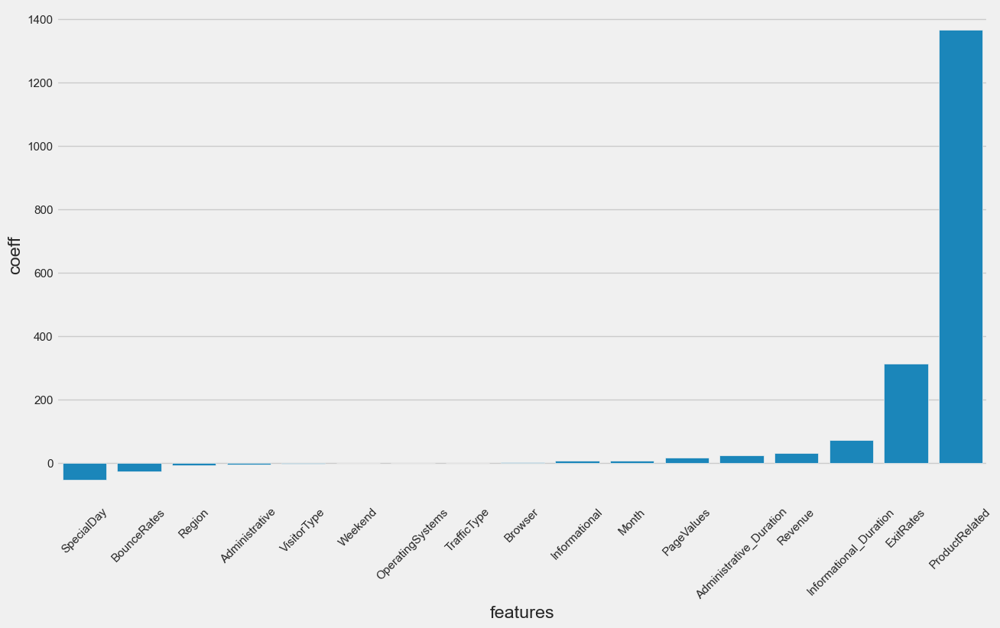

In [78]:
# Use Bar chart to show coeff
plt.figure(figsize=(14,8))
# plot the feature coeff in bars.
plt.xticks(rotation=45)
sns.barplot(x="features",y= "coeff", data=coef_df_reg)

In [79]:
rfr = RandomForestRegressor(random_state=42)
etr = ExtraTreesRegressor(random_state=42)
gbr = GradientBoostingRegressor(random_state=42)
dtr = DecisionTreeRegressor(random_state=42)

rfr.fit(X_train_reg[selected_features_l1_reg], y_train_reg)
etr.fit(X_train_reg[selected_features_l1_reg], y_train_reg)
gbr.fit(X_train_reg[selected_features_l1_reg], y_train_reg)
dtr.fit(X_train_reg[selected_features_l1_reg], y_train_reg)

mse_rfr = mean_squared_error(y_test_reg, rfr.predict(X_test_reg[selected_features_l1_reg]))
mse_etr = mean_squared_error(y_test_reg, etr.predict(X_test_reg[selected_features_l1_reg]))
mse_gbr = mean_squared_error(y_test_reg, gbr.predict(X_test_reg[selected_features_l1_reg]))
mse_dtr = mean_squared_error(y_test_reg, dtr.predict(X_test_reg[selected_features_l1_reg]))

print(f"MSE of Random Forest: {mse_rfr}")
print(f"MSE of Extra Trees: {mse_etr}")
print(f"MSE of Gradient Boosting: {mse_gbr}")
print(f"MSE of Decision Tree: {mse_dtr}")


MSE of Random Forest: 743523.1724103392
MSE of Extra Trees: 754659.1365994589
MSE of Gradient Boosting: 706363.6119240413
MSE of Decision Tree: 1608660.2240286442


Selected features from Lasso L1 Regularization are:

- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **BounceRates**
- **ExitRates**
- **PageValues**
- **SpecialDay**
- **Month**
- **Browser**
- **Region**
- **VisitorType**
- **Revenue**


#### **Tree Based**

Tree-based methods are a popular and effective approach for feature selection in machine learning. These methods, such as Decision Trees, Random Forests, and Gradient Boosting Machines (e.g., XGBoost, LightGBM), inherently evaluate the importance of features during the model training process. They work by splitting the data at each node based on the feature that provides the best separation of the target variable, often measured using criteria like Gini impurity or information gain. Features that contribute more to these splits are considered more important.

##### *Tree Based - Classification Task*


In [80]:
rfc = RandomForestClassifier(random_state=42)
etc = ExtraTreesClassifier(random_state=42)
gbc = GradientBoostingClassifier(random_state=42)
dtc = DecisionTreeClassifier(random_state=42)

rfc.fit(X_train_clf, y_train_clf)
etc.fit(X_train_clf, y_train_clf)
gbc.fit(X_train_clf, y_train_clf)
dtc.fit(X_train_clf, y_train_clf)

featureImportance_clf = [(features,rfcImportance, etcImportance, gbcImportance, dtcImportance) for features, rfcImportance, etcImportance, gbcImportance, dtcImportance in zip(X_train_clf.columns,rfc.feature_importances_,etc.feature_importances_,gbc.feature_importances_,dtc.feature_importances_)]
featureImportance_clf = pd.DataFrame(featureImportance_clf,columns=['features','Random Forest Feature Importance', 'Extra Trees Feature Importance', 'Gradient Boosting Feature Importance', 'Decision Tree Feature Importance'])
featureImportance_clf.sort_values(by=['Random Forest Feature Importance', 'Extra Trees Feature Importance', 'Gradient Boosting Feature Importance', 'Decision Tree Feature Importance'],ascending=False, inplace=True)
featureImportance_clf.head(10)

,features,Random Forest Feature Importance,Extra Trees Feature Importance,Gradient Boosting Feature Importance,Decision Tree Feature Importance
8,PageValues,0.370346,0.341806,0.762481,0.426767
7,ExitRates,0.083440,0.067487,0.023900,0.063544
5,ProductRelated_Duration,0.074760,0.057624,0.018437,0.060687
17,Total_Duration,0.074186,0.054358,0.016580,0.054010
4,ProductRelated,0.062424,0.058168,0.023219,0.059905
1,Administrative_Duration,0.054148,0.044505,0.012749,0.058723
6,BounceRates,0.049969,0.050088,0.035600,0.077191
10,Month,0.038929,0.046990,0.047931,0.034577
0,Administrative,0.038766,0.048999,0.027618,0.038229
13,Region,0.028082,0.040065,0.001225,0.024062


In [81]:
selected_features_tree_based_clf = featureImportance_clf['features'].head(10).tolist()
selected_features_tree_based_clf

['PageValues',
 'ExitRates',
 'ProductRelated_Duration',
 'Total_Duration',
 'ProductRelated',
 'Administrative_Duration',
 'BounceRates',
 'Month',
 'Administrative',
 'Region']

In [82]:
rfc = RandomForestClassifier(random_state=42)
etc = ExtraTreesClassifier(random_state=42)
gbc = GradientBoostingClassifier(random_state=42)
dtc = DecisionTreeClassifier(random_state=42)

rfc.fit(X_train_clf[selected_features_tree_based_clf], y_train_clf)
etc.fit(X_train_clf[selected_features_tree_based_clf], y_train_clf)
gbc.fit(X_train_clf[selected_features_tree_based_clf], y_train_clf)
dtc.fit(X_train_clf[selected_features_tree_based_clf], y_train_clf)

accuracy_rfc = accuracy_score(y_test_clf, rfc.predict(X_test_clf[selected_features_tree_based_clf]))
accuracy_etc = accuracy_score(y_test_clf, etc.predict(X_test_clf[selected_features_tree_based_clf]))
accuracy_gbc = accuracy_score(y_test_clf, gbc.predict(X_test_clf[selected_features_tree_based_clf]))
accuracy_dtc = accuracy_score(y_test_clf, dtc.predict(X_test_clf[selected_features_tree_based_clf]))

print(f"Accuracy of Random Forest: {accuracy_rfc}")
print(f"Accuracy of Extra Trees: {accuracy_etc}")
print(f"Accuracy of Gradient Boosting: {accuracy_gbc}")
print(f"Accuracy of Decision Tree: {accuracy_dtc}")

Accuracy of Random Forest: 0.9086439983613274
Accuracy of Extra Trees: 0.9070053256861942
Accuracy of Gradient Boosting: 0.9143793527242933
Accuracy of Decision Tree: 0.8615321589512495


Selected features from Tree-based selection are:
- **PageValues**
- **ExitRates**
- **ProductRelated_Duration**
- **Total_Duration**
- **ProductRelated**
- **Administrative_Duration**
- **BounceRates**
- **Month**
- **Administrative**
- **Region**

##### *Tree Based - Regresison Task*

In [83]:
rfr = RandomForestRegressor(random_state=42)
etr = ExtraTreesRegressor(random_state=42)
gbr = GradientBoostingRegressor(random_state=42)
dtr = DecisionTreeRegressor(random_state=42)

rfr.fit(X_train_reg, y_train_reg)
etr.fit(X_train_reg, y_train_reg)
gbr.fit(X_train_reg, y_train_reg)
dtr.fit(X_train_reg, y_train_reg)

featureImportance_reg = [(features,rfrImportance, etrImportance, gbrImportance, dtrImportance) for features, rfrImportance, etrImportance, gbrImportance, dtrImportance in zip(X_train_reg.columns,rfr.feature_importances_,etr.feature_importances_,gbr.feature_importances_,dtr.feature_importances_)]
featureImportance_reg = pd.DataFrame(featureImportance_reg,columns=['features','Random Forest Feature Importance', 'Extra Trees Feature Importance', 'Gradient Boosting Feature Importance', 'Decision Tree Feature Importance'])
featureImportance_reg.sort_values(by=['Random Forest Feature Importance', 'Extra Trees Feature Importance', 'Gradient Boosting Feature Importance', 'Decision Tree Feature Importance'],ascending=False, inplace=True)
featureImportance_reg.head(10)

,features,Random Forest Feature Importance,Extra Trees Feature Importance,Gradient Boosting Feature Importance,Decision Tree Feature Importance
4,ProductRelated,0.707028,0.600811,0.825437,0.673861
1,Administrative_Duration,0.102383,0.064850,0.073340,0.168563
3,Informational_Duration,0.045841,0.101398,0.066100,0.012926
6,ExitRates,0.033595,0.026567,0.013192,0.036258
5,BounceRates,0.020661,0.034845,0.001361,0.019504
9,Month,0.014464,0.019275,0.002797,0.014658
0,Administrative,0.011751,0.014889,0.007284,0.011535
2,Informational,0.011711,0.042112,0.004489,0.007084
12,Region,0.010973,0.015491,0.000468,0.013400
13,TrafficType,0.010955,0.017531,0.001032,0.011021


In [84]:
selected_features_tree_based_reg = featureImportance_reg['features'].head(10).tolist()
selected_features_tree_based_reg

['ProductRelated',
 'Administrative_Duration',
 'Informational_Duration',
 'ExitRates',
 'BounceRates',
 'Month',
 'Administrative',
 'Informational',
 'Region',
 'TrafficType']

In [85]:
rfr = RandomForestRegressor(random_state=42)
etr = ExtraTreesRegressor(random_state=42)
gbr = GradientBoostingRegressor(random_state=42)
dtr = DecisionTreeRegressor(random_state=42)

rfr.fit(X_train_reg[selected_features_tree_based_reg], y_train_reg)
etr.fit(X_train_reg[selected_features_tree_based_reg], y_train_reg)
gbr.fit(X_train_reg[selected_features_tree_based_reg], y_train_reg)
dtr.fit(X_train_reg[selected_features_tree_based_reg], y_train_reg)

mse_rfr = mean_squared_error(y_test_reg, rfr.predict(X_test_reg[selected_features_tree_based_reg]))
mse_etr = mean_squared_error(y_test_reg, etr.predict(X_test_reg[selected_features_tree_based_reg]))
mse_gbr = mean_squared_error(y_test_reg, gbr.predict(X_test_reg[selected_features_tree_based_reg]))
mse_dtr = mean_squared_error(y_test_reg, dtr.predict(X_test_reg[selected_features_tree_based_reg]))

print(f"MSE of Random Forest: {mse_rfr}")
print(f"MSE of Extra Trees: {mse_etr}")
print(f"MSE of Gradient Boosting: {mse_gbr}")
print(f"MSE of Decision Tree: {mse_dtr}")

MSE of Random Forest: 740039.195982442
MSE of Extra Trees: 752487.3773476135
MSE of Gradient Boosting: 712093.4464913282
MSE of Decision Tree: 1589972.6077132693


Selected features from Tree-based selection are:

- **ProductRelated**
- **Administrative_Duration**
- **Informational_Duration**
- **ExitRates**
- **BounceRates**
- **Month**
- **Administrative**
- **Informational**
- **Region**
- **TrafficType**

#### ***Conclusion***

***Classification***
- The Lasso L1 Regularization method is the worst method to select features, yielding the lowest accuracy from Gradient Boosting estimator of **0.911**

- The Tree-based selection method is the best method to select features, yielding the highest accuracy from Gradient Boosting estimator of **0.914**

Therefore, the we will select the features from the Tree-based selection method since it yields the highest accuracy of **0.914**.

The selected features for Embedded method are:
- **PageValues**
- **ExitRates**
- **ProductRelated_Duration**
- **Total_Duration**
- **ProductRelated**
- **Administrative_Duration**
- **BounceRates**
- **Month**
- **Administrative**
- **Region**

<br>

***Regression***
- The Lasso L1 Regularization method is the best method to select features, yielding the lowest MSE from Gradient Boosting estimator of **706363.61**

- The Tree-based selection method is the worst method to select features, yielding the highest MSE from Gradient Boosting estimator of **712093.45**

Therefore, the we will select the features from the Lasso L1 Regularization method since it yields the lowest MSE of **706363.61**.

The selected features for Embedded method are:
- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **BounceRates**
- **ExitRates**
- **PageValues**
- **SpecialDay**
- **Month**
- **Browser**
- **Region**
- **VisitorType**
- **Revenue**

### **Wrapper-based method**

#### **Exhaustive Feature Selection**

Exhaustive Feature Selection (EFS) is a comprehensive and computationally intensive method for identifying the optimal subset of features for a machine learning model. Unlike other feature selection techniques that use heuristics or statistical measures, EFS evaluates all possible combinations of features to determine the subset that yields the best model performance according to a specified metric, such as accuracy, F1-score, or mean squared error. This brute-force approach ensures that the selected feature subset is globally optimal, as it considers every possible combination of features.

##### *Exhaustive Feature Selection - Classification Task*

In [86]:
lr = LogisticRegression(random_state=42)

efs_clf = ExhaustiveFeatureSelector(
    estimator=lr,
    min_features=1,
    max_features=7,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    print_progress=True,
    pre_dispatch='2*n_jobs'
)

efs_clf.fit(X_train_clf, y_train_clf)

Features: 63003/63003

ExhaustiveFeatureSelector(estimator=LogisticRegression(random_state=42),
                          feature_groups=[[0], [1], [2], [3], [4], [5], [6],
                                          [7], [8], [9], [10], [11], [12], [13],
                                          [14], [15], [16], [17]],
                          max_features=7, n_jobs=-1)

In [87]:
efs_df_clf = pd.DataFrame.from_dict(efs_clf.get_metric_dict()).T
efs_df_clf = efs_df_clf[["feature_idx","avg_score"]].sort_values(by=['avg_score'], ascending=False)
efs_df_clf

,feature_idx,avg_score
22777,"(1, 7, 8, 12, 14, 15)",0.883618
12204,"(7, 8, 11, 12, 15)",0.883618
59226,"(3, 7, 8, 12, 14, 15, 16)",0.883618
3735,"(7, 8, 11, 15)",0.883618
3740,"(7, 8, 12, 15)",0.883618
...,...,...
35607,"(0, 2, 3, 4, 5, 14, 15)",0.839361
57845,"(3, 4, 11, 13, 14, 15, 17)",0.839361
47226,"(1, 3, 4, 10, 12, 15, 17)",0.839361
46734,"(1, 3, 4, 5, 10, 13, 15)",0.839361


In [88]:
best_features_idx_efs_clf, avg_efs_f1_score_clf = efs_df_clf['feature_idx'].head(1), efs_df_clf['avg_score'].head(1)
best_features_idx_efs_clf, avg_efs_f1_score_clf = best_features_idx_efs_clf.values[0], avg_efs_f1_score_clf.values[0]
best_features_efs_clf = X_train_clf.columns[list(best_features_idx_efs_clf)]
print("Best features:", best_features_efs_clf)
print("Best scores:", avg_efs_f1_score_clf)

Best features: Index(['Administrative_Duration', 'ExitRates', 'PageValues', 'Browser',
       'TrafficType', 'VisitorType'],
      dtype='object')
Best scores: 0.883618466335944


##### *Exhaustive Feature Selection - Regression Task*

In [89]:
lr = LinearRegression()

efs_reg = ExhaustiveFeatureSelector(
    estimator=lr,
    min_features=1,
    max_features=7,
    scoring='neg_mean_squared_error',
    cv=5,
    n_jobs=-1,
    print_progress=True,
    pre_dispatch='2*n_jobs'
)

efs_reg.fit(X_train_reg, y_train_reg)

Features: 41225/41225

ExhaustiveFeatureSelector(estimator=LinearRegression(),
                          feature_groups=[[0], [1], [2], [3], [4], [5], [6],
                                          [7], [8], [9], [10], [11], [12], [13],
                                          [14], [15], [16]],
                          max_features=7, n_jobs=-1,
                          scoring='neg_mean_squared_error')

In [90]:
efs_df_reg = pd.DataFrame.from_dict(efs_reg.get_metric_dict()).T
efs_df_reg = efs_df_reg[["feature_idx","avg_score"]].sort_values(by=['avg_score'], ascending=False)
efs_df_reg

,feature_idx,avg_score
31803,"(1, 3, 4, 5, 6, 8, 16)",-1983724.51662
26798,"(0, 3, 4, 5, 6, 8, 16)",-1984305.908641
37855,"(3, 4, 5, 6, 8, 14, 16)",-1985218.057116
37850,"(3, 4, 5, 6, 8, 12, 16)",-1985284.644255
18790,"(3, 4, 5, 6, 8, 16)",-1985294.252004
...,...,...
15,"(15,)",-3761275.250902
132,"(10, 11)",-3761305.175599
11,"(11,)",-3761311.478378
136,"(10, 15)",-3761390.62336


In [91]:
best_features_idx_efs_reg, avg_efs_f1_score_reg = efs_df_reg['feature_idx'].head(1), efs_df_reg['avg_score'].head(1)
best_features_idx_efs_reg, avg_efs_f1_score_reg = best_features_idx_efs_reg.values[0], avg_efs_f1_score_reg.values[0]
best_features_efs_reg = X_train_clf.columns[list(best_features_idx_efs_reg)]
print("Best features:", best_features_efs_reg)
print("Best scores:", avg_efs_f1_score_reg)

Best features: Index(['Administrative_Duration', 'Informational_Duration', 'ProductRelated',
       'ProductRelated_Duration', 'BounceRates', 'PageValues', 'Weekend'],
      dtype='object')
Best scores: -1983724.5166204155


#### **Recursive Feature Elimination**

Recursive Feature Elimination (RFE) is a popular and iterative feature selection technique used to identify the most important features for a machine learning model. It works by recursively training the model and eliminating the least significant features based on their importance scores, such as coefficients in linear models or feature importance in tree-based models. The process starts with all features and removes a subset of the least important ones in each iteration, retraining the model until the desired number of features is reached. RFE is particularly effective because it considers the interaction between features and their collective impact on model performance, rather than evaluating them in isolation.

##### *Recursive Feature Elimination - Classification task*

In [92]:
lr = LogisticRegression(random_state=42)

rfe_clf = RFECV(
    estimator=lr,
    step=1,
    cv=7,
    scoring='accuracy',
    min_features_to_select=1,
    n_jobs=-1)
rfe_clf.fit(X_train_clf, y_train_clf)

RFECV(cv=7, estimator=LogisticRegression(random_state=42), n_jobs=-1,
      scoring='accuracy')

In [93]:
accuracy_scores_clf = rfe_clf.cv_results_['mean_test_score']
print("Accuracy scores at each iteration:", accuracy_scores_clf)

Accuracy scores at each iteration: [0.84263918 0.84263918 0.84263918 0.84161423 0.84161416 0.84202408
 0.85493113 0.86568374 0.87644444 0.88044138 0.88044138 0.88044138
 0.88054386 0.88064634 0.88085137 0.88044145 0.88085137 0.88013438]


In [94]:
best_accuracy_clf = rfe_clf.cv_results_['mean_test_score'].max()
best_n_features_clf = rfe_clf.n_features_

In [95]:
print(f"Best accuracy score: {best_accuracy_clf:.4f}")
print(f"Best number of features: {best_n_features_clf}")

Best accuracy score: 0.8809
Best number of features: 15


In [96]:
selected_features = pd.DataFrame(list(zip(X_train_clf.columns,rfe_clf.support_)),columns=['features','important'])
display(selected_features.sort_values(by='important',ascending=False))
selected_features_mask_clf = rfe_clf.support_
selected_features_clf = X_train_clf.columns[selected_features_mask_clf]
print("Selected features:", selected_features_clf)

,features,important
0,Administrative,True
8,PageValues,True
16,Weekend,True
15,VisitorType,True
13,Region,True
12,Browser,True
11,OperatingSystems,True
10,Month,True
9,SpecialDay,True
7,ExitRates,True


Selected features: Index(['Administrative', 'Informational', 'ProductRelated',
       'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues',
       'SpecialDay', 'Month', 'OperatingSystems', 'Browser', 'Region',
       'VisitorType', 'Weekend', 'Total_Duration'],
      dtype='object')


##### *Recursive Feature Elimination - Regression task*

In [97]:
lr = LinearRegression()

rfe_reg = RFECV(
    estimator=lr,
    step=1,
    cv=7,
    scoring='neg_mean_squared_error',
    min_features_to_select=1,
    n_jobs=-1)
rfe_reg.fit(X_train_reg, y_train_reg)

RFECV(cv=7, estimator=LinearRegression(), n_jobs=-1,
      scoring='neg_mean_squared_error')

In [98]:
accuracy_scores_reg = rfe_reg.cv_results_['mean_test_score']
print("Accuracy scores at each iteration:", accuracy_scores_reg)

Accuracy scores at each iteration: [-2149090.73222666 -2146958.43034207 -2033934.89597346 -2028207.01608724
 -1989582.45496982 -1988792.07565454 -1990744.55573153 -1988054.147353
 -1986634.7552492  -1987995.01517951 -1989631.81275122 -1989322.88109772
 -1988925.61779575 -1989344.87057853 -1989281.46359688 -1989656.79305168
 -1989818.45131718]


In [99]:
best_accuracy_reg = rfe_reg.cv_results_['mean_test_score'].max()
best_n_features_reg = rfe_reg.n_features_

In [100]:
print(f"Best accuracy score: {best_accuracy_reg:.4f}")
print(f"Best number of features: {best_n_features_reg}")

Best accuracy score: -1986634.7552
Best number of features: 9


In [101]:
selected_features = pd.DataFrame(list(zip(X_train_reg.columns,rfe_reg.support_)),columns=['features','important'])
display(selected_features.sort_values(by='important',ascending=False))
selected_features_mask_reg = rfe_reg.support_
selected_features_reg = X_train_reg.columns[selected_features_mask_reg]
print("Selected features:", selected_features_reg)

,features,important
0,Administrative,True
5,BounceRates,True
14,VisitorType,True
1,Administrative_Duration,True
6,ExitRates,True
8,SpecialDay,True
4,ProductRelated,True
3,Informational_Duration,True
16,Revenue,True
7,PageValues,False


Selected features: Index(['Administrative', 'Administrative_Duration', 'Informational_Duration',
       'ProductRelated', 'BounceRates', 'ExitRates', 'SpecialDay',
       'VisitorType', 'Revenue'],
      dtype='object')


#### **Backward Feature Selection**

Backward Feature Selection is a stepwise feature selection technique that starts with a model including all available features and iteratively removes the least significant feature in each step. The significance of a feature is typically determined by its contribution to the model's performance, measured using metrics like p-values, coefficients, or feature importance scores. After removing a feature, the model is retrained, and the process repeats until a predefined number of features remains or until removing further features degrades model performance beyond a certain threshold. Unlike Recursive Feature Elimination (RFE), which often uses a fixed number of features to eliminate in each step, Backward Feature Selection removes one feature at a time, making it more granular but computationally intensive, especially for large datasets. This method is effective for identifying the most relevant features while considering their interactions, but it may not guarantee the globally optimal subset due to its greedy nature.

##### *Backward Feature Selection - Classification task*

In [102]:
lr = LogisticRegression(random_state=42)

bfs_clf = SequentialFeatureSelector(
    estimator=lr,
    k_features='best',
    scoring='accuracy',
    forward=False,
    cv=5,
    n_jobs=-1,
    pre_dispatch='2*n_jobs'
)

bfs_clf.fit(X_train_clf, y_train_clf)

SequentialFeatureSelector(estimator=LogisticRegression(random_state=42),
                          forward=False, k_features=(1, 18), n_jobs=-1,
                          scoring='accuracy')

In [103]:
bfs_df_clf = pd.DataFrame.from_dict(bfs_clf.get_metric_dict()).T
bfs_df_clf = bfs_df_clf[["feature_idx","avg_score"]].sort_values(by=['avg_score'], ascending=False)
bfs_df_clf

,feature_idx,avg_score
13,"(1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17)",0.885053
10,"(1, 3, 7, 8, 10, 11, 12, 14, 15, 17)",0.884848
9,"(1, 3, 7, 8, 10, 11, 12, 14, 15)",0.88454
12,"(1, 2, 3, 7, 8, 10, 11, 12, 13, 14, 15, 17)",0.884028
15,"(1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...",0.884028
11,"(1, 3, 7, 8, 10, 11, 12, 13, 14, 15, 17)",0.883926
6,"(1, 7, 8, 12, 14, 15)",0.883618
4,"(7, 8, 12, 15)",0.883618
5,"(1, 7, 8, 12, 15)",0.883516
8,"(1, 3, 7, 8, 11, 12, 14, 15)",0.883516


In [104]:
best_features_idx_bfs_clf, avg_sfs_f1_score_clf = bfs_df_clf['feature_idx'].head(1), bfs_df_clf['avg_score'].head(1)
best_features_idx_bfs_clf, avg_sfs_f1_score_clf = best_features_idx_bfs_clf.values[0], avg_sfs_f1_score_clf.values[0]
best_features_bfs_clf = X_train_clf.columns[list(best_features_idx_bfs_clf)]
print("Best features:", best_features_bfs_clf)
print("Best scores:", avg_sfs_f1_score_clf)

Best features: Index(['Administrative_Duration', 'Informational', 'Informational_Duration',
       'ExitRates', 'PageValues', 'SpecialDay', 'Month', 'OperatingSystems',
       'Browser', 'Region', 'TrafficType', 'VisitorType', 'Total_Duration'],
      dtype='object')
Best scores: 0.885052577791208


##### *Backward Feature Selection - Regresison task*

In [105]:
lr = LinearRegression()

bfs_reg = SequentialFeatureSelector(
    estimator=lr,
    k_features='best',
    scoring='neg_mean_squared_error',
    forward=False,
    cv=5,
    n_jobs=-1,
    pre_dispatch='2*n_jobs'
)

bfs_reg.fit(X_train_reg, y_train_reg)

SequentialFeatureSelector(estimator=LinearRegression(), forward=False,
                          k_features=(1, 17), n_jobs=-1,
                          scoring='neg_mean_squared_error')

In [106]:
bfs_df_reg = pd.DataFrame.from_dict(bfs_reg.get_metric_dict()).T
bfs_df_reg = bfs_df_reg[["feature_idx","avg_score"]].sort_values(by=['avg_score'], ascending=False)
bfs_df_reg

,feature_idx,avg_score
8,"(1, 3, 4, 5, 6, 8, 12, 16)",-1983684.712873
9,"(1, 3, 4, 5, 6, 8, 12, 15, 16)",-1983701.212873
7,"(1, 3, 4, 5, 6, 8, 16)",-1983724.51662
10,"(1, 3, 4, 5, 6, 8, 12, 14, 15, 16)",-1983777.667435
11,"(1, 3, 4, 5, 6, 8, 11, 12, 14, 15, 16)",-1983891.55055
12,"(1, 3, 4, 5, 6, 8, 9, 11, 12, 14, 15, 16)",-1984047.44612
13,"(1, 3, 4, 5, 6, 8, 9, 10, 11, 12, 14, 15, 16)",-1984254.406632
14,"(1, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16)",-1984819.771611
6,"(3, 4, 5, 6, 8, 16)",-1985294.252004
15,"(1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...",-1985572.717307


In [107]:
best_features_idx_bfs_reg, avg_sfs_f1_score_reg = bfs_df_reg['feature_idx'].head(1), bfs_df_reg['avg_score'].head(1)
best_features_idx_bfs_reg, avg_sfs_f1_score_reg = best_features_idx_bfs_reg.values[0], avg_sfs_f1_score_reg.values[0]
best_features_bfs_reg = X_train_reg.columns[list(best_features_idx_bfs_reg)]
print("Best features:", best_features_bfs_reg)
print("Best scores:", avg_sfs_f1_score_reg)

Best features: Index(['Administrative_Duration', 'Informational_Duration', 'ProductRelated',
       'BounceRates', 'ExitRates', 'SpecialDay', 'Region', 'Revenue'],
      dtype='object')
Best scores: -1983684.712873049


#### ***Conclusion***

***Classification***

The Backward Feature Selection method is the best method with yeild the accuracy of  **0.885**

- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ExitRates**
- **PageValues**
- **SpecialDay**
- **Month**
- **OperatingSystems**
- **Browser**
- **Region**
- **TrafficType**
- **VisitorType**
- **Total_Duration**

<br>

***Regresison***

The Recursive Feature Selection method is the best method with yeild the negative mean squared error of  **-1986634.76**

- **Administrative**
- **Administrative_Duration**
- **Informational_Duration**
- **ProductRelated**
- **BounceRates**
- **ExitRates**
- **SpecialDay**
- **VisitorType**
- **Revenue**

### **Feature Subset Selection and EM Clustering (FSSEM) - Clustering Task**

[**Feature Subset Selection and Expectation-Maximization (EM)**](ttps://www.jmlr.org/papers/volume5/dy04a/dy04a.pdf) clustering, often referred to as FSSEM, is a hybrid approach that combines feature selection with clustering to improve the quality of clustering results. The goal of FSSEM is to identify a subset of relevant features that best represent the underlying structure of the data while performing clustering using the EM algorithm, which is a probabilistic method for estimating parameters in statistical models. The process typically involves iteratively selecting features and refining the clustering results. Feature subset selection helps eliminate irrelevant or redundant features, which can reduce noise and improve the clustering performance, while the EM algorithm optimizes the clustering by iteratively estimating the probabilities of data points belonging to different clusters (E-step) and updating the model parameters (M-step). FSSEM is particularly useful in high-dimensional datasets where irrelevant features can obscure the true clustering structure. By focusing on the most informative features, FSSEM enhances the interpretability and accuracy of clustering results, making it a valuable tool in applications like pattern recognition, bioinformatics, and customer segmentation.

In [166]:
def compute_trace_criterion(X_subset, gmm):
    means = gmm.means_
    covariances = gmm.covariances_
    weights = gmm.weights_
    M = np.average(means, axis=0, weights=weights)
    S_w = np.zeros((X_subset.shape[1], X_subset.shape[1]))
    for j in range(gmm.n_components):
        S_w += weights[j] * covariances[j]
    S_b = np.zeros_like(S_w)
    for j in range(gmm.n_components):
        mu_j_centered = means[j] - M
        S_b += weights[j] * np.outer(mu_j_centered, mu_j_centered)
    S_w_inv = np.linalg.inv(S_w)
    trace_val = np.trace(S_w_inv @ S_b)
    return trace_val

def compute_criterion(X_subset, k, criterion='trace'):
    gmm = GaussianMixture(n_components=k, covariance_type='full', reg_covar=1e-6)
    gmm.fit(X_subset)
    if criterion == 'trace':
        return compute_trace_criterion(X_subset, gmm)
    elif criterion == 'ml':
        return gmm.score(X_subset)
    else:
        raise ValueError("Unknown criterion")

def select_k(X_subset, max_k=10):
    bic = []
    for k in range(1, max_k+1):
        gmm = GaussianMixture(n_components=k, covariance_type='full', reg_covar=1e-6)
        gmm.fit(X_subset)
        bic.append(gmm.bic(X_subset))
    best_k = np.argmin(bic) + 1
    return best_k

In [168]:
selected_features = []
current_criterion = -np.inf
features = list(range(df_clustering.shape[1]))
max_features = df_clustering.shape[1]
max_k = 10
criterion_type = 'trace'  # Can be 'trace' or 'ml'

for step in range(max_features):
    best_feature = None
    best_k = 1
    best_criterion = -np.inf
    for feature in features:
        if feature in selected_features:
            continue
        temp_selected = selected_features + [feature]
        X_subset = df_clustering.iloc[:, temp_selected]
        k = select_k(X_subset, max_k=max_k)
        crit = compute_criterion(X_subset, k, criterion=criterion_type)
        if crit > best_criterion:
            best_criterion = crit
            best_feature = feature
            best_k = k
    if best_criterion > current_criterion:
        selected_features.append(best_feature)
        current_criterion = best_criterion
        print(f"Step {step+1}: Added feature {best_feature}, k={best_k}, criterion={current_criterion}")
    else:
        print("Converged.")
        break

Step 1: Added feature 13, k=9, criterion=5771421.180869986
Step 2: Added feature 4, k=10, criterion=5771421.705970043
Converged.


In [169]:
# Final selected features and the corresponding data subset
final_selected_cls = selected_features
print("Final selected features:", final_selected_cls)
print(df_clustering.iloc[:, final_selected_cls])

# Assign the final feature-selected data to X_FSSEM_cls
X_FSSEM_cls = df_clustering.iloc[:, final_selected_cls]

Final selected features: [13, 4]
       Region  ProductRelated
0           1        0.962250
1           1        0.022092
2           9        0.962250
3           2        0.468237
4           1        0.011268
...       ...             ...
12200       1        0.020139
12201       1        0.007591
12202       1        0.023020
12203       3        0.027258
12204       1        0.099333

[12202 rows x 2 columns]


### **Feature Subset Selection Using Feature Similarity - Clustering task**

The [**Unsupervised Feature Selection Using Feature Similarity**](https://ieeexplore.ieee.org/abstract/document/990133) method is a dimensionality reduction technique designed to identify and retain the most informative features in a dataset while removing redundant ones. It operates by measuring the similarity between features using a robust metric, such as the maximal information compression index (λ₂), which quantifies the linear dependency between pairs of features. The method clusters features into groups based on their similarity, ensuring that features within a cluster are highly correlated, and then selects a single representative feature from each cluster. This process eliminates redundancy without requiring an exhaustive search, making it computationally efficient, especially for large datasets. Additionally, the method uses representation entropy to quantify the amount of redundancy removed and the information preserved in the reduced feature set, providing a clear measure of the quality of the selection.

The algorithm begins by computing a dissimilarity matrix that captures the pairwise differences between features. It then iteratively identifies the feature with the smallest dissimilarity to its k-th nearest neighbor, retains this feature, and discards its k nearest neighbors as redundant. This process continues until no further features can be discarded, resulting in a compact set of maximally independent features. The parameter k controls the granularity of the feature selection, allowing for multiscale representation of the data. A smaller k retains more features for finer detail, while a larger k results in a more aggressive reduction.

This method is particularly beneficial for clustering tasks, as redundant features can distort the clustering process by introducing noise or overemphasizing certain aspects of the data. By removing redundant features, the algorithm ensures that the clustering process focuses on the most informative features, leading to more meaningful and interpretable clusters. Overall, the method provides a fast, efficient, and scalable approach to unsupervised feature selection, making it well-suited for large datasets and tasks like clustering, where preserving the intrinsic structure of the data is crucial.

In [111]:
def compute_lambda2(X, feature_pairs):
    """
    Compute λ2 for given pairs of features.
    
    Parameters:
    - X: pandas DataFrame of shape (n_samples, n_features)
    - feature_pairs: list of tuples, each containing indices of two features
    
    Returns:
    - lambda2_values: list of λ2 values for each pair
    """
    lambda2_values = []
    X_std = (X - X.mean(axis=0)) / X.std(axis=0)
    cov_matrix = np.cov(X_std.T)
    for pair in feature_pairs:
        i, j = pair
        cov_pair = cov_matrix[np.ix_([i, j], [i, j])]
        eigenvalues = np.linalg.eigvalsh(cov_pair)
        lambda2 = eigenvalues[0]  # Smallest eigenvalue
        lambda2_values.append(lambda2)
    return lambda2_values

In [112]:
def build_dissimilarity_matrix(X):
    """
    Build a dissimilarity matrix based on λ2 for all feature pairs.
    
    Parameters:
    - X: pandas DataFrame of shape (n_samples, n_features)
    
    Returns:
    - dissimilarity_matrix: numpy array of shape (n_features, n_features)
    """
    n_features = X.shape[1]
    feature_pairs = [(i, j) for i in range(n_features) for j in range(n_features) if i < j]
    lambda2_values = compute_lambda2(X, feature_pairs)
    
    dissimilarity_matrix = np.zeros((n_features, n_features))
    idx = 0
    for i in range(n_features):
        for j in range(i+1, n_features):
            dissimilarity_matrix[i, j] = lambda2_values[idx]
            dissimilarity_matrix[j, i] = lambda2_values[idx]
            idx += 1
    return dissimilarity_matrix

In [113]:
def select_representative_feature(dissimilarity_matrix, selected, discarded, k):
    """
    Select the representative feature based on compactness using λ2.
    
    Parameters:
    - dissimilarity_matrix: pairwise λ2 dissimilarity matrix
    - selected: set of selected feature indices
    - discarded: set of discarded feature indices
    - k: number of nearest neighbors to consider
    
    Returns:
    - selected_feature: index of the selected feature
    """
    candidate_features = set(range(dissimilarity_matrix.shape[0])) - selected - discarded
    min_max_lambda2 = np.inf
    selected_feature = -1
    for feature in candidate_features:
        neighbors = np.argsort(dissimilarity_matrix[feature])[:k]
        max_lambda2 = dissimilarity_matrix[feature][neighbors[-1]]
        if max_lambda2 < min_max_lambda2:
            min_max_lambda2 = max_lambda2
            selected_feature = feature
    return selected_feature

In [114]:
def adjust_k(lambda2, epsilon, k_current, k_min=1):
    """
    Adjust k based on lambda2 and epsilon.
    
    Parameters:
    - lambda2: second smallest eigenvalue
    - epsilon: error threshold
    - k_current: current value of k
    - k_min: minimum value for k
    
    Returns:
    - k: adjusted k value
    """
    if lambda2 > epsilon:
        k = max(k_min, k_current - 1)
    else:
        k = k_current
    return k

In [115]:
def feature_selection_clustering(X, k_initial=5, epsilon=None, k_min=1):
    """
    Perform feature selection for clustering based on λ2.
    
    Parameters:
    - X: pandas DataFrame of shape (n_samples, n_features)
    - k_initial: initial number of nearest neighbors
    - epsilon: error threshold
    - k_min: minimum k value
    
    Returns:
    - selected_features: list of selected feature indices
    """
    n_samples, n_features = X.shape
    dissimilarity_matrix = build_dissimilarity_matrix(X)
    
    if epsilon is None:
        # Initialize epsilon using the first selected feature's kth neighbor λ2
        first_feature = select_representative_feature(dissimilarity_matrix, set(), set(), k_initial)
        neighbors = np.argsort(dissimilarity_matrix[first_feature])[:k_initial]
        epsilon = dissimilarity_matrix[first_feature][neighbors[-1]]
    
    selected = set()
    discarded = set()
    k = k_initial
    
    while len(selected) + len(discarded) < n_features:
        candidate_features = list(set(range(n_features)) - selected - discarded)
        if not candidate_features:
            break
        current_feature = select_representative_feature(dissimilarity_matrix, selected, discarded, k)
        if current_feature == -1:
            break
        selected.add(current_feature)
        neighbors = np.argsort(dissimilarity_matrix[current_feature])[:k]
        discarded.update(neighbors)
        # Adjust k based on lambda2 of the selected feature and its neighbors
        features_subset = [current_feature] + list(neighbors)
        subset_dissimilarity = dissimilarity_matrix[np.ix_(features_subset, features_subset)]
        lambda2 = np.min(subset_dissimilarity)
        k = adjust_k(lambda2, epsilon, k, k_min)
    
    selected_features = list(selected)
    return selected_features

In [116]:
# Perform feature selection
selected_features_cls = feature_selection_clustering(df_clustering, k_initial=10, epsilon=0.5, k_min=1)
X_FS_cls = df_clustering.iloc[:, selected_features_cls]
print("Selected Features:", df_clustering.columns[selected_features_cls])

Selected Features: Index(['Revenue', 'ProductRelated_Duration', 'TrafficType'], dtype='object')


### **Final Decision for selected Features**

***Classification***

Based on 3 methods above, and the filter methods yeild the best result, and the selected features are:

- **PageValues**
- **ExitRates**
- **ProductRelated_Duration**
- **Total_Duration**
- **BounceRates**
- **ProductRelated**
- **Month**
- **Administrative**
- **Administrative_Duration**
- **TrafficType**

<br>

***Regression***

Based on 3 methods above, and the filter methods yeild the best result, and the selected features are:

- **Administrative**
- **Administrative_Duration**
- **Informational**
- **Informational_Duration**
- **ProductRelated**
- **BounceRates**
- **ExitRates**
- **PageValues**
- **Month**
- **OperatingSystems**
- **Browser**
- **Region**
- **TrafficType**
- **VisitorType**
- **Weekend**

In [117]:
final_selected_features_clf = ['PageValues', 'ExitRates', 'ProductRelated_Duration', 'Total_Duration', 'BounceRates', 'ProductRelated',
                               'Month', 'Administrative', 'Administrative_Duration', 'TrafficType']
X_train_selected_clf, X_test_selected_clf= X_train_clf[final_selected_features_clf], X_test_clf[final_selected_features_clf]

In [118]:
final_selected_features_reg = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated',
                               'BounceRates', 'ExitRates', 'PageValues', 'Month', 'OperatingSystems', 'Browser', 'Region',
                               'TrafficType', 'VisitorType', 'Weekend']
X_train_selected_reg, X_test_selected_reg= X_train_clf[final_selected_features_reg], X_test_clf[final_selected_features_reg]

# **Task 3: Data Modelling**

In [119]:
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

In [120]:
# Function to evaluate clustering algorithms
def evaluate_clustering(X, n_components_range):
    results = {}
    logger.info("Starting clustering evaluation...")

    # Algorithms that require n_components
    for n_components in n_components_range:
        logger.info(f"Evaluating algorithms for n_components = {n_components}...")

        # K-Means
        logger.info("Running K-Means...")
        kmeans = KMeans(n_clusters=n_components, random_state=42)
        labels_kmeans = kmeans.fit_predict(X)
        results[f'KMeans_{n_components}'] = {
            'Silhouette Score': silhouette_score(X, labels_kmeans),
            'Davies-Bouldin Index': davies_bouldin_score(X, labels_kmeans)
        }

        # Ward Agglomerative Clustering
        logger.info("Running Ward Agglomerative Clustering...")
        ward = AgglomerativeClustering(n_clusters=n_components)
        labels_ward = ward.fit_predict(X)
        results[f'Ward_{n_components}'] = {
            'Silhouette Score': silhouette_score(X, labels_ward),
            'Davies-Bouldin Index': davies_bouldin_score(X, labels_ward)
        }

        # Gaussian Mixture Model (GMM)
        logger.info("Running Gaussian Mixture Model (GMM)...")
        gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=42)
        labels_gmm = gmm.fit_predict(X)
        results[f'GMM_{n_components}'] = {
            'Silhouette Score': silhouette_score(X, labels_gmm),
            'Davies-Bouldin Index': davies_bouldin_score(X, labels_gmm)
        }

    logger.info("Clustering evaluation completed.")
    return results

In [121]:
# Function to evaluate DBSCAN for a range of eps values
def evaluate_dbscan(X, eps_range, min_samples=5):
    silhouette_scores = []
    davies_bouldin_scores = []
    
    logger.info("Evaluating DBSCAN for a range of eps values...")
    for eps in eps_range:
        logger.info(f"Running DBSCAN with eps = {eps}...")
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)
        
        # Calculate metrics only if there are at least 2 clusters
        if len(np.unique(labels)) > 1:
            silhouette_scores.append(silhouette_score(X, labels))
            davies_bouldin_scores.append(davies_bouldin_score(X, labels))
        else:
            silhouette_scores.append(np.nan)
            davies_bouldin_scores.append(np.nan)
    
    return silhouette_scores, davies_bouldin_scores


In [122]:
# Function to plot Silhouette Score and Davies-Bouldin Index for a specific algorithm
def plot_algorithm_scores(algorithm_name, x_range, y1_scores, y2_scores, x_label):
    logger.info(f"Plotting results for {algorithm_name}...")
    plt.figure(figsize=(12, 6))

    # Plot Silhouette Score
    plt.subplot(1, 2, 1)
    plt.plot(x_range, y1_scores, marker='o', label='Silhouette Score')
    plt.xlabel(x_label)
    plt.ylabel('Silhouette Score')
    plt.title(f'Silhouette Score for {algorithm_name}')
    plt.legend()

    # Annotate Silhouette Scores on the plot
    for i, score in enumerate(y1_scores):
        plt.text(x_range[i], score, f'{score:.2f}', fontsize=9, ha='center', va='bottom')

    # Plot Davies-Bouldin Index
    plt.subplot(1, 2, 2)
    plt.plot(x_range, y2_scores, marker='o', label='Davies-Bouldin Index')
    plt.xlabel(x_label)
    plt.ylabel('Davies-Bouldin Index')
    plt.title(f'Davies-Bouldin Index for {algorithm_name}')
    plt.legend()

    # Annotate Davies-Bouldin Scores on the plot
    for i, score in enumerate(y2_scores):
        plt.text(x_range[i], score, f'{score:.2f}', fontsize=9, ha='center', va='bottom')

    plt.tight_layout()
    plt.show()
    logger.info(f"Plots for {algorithm_name} displayed.")

In [175]:
# Function to visualize clusters
def visualize_clusters(X, labels, algorithm_name):
    logger.info(f"Visualizing clusters for {algorithm_name}...")
    plt.figure(figsize=(8, 6))
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=labels, cmap='viridis', s=50, edgecolor='k', alpha=0.5)
    plt.title(f'{algorithm_name} Clustering')
    plt.xlabel(X.columns[0])
    plt.ylabel(X.columns[1])
    plt.colorbar(label='Cluster')
    plt.show()
    logger.info(f"Cluster visualization for {algorithm_name} displayed.\n")
    logger.info(f"------------------------------------------------------")

In [124]:
# Plotly 3D scatter chart is almost a one-liner, but use this function to keep the params in one place
def plotly_scatter_3d(df, x, y, z, color=None):
    fig = px.scatter_3d(df, x=x, y=y, z=z, color=color,
                    opacity=0.2, template='plotly_dark', color_continuous_scale=px.colors.qualitative.Set1)
    fig.show()   

In [125]:
def show_scatter_3d(df, x_name, y_name, z_name, predicted=None, centers=None,
                    marker='o', cmap=None, edgecolors=None, alpha=0.3,
                    elev=25, azim=10, show_colorbar=True,
                    xlim3d=None, ylim3d=None, zlim3d=None):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    x_index = df.columns.get_loc(x_name)
    y_index = df.columns.get_loc(y_name)
    z_index = df.columns.get_loc(z_name)
    
    x = df[x_name]
    y = df[y_name]
    z = df[z_name]

    if centers is not None:
        spot_size=15  # Smaller spots make X more visible
        for center in centers:
            if center is not None:
                ax.scatter(center[x_index], center[y_index], center[z_index], marker="X", s=500, color='red')
    else:
        spot_size=30

    # Pass in cmap if necessary, else get a right-sized list here
    if not cmap:
        cmap = ListedColormap(sns.color_palette("Set2",len(set(predicted))))
    
    chart = ax.scatter(x, y, z, c=predicted, marker=marker, edgecolors=edgecolors, cmap=cmap, s=spot_size, alpha=alpha)
    
    # Add axis labels
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)
    ax.set_zlabel(z_name)
    
    # Optionally, set the axis limits:
    if xlim3d:
        ax.set_xlim3d(xlim3d)
    if ylim3d:
        ax.set_ylim3d(ylim3d)
    if zlim3d:
        ax.set_zlim3d(zlim3d)

    # Make room for axis titles
    plt.subplots_adjust(bottom=1, top=3, left=0, right=2)
    
    # Chart rotation
    ax.view_init(elev, azim)
    
    if show_colorbar:
        fig.colorbar(chart, ticks=list(set(predicted)))
    
    return fig, ax  

In [126]:
def calculate_class_weights(y):
    """
    Calculate class weights based on the inverse of class frequencies.
    
    Args:
        y (array-like): Target labels (e.g., y_train).
    
    Returns:
        dict: A dictionary of class weights, where keys are class labels and values are weights.
    """
    # Get unique classes and their counts
    y = np.array(y).reshape(-1)
    classes = np.unique(y)
    class_counts = np.bincount(y)
    
    # Calculate class weights using the inverse of class frequencies
    total_samples = len(y)
    class_weights = {}
    
    for cls in classes:
        # Weight = total_samples / (n_classes * class_count)
        weight = total_samples / (len(classes) * class_counts[cls])
        class_weights[cls] = weight
    
    return class_weights

In [127]:
models = {
    "RandomForest": {
        "base_model": RandomForestClassifier(random_state=42),
        "cs_model" : RandomForestClassifier(random_state=42, class_weight=calculate_class_weights(y_train_clf)),
        "params": {
            "n_estimators": randint(100, 500),
            "max_depth": [None, 10, 20, 30, 50],
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "bootstrap": [True, False],
            "class_weight": ["balanced", "balanced_subsample", None]
        }
    },
    "GradientBoosting": {
        "base_model": GradientBoostingClassifier(random_state=42),
        "cs_model" : None,
        "params": {
            "n_estimators": randint(100, 500),
            "learning_rate": uniform(0.01, 0.3),
            "max_depth": randint(3, 10),
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "subsample": uniform(0.5, 0.5),
            "loss": ["log_loss", "exponential"]
        }
    },
    "HistGradientBoosting": {
        "base_model": HistGradientBoostingClassifier(random_state=42),
        "cs_model" : HistGradientBoostingClassifier(random_state=42, class_weight=calculate_class_weights(y_train_clf)),
        "params": {
            "max_iter": randint(100, 500),
            "learning_rate": uniform(0.01, 0.3),
            "max_depth": randint(3, 10),
            "min_samples_leaf": randint(1, 20),
            "max_leaf_nodes": randint(10, 100),
            "l2_regularization": uniform(0.0, 1.0),
            "max_bins": randint(50, 255),
            "early_stopping": ["auto", True, False],
            "class_weight": ["balanced", "balanced_subsample", None]
        }
    },
    "ExtraTrees": {
        "base_model": ExtraTreesClassifier(random_state=42),
        "cs_model" : ExtraTreesClassifier(random_state=42, class_weight=calculate_class_weights(y_train_clf)),
        "params": {
            "n_estimators": randint(100, 500),
            "max_depth": [None, 10, 20, 30, 50],
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "bootstrap": [True, False],
            "class_weight": ["balanced", "balanced_subsample", None]
        }
    },
    "DecisionTree": {
        "base_model": DecisionTreeClassifier(random_state=42),
        "cs_model" : DecisionTreeClassifier(random_state=42, class_weight=calculate_class_weights(y_train_clf)),
        "params": {
            "max_depth": [None, 10, 20, 30, 50],
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "splitter": ["best", "random"],
            "criterion": ["gini", "entropy"],
            "class_weight": ["balanced", None]
        }
    }
}

In [128]:
def geometric_mean_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    return np.sqrt(sensitivity * specificity)

In [129]:
scoring = {
    'f1': 'f1',  # Use make_scorer for custom metrics
    'roc_auc': 'roc_auc',  # Use predefined string
}

def train_evaluate_model(model, X_train, y_train, X_test, y_test, params=None, search=False, pipeline=None, threshold=False, model_name=""):
    """
    Train and evaluate a model.
    
    Args:
        model: The model to train.
        X_train, y_train: Training data.
        X_test, y_test: Test data.
        params: Hyperparameter grid for RandomizedSearchCV.
        search: Whether to perform hyperparameter tuning.
        pipeline: Whether to use a pipeline.
        threshold: Whether to optimize the decision threshold using TunedThresholdClassifierCV.
    
    Returns:
        Dictionary containing evaluation results.
    """
    if pipeline:
        model = pipeline

    if search:
        # Perform RandomizedSearchCV for hyperparameter tuning
        search_cv = RandomizedSearchCV(
            estimator=model,
            param_distributions=params,
            n_iter=20,
            scoring=scoring,
            cv=5,
            random_state=42,
            n_jobs=-1,
            refit='f1',
            verbose=2
        )
        search_cv.fit(X_train, y_train)
        best_model = search_cv.best_estimator_
        best_params = search_cv.best_params_
    else:
        # Train the base model
        model.fit(X_train, y_train)
        best_model = model
        best_params = None

    # Use TunedThresholdClassifierCV for threshold optimization
    if threshold:
        tuned_clf = TunedThresholdClassifierCV(estimator=best_model, scoring='f1', cv=5)
        tuned_clf.fit(X_train, y_train)
        y_pred = tuned_clf.predict(X_test)
        y_scores = tuned_clf.predict_proba(X_test)[:, 1]
        optimal_threshold = tuned_clf.best_threshold_
    else:
        # Use the default threshold (0.5)
        y_scores = best_model.predict_proba(X_test)[:, 1]
        y_pred = best_model.predict(X_test)
        optimal_threshold = 0.5

    # Evaluate the model
    classification_rep = classification_report(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_scores)
    f1 = f1_score(y_test, y_pred)
    gmean = geometric_mean_score(y_test, y_pred)
    
    # Plot ROC Curve
    fpr, tpr, thresholds = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)

    print(f"\nResults for  {model_name}:")
    if best_params is not None:
        print("\tBest Hyperparameters:", best_params)
    if threshold is not None:
        print(f"\tOptimal Threshold: {optimal_threshold:.4f}")
    print("\tClassification Report:\n", classification_rep)
    print(f"\tROC-AUC Score: {roc_auc:.4f}")
    print(f"\tF1 Score: {f1:.4f}")
    print(f"\tG-mean: {gmean:.4f}")
    print(f"\tConfusion Matrix:\n {confusion_matrix(y_test, y_pred)}")

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

## **Clustering task**

In the clustering task, the process is divided into two main subtasks: cluster evaluation and cluster visualization. For cluster evaluation, two metrics are employed to assess the quality of the clusters: the **Silhouette Score**, which measures how similar an object is to its own cluster compared to other clusters, and the **Davies-Bouldin Index**, which evaluates the compactness and separation of clusters. For each clustering algorithm (such as K-means, Ward hierarchical clustering, and Gaussian Mixture Models (GMM)), a chart is plotted to identify the "elbow" or optimal number of components (K). Similarly, for DBSCAN, the appropriate epsilon (eps) value is determined. Once the optimal parameters are identified, the next subtask is **cluster visualization**. Since the feature engineering stage produced two subsets of features, the clustering process is applied to both subsets to compare their performance and visualize the resulting clusters. This approach ensures a comprehensive evaluation of the clustering models and provides insights into the structure of the data across different feature subsets.

In [130]:
n_components_range = range(2, 11)  # Number of clusters to try
eps_range = np.arange(0.1, 1.0, 0.1)  # Range of eps values for DBSCAN
min_samples = 10  # Fixed min_samples for DBSCAN

### **Subset Feature from FSSEM**

#### ***Cluster Evaluation***

In [170]:
# Evaluate clustering algorithms that require n_components
logger.info(f"Evaluating clustering algorithms for n_components_range = {list(n_components_range)}...")
results = evaluate_clustering(X_FSSEM_cls, n_components_range)

# Evaluate DBSCAN for the range of eps values
silhouette_scores_dbscan, davies_bouldin_scores_dbscan = evaluate_dbscan(X_FSSEM_cls, eps_range, min_samples)

2025-01-16 00:26:38,835 - INFO - Evaluating clustering algorithms for n_components_range = [2, 3, 4, 5, 6, 7, 8, 9, 10]...
2025-01-16 00:26:38,835 - INFO - Starting clustering evaluation...
2025-01-16 00:26:38,835 - INFO - Evaluating algorithms for n_components = 2...
2025-01-16 00:26:38,836 - INFO - Running K-Means...
2025-01-16 00:26:40,014 - INFO - Running Ward Agglomerative Clustering...
2025-01-16 00:26:43,328 - INFO - Running Gaussian Mixture Model (GMM)...
2025-01-16 00:26:44,584 - INFO - Evaluating algorithms for n_components = 3...
2025-01-16 00:26:44,585 - INFO - Running K-Means...
2025-01-16 00:26:45,721 - INFO - Running Ward Agglomerative Clustering...
2025-01-16 00:26:48,912 - INFO - Running Gaussian Mixture Model (GMM)...
2025-01-16 00:26:50,054 - INFO - Evaluating algorithms for n_components = 4...
2025-01-16 00:26:50,055 - INFO - Running K-Means...
2025-01-16 00:26:51,158 - INFO - Running Ward Agglomerative Clustering...
2025-01-16 00:26:54,307 - INFO - Running Gaussian

2025-01-16 00:27:39,867 - INFO - Processing KMeans...
2025-01-16 00:27:39,867 - INFO - Plotting results for KMeans...


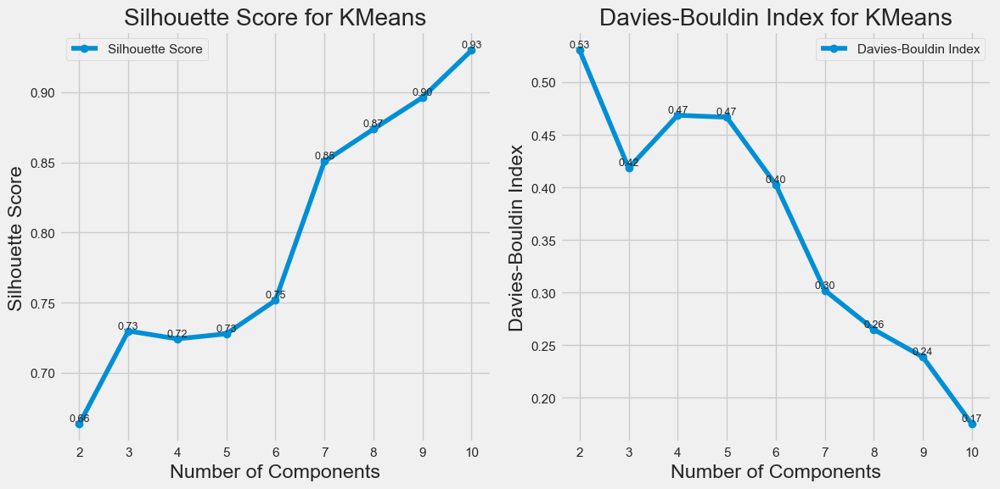

2025-01-16 00:27:40,024 - INFO - Plots for KMeans displayed.
2025-01-16 00:27:40,024 - INFO - Processing Ward...
2025-01-16 00:27:40,025 - INFO - Plotting results for Ward...


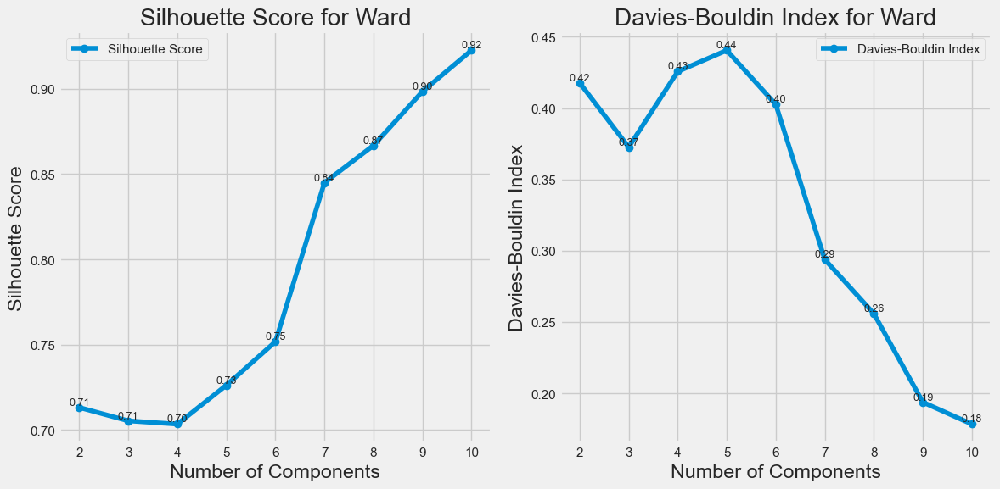

2025-01-16 00:27:40,186 - INFO - Plots for Ward displayed.
2025-01-16 00:27:40,186 - INFO - Processing GMM...
2025-01-16 00:27:40,187 - INFO - Plotting results for GMM...


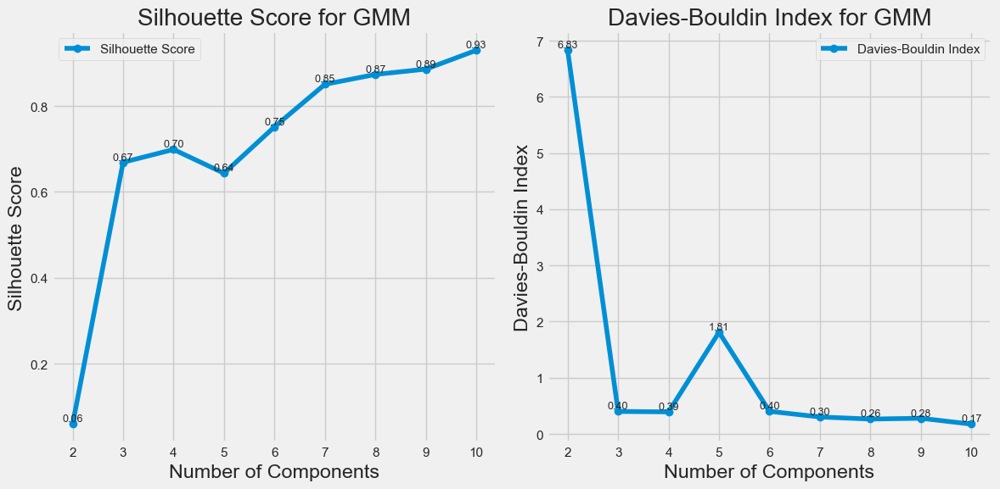

2025-01-16 00:27:40,340 - INFO - Plots for GMM displayed.
2025-01-16 00:27:40,340 - INFO - Processing DBSCAN...
2025-01-16 00:27:40,341 - INFO - Plotting results for DBSCAN...


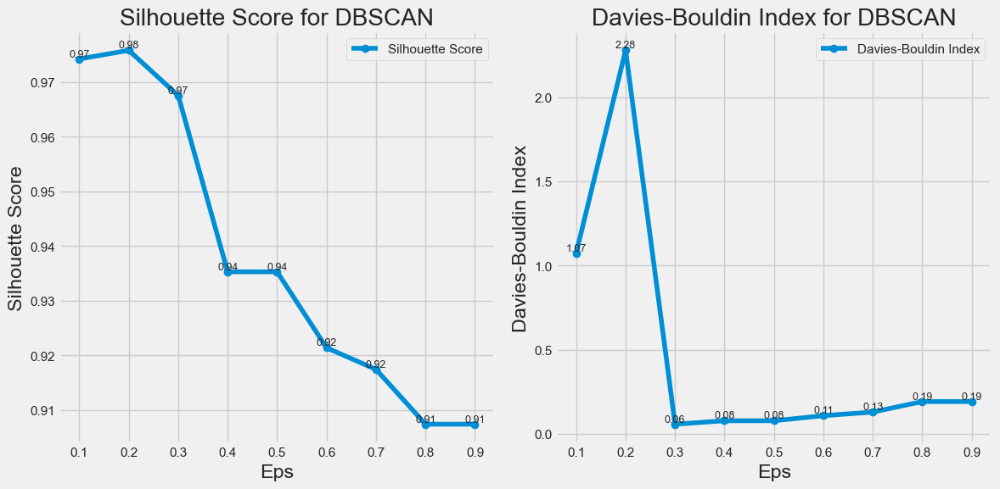

2025-01-16 00:27:40,497 - INFO - Plots for DBSCAN displayed.


In [171]:
# Plot results for each algorithm that requires n_components
algorithms = ['KMeans', 'Ward', 'GMM']
for algorithm in algorithms:
    logger.info(f"Processing {algorithm}...")
    silhouette_scores = []
    davies_bouldin_scores = []
    
    for n_components in n_components_range:
        key = f'{algorithm}_{n_components}'
        silhouette_scores.append(results[key]['Silhouette Score'])
        davies_bouldin_scores.append(results[key]['Davies-Bouldin Index'])
    
    plot_algorithm_scores(algorithm, n_components_range, silhouette_scores, davies_bouldin_scores, 'Number of Components')

# Plot results for DBSCAN
logger.info("Processing DBSCAN...")
plot_algorithm_scores('DBSCAN', eps_range, silhouette_scores_dbscan, davies_bouldin_scores_dbscan, 'Eps')

#### ***Cluster Visulization***

2025-01-16 00:31:20,308 - INFO - Visualizing clusters for Kmeans...


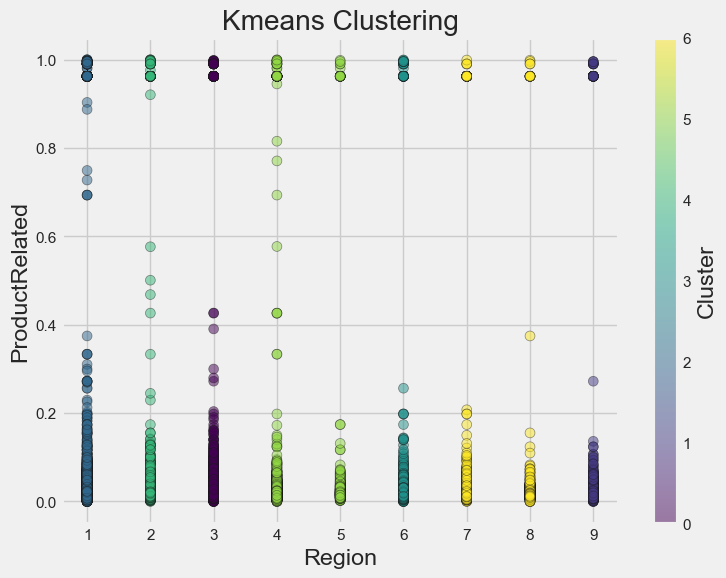

2025-01-16 00:31:20,518 - INFO - Cluster visualization for Kmeans displayed.

2025-01-16 00:31:20,518 - INFO - ------------------------------------------------------
2025-01-16 00:31:22,564 - INFO - Visualizing clusters for Ward...


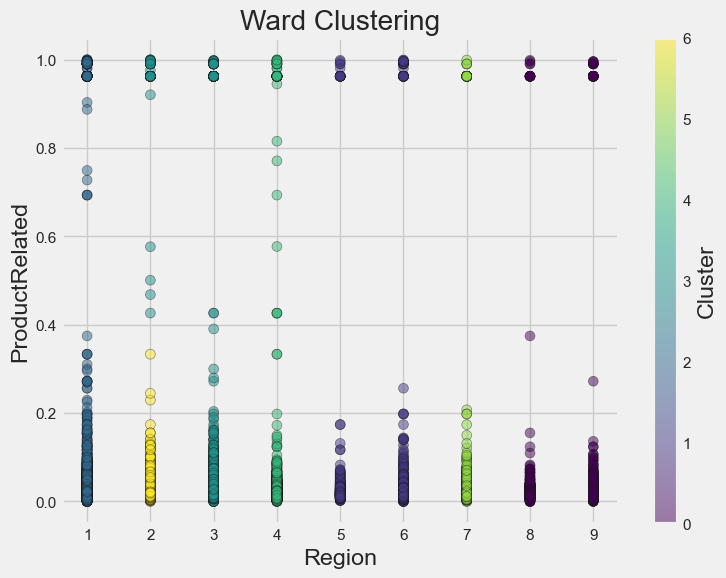

2025-01-16 00:31:22,758 - INFO - Cluster visualization for Ward displayed.

2025-01-16 00:31:22,759 - INFO - ------------------------------------------------------
2025-01-16 00:31:22,788 - INFO - Visualizing clusters for GMM...


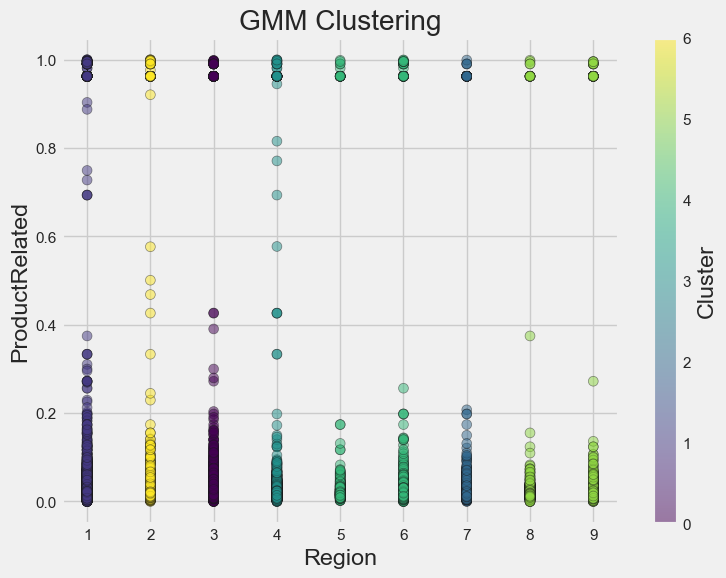

2025-01-16 00:31:22,999 - INFO - Cluster visualization for GMM displayed.

2025-01-16 00:31:23,000 - INFO - ------------------------------------------------------
2025-01-16 00:31:23,006 - INFO - Visualizing clusters for DBSCAN...


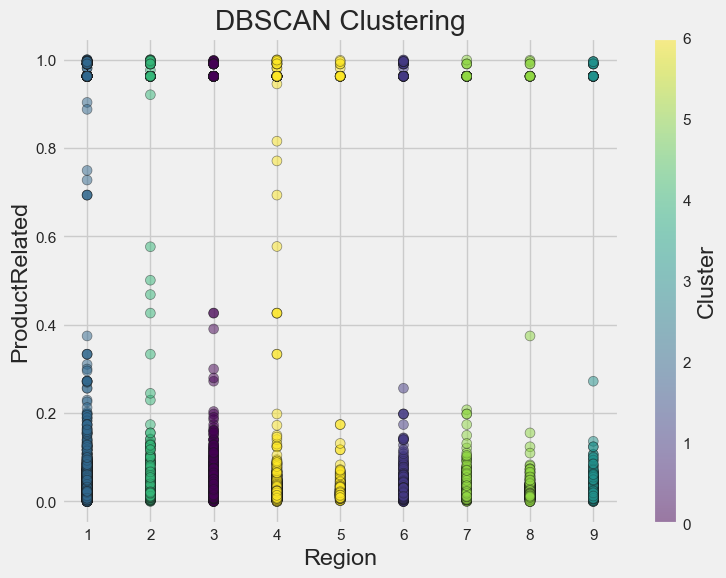

2025-01-16 00:31:23,461 - INFO - Cluster visualization for DBSCAN displayed.

2025-01-16 00:31:23,462 - INFO - ------------------------------------------------------


In [179]:
# Visualize Kmeans clusters
kmeans= KMeans(n_clusters=7)
labels_kmeans = kmeans.fit_predict(X_FSSEM_cls)
visualize_clusters(X_FSSEM_cls, labels_kmeans, 'Kmeans')

# Visualize Ward clusters
ward = AgglomerativeClustering(n_clusters=7)
labels_ward = ward.fit_predict(X_FSSEM_cls)
visualize_clusters(X_FSSEM_cls, labels_ward, 'Ward')

# Visualize GMM clusters
gmm = GaussianMixture(n_components=7, covariance_type='full', random_state=42)
labels_gmm = gmm.fit_predict(X_FSSEM_cls)
visualize_clusters(X_FSSEM_cls, labels_gmm, 'GMM')

# Visualize DBSCAN clusters
dbscan = DBSCAN(eps=0.3, min_samples=10)
labels_dbscan = kmeans.fit_predict(X_FSSEM_cls)
visualize_clusters(X_FSSEM_cls, labels_dbscan, 'DBSCAN')

### **Subset Feature from Similarity Search**

#### ***Cluster Evaluation***

In [134]:
# Evaluate clustering algorithms that require n_components
logger.info(f"Evaluating clustering algorithms for n_components_range = {list(n_components_range)}...")
results = evaluate_clustering(X_FS_cls, n_components_range)

# Evaluate DBSCAN for the range of eps values
silhouette_scores_dbscan, davies_bouldin_scores_dbscan = evaluate_dbscan(X_FS_cls, eps_range, min_samples)

2025-01-15 23:45:06,488 - INFO - Evaluating clustering algorithms for n_components_range = [2, 3, 4, 5, 6, 7, 8, 9, 10]...
2025-01-15 23:45:06,489 - INFO - Starting clustering evaluation...
2025-01-15 23:45:06,489 - INFO - Evaluating algorithms for n_components = 2...
2025-01-15 23:45:06,489 - INFO - Running K-Means...
2025-01-15 23:45:07,716 - INFO - Running Ward Agglomerative Clustering...
2025-01-15 23:45:11,284 - INFO - Running Gaussian Mixture Model (GMM)...
2025-01-15 23:45:12,560 - INFO - Evaluating algorithms for n_components = 3...
2025-01-15 23:45:12,561 - INFO - Running K-Means...
2025-01-15 23:45:13,831 - INFO - Running Ward Agglomerative Clustering...
2025-01-15 23:45:17,373 - INFO - Running Gaussian Mixture Model (GMM)...
2025-01-15 23:45:18,696 - INFO - Evaluating algorithms for n_components = 4...
2025-01-15 23:45:18,698 - INFO - Running K-Means...
2025-01-15 23:45:19,864 - INFO - Running Ward Agglomerative Clustering...
2025-01-15 23:45:23,279 - INFO - Running Gaussian

2025-01-15 23:46:11,852 - INFO - Processing KMeans...
2025-01-15 23:46:11,853 - INFO - Plotting results for KMeans...


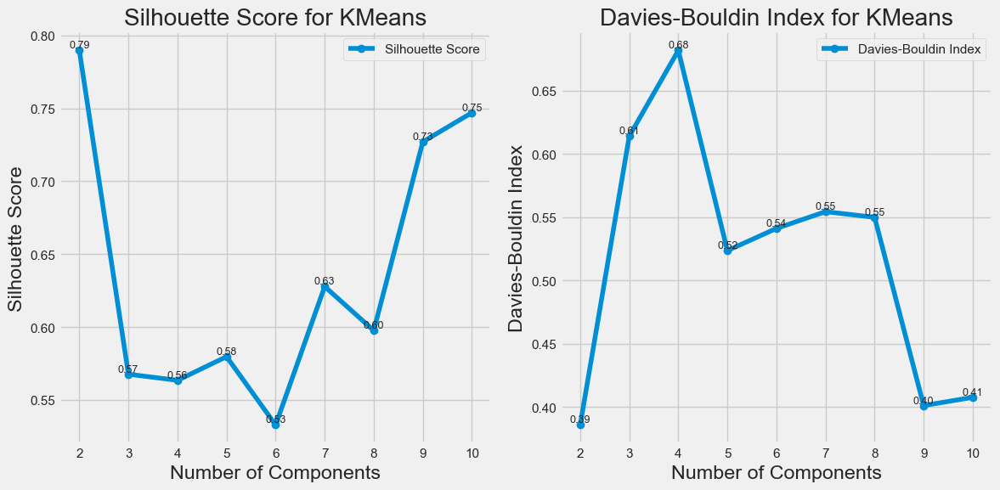

2025-01-15 23:46:12,003 - INFO - Plots for KMeans displayed.
2025-01-15 23:46:12,003 - INFO - Processing Ward...
2025-01-15 23:46:12,004 - INFO - Plotting results for Ward...


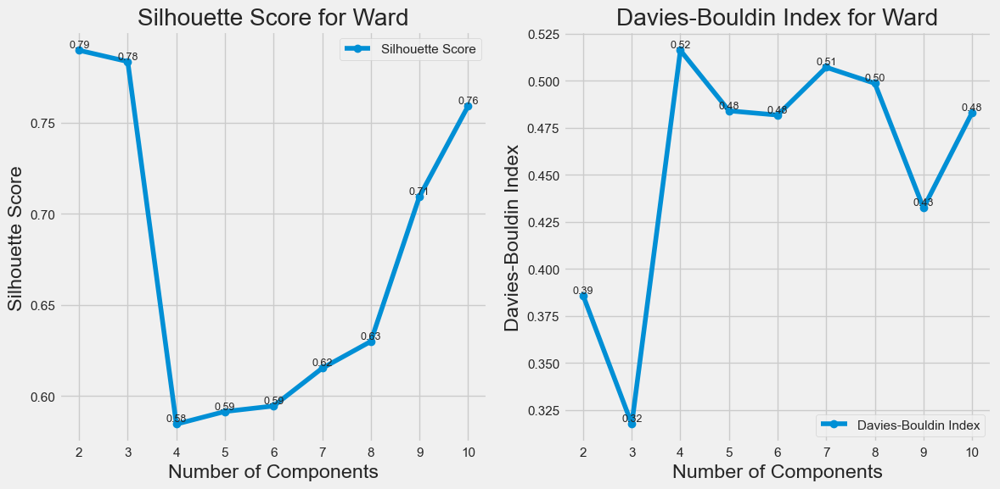

2025-01-15 23:46:12,173 - INFO - Plots for Ward displayed.
2025-01-15 23:46:12,173 - INFO - Processing GMM...
2025-01-15 23:46:12,173 - INFO - Plotting results for GMM...


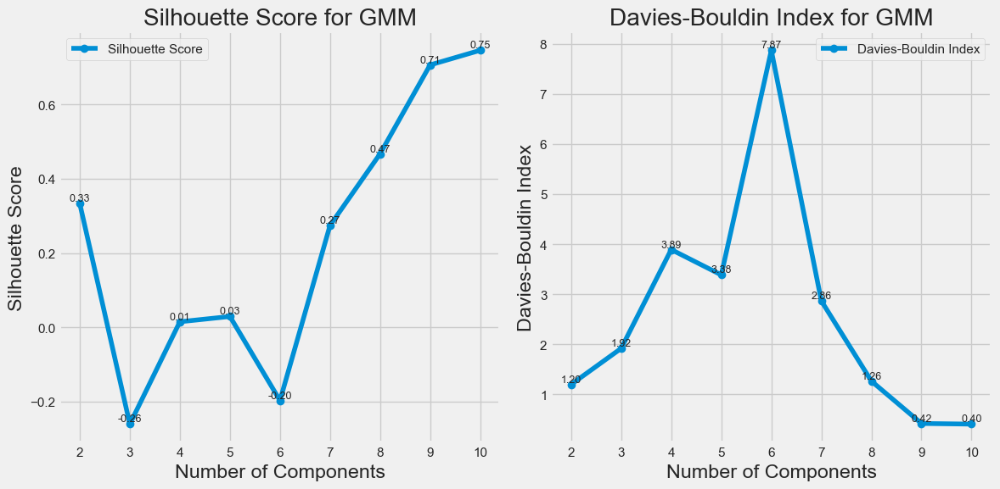

2025-01-15 23:46:12,471 - INFO - Plots for GMM displayed.
2025-01-15 23:46:12,472 - INFO - Processing DBSCAN...
2025-01-15 23:46:12,472 - INFO - Plotting results for DBSCAN...


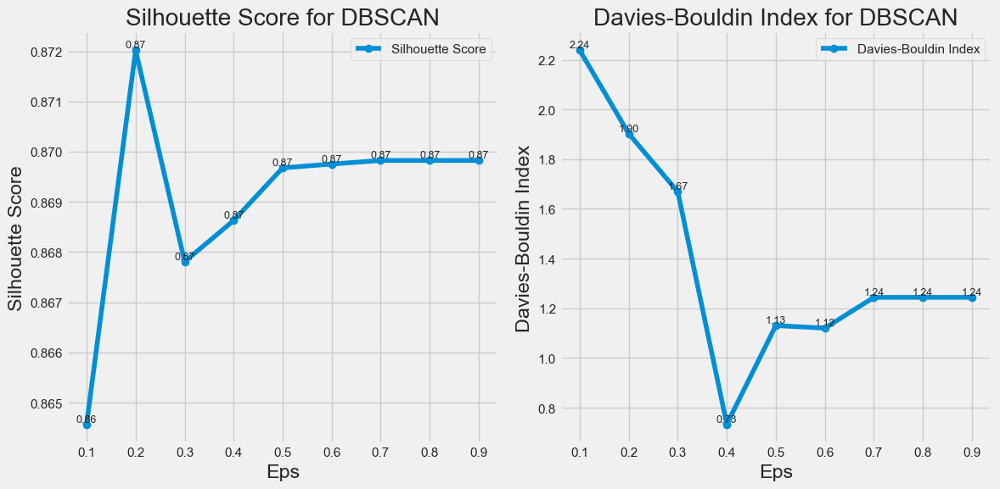

2025-01-15 23:46:12,629 - INFO - Plots for DBSCAN displayed.


In [135]:
# Plot results for each algorithm that requires n_components
algorithms = ['KMeans', 'Ward', 'GMM']
for algorithm in algorithms:
    logger.info(f"Processing {algorithm}...")
    silhouette_scores = []
    davies_bouldin_scores = []
    
    for n_components in n_components_range:
        key = f'{algorithm}_{n_components}'
        silhouette_scores.append(results[key]['Silhouette Score'])
        davies_bouldin_scores.append(results[key]['Davies-Bouldin Index'])
    
    plot_algorithm_scores(algorithm, n_components_range, silhouette_scores, davies_bouldin_scores, 'Number of Components')

# Plot results for DBSCAN
logger.info("Processing DBSCAN...")
plot_algorithm_scores('DBSCAN', eps_range, silhouette_scores_dbscan, davies_bouldin_scores_dbscan, 'Eps')

#### ***Cluster Visualization***

(<Figure size 640x480 with 2 Axes>,
 <Axes3D: xlabel='Revenue', ylabel='ProductRelated_Duration', zlabel='TrafficType'>)

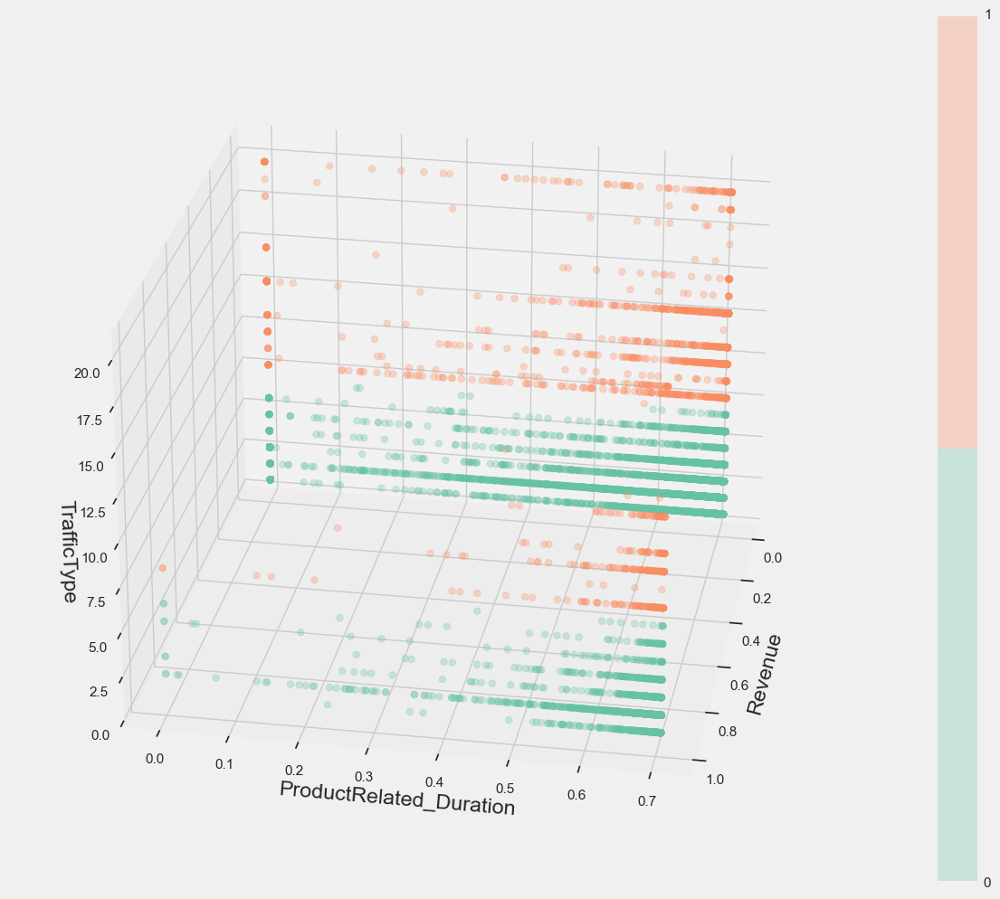

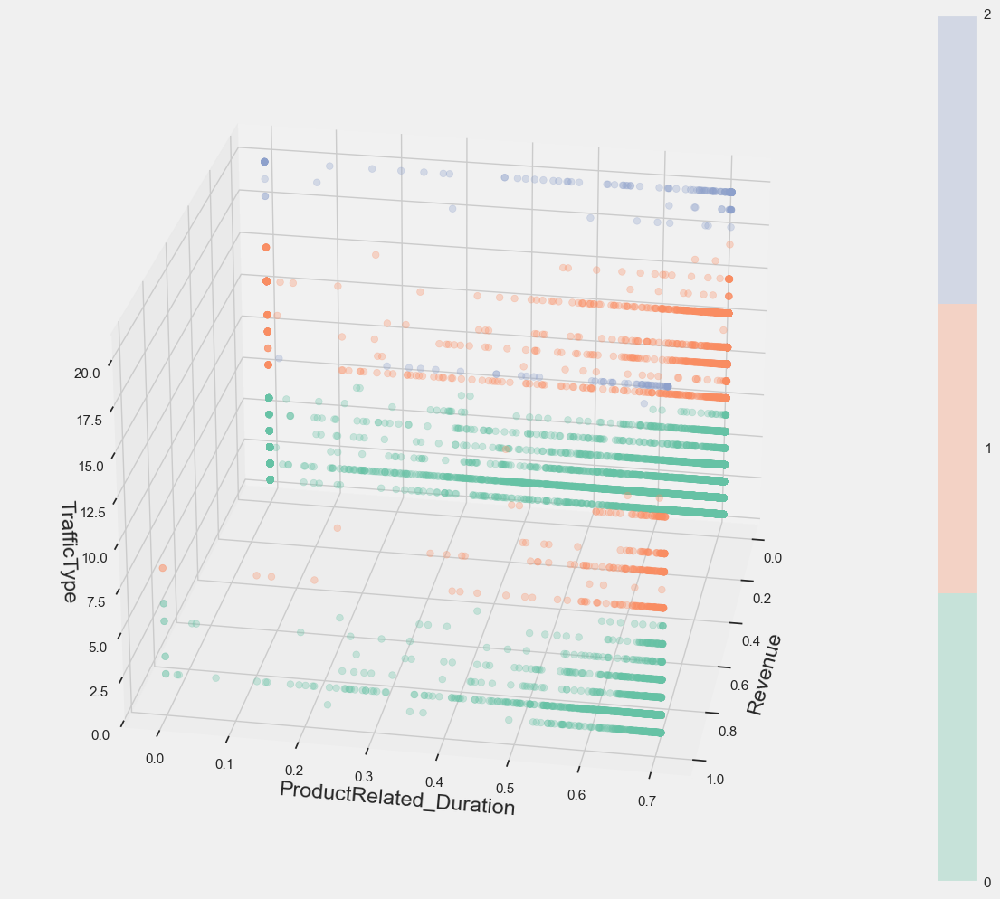

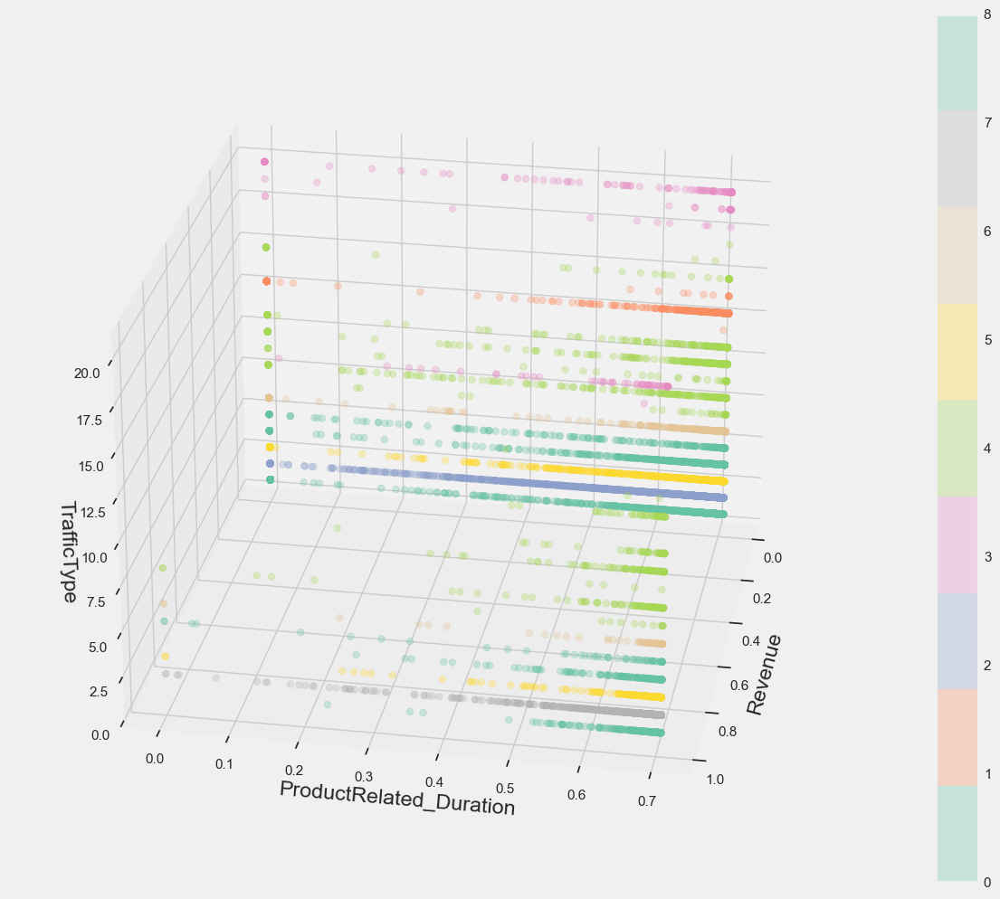

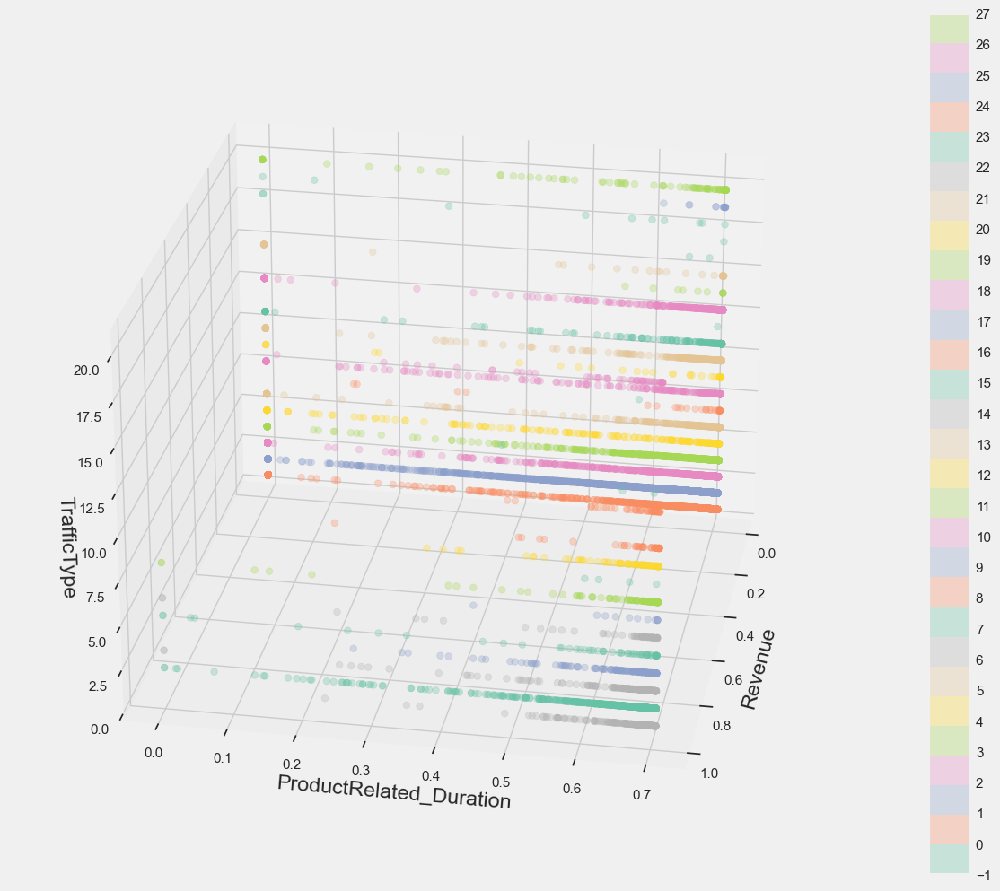

In [178]:
kmeans= KMeans(n_clusters=2)
labels_kmeans = kmeans.fit_predict(X_FS_cls)
show_scatter_3d(df_clustering, X_FS_cls.columns[0], X_FS_cls.columns[1], X_FS_cls.columns[2], predicted=labels_kmeans, show_colorbar=True)

# Visualize Ward clusters
ward = AgglomerativeClustering(n_clusters=3)
labels_ward = ward.fit_predict(X_FS_cls)
show_scatter_3d(df_clustering, X_FS_cls.columns[0], X_FS_cls.columns[1], X_FS_cls.columns[2], predicted=labels_ward, show_colorbar=True)

# Visualize GMM clusters
gmm = GaussianMixture(n_components=9, covariance_type='full', random_state=42)
labels_gmm = gmm.fit_predict(X_FS_cls)
show_scatter_3d(df_clustering, X_FS_cls.columns[0], X_FS_cls.columns[1], X_FS_cls.columns[2], predicted=labels_gmm, show_colorbar=True)

# Visualize DBSCAN clusters
dbscan = DBSCAN(eps=0.4, min_samples=10)
labels_dbscan = dbscan.fit_predict(X_FS_cls)
show_scatter_3d(df_clustering, X_FS_cls.columns[0], X_FS_cls.columns[1], X_FS_cls.columns[2], predicted=labels_dbscan, show_colorbar=True)

## **Classification Task**

In the classification task, modeling is performed at two levels: the **data level** and the **algorithmic level**. At the **data level**, techniques are applied to address class imbalance, including **Undersampling** (reducing the majority class), **Oversampling** (increasing the minority class, e.g., using SMOTE), and **HybridSampling** (a combination of both). These methods aim to balance the dataset and improve model performance on minority classes. At the **algorithmic level**, three approaches are implemented: the **threshold method**, which adjusts the decision threshold to optimize classification outcomes; **cost-sensitive learning**, where class weights are adjusted to penalize misclassifications of the minority class more heavily; and a combination of **cost-sensitive learning + threshold method** for enhanced performance. The threshold method is also applied to the three data-level sampling techniques (Undersampling, Oversampling, HybridSampling) to evaluate their combined impact. For each method and its combinations, base models such as **RandomForest**, **GradientBoosting**, **HistGradientBoosting**, **ExtraTrees**, and **DecisionTree** are built, followed by **hyperparameter tuning** to optimize model performance. Additionally, for each model, the **ROC-AUC score** is plotted to evaluate the trade-off between true positive rate and false positive rate across different thresholds, providing a comprehensive measure of classification performance. This approach ensures robust evaluation and improvement of classification results across diverse scenarios.

### **Base Level**

#### ***Base model***

Training and evaluating base RandomForest...

Results for  RandomForest:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      2072
           1       0.78      0.59      0.68       369

    accuracy                           0.91      2441
   macro avg       0.86      0.78      0.81      2441
weighted avg       0.91      0.91      0.91      2441

	ROC-AUC Score: 0.9262
	F1 Score: 0.6759
	G-mean: 0.7592
	Confusion Matrix:
 [[2012   60]
 [ 150  219]]


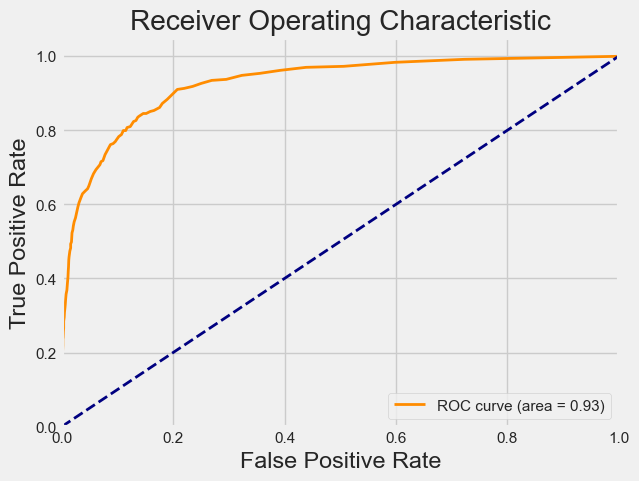

Training and evaluating base GradientBoosting...

Results for  GradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.96      0.95      2072
           1       0.74      0.62      0.68       369

    accuracy                           0.91      2441
   macro avg       0.84      0.79      0.81      2441
weighted avg       0.91      0.91      0.91      2441

	ROC-AUC Score: 0.9353
	F1 Score: 0.6755
	G-mean: 0.7724
	Confusion Matrix:
 [[1992   80]
 [ 140  229]]


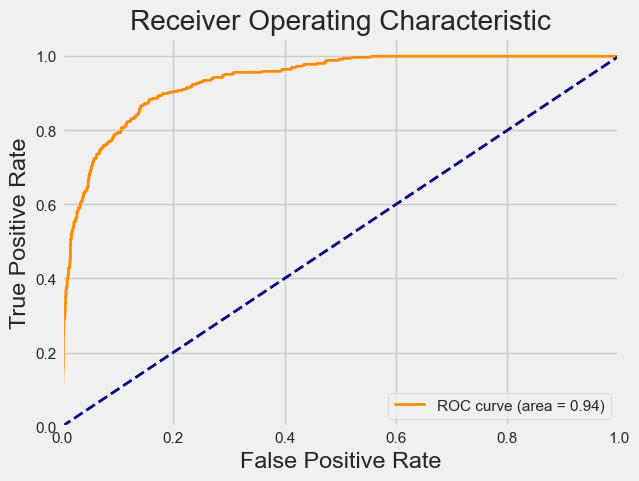

Training and evaluating base HistGradientBoosting...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.96      0.95      2072
           1       0.74      0.62      0.68       369

    accuracy                           0.91      2441
   macro avg       0.84      0.79      0.81      2441
weighted avg       0.91      0.91      0.91      2441

	ROC-AUC Score: 0.9378
	F1 Score: 0.6765
	G-mean: 0.7739
	Confusion Matrix:
 [[1991   81]
 [ 139  230]]


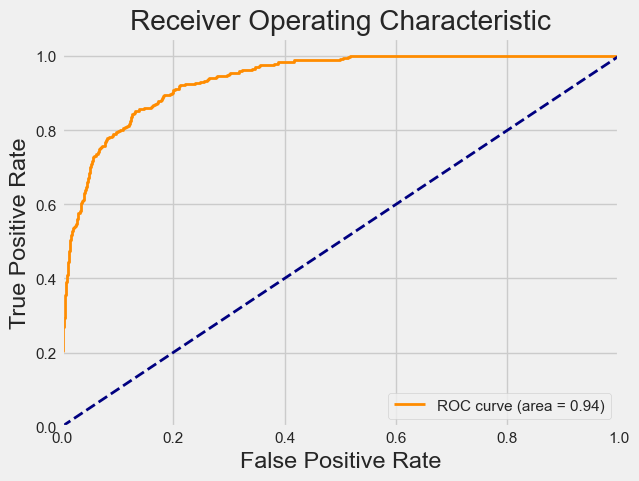

Training and evaluating base ExtraTrees...

Results for  ExtraTrees:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95      2072
           1       0.79      0.51      0.62       369

    accuracy                           0.91      2441
   macro avg       0.86      0.74      0.78      2441
weighted avg       0.90      0.91      0.90      2441

	ROC-AUC Score: 0.9195
	F1 Score: 0.6227
	G-mean: 0.7072
	Confusion Matrix:
 [[2023   49]
 [ 180  189]]


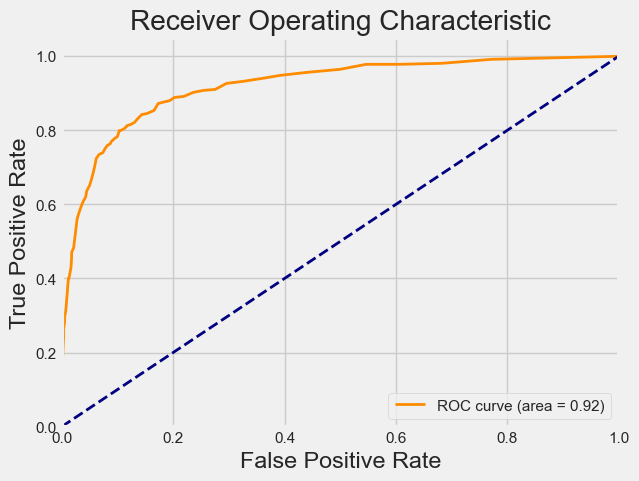

Training and evaluating base DecisionTree...

Results for  DecisionTree:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      2072
           1       0.55      0.59      0.57       369

    accuracy                           0.87      2441
   macro avg       0.74      0.75      0.74      2441
weighted avg       0.87      0.87      0.87      2441

	ROC-AUC Score: 0.7513
	F1 Score: 0.5688
	G-mean: 0.7334
	Confusion Matrix:
 [[1895  177]
 [ 152  217]]


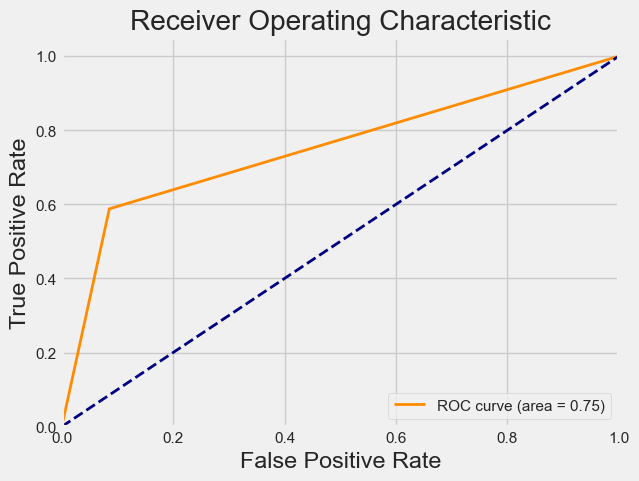

In [137]:
base_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name}...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
    )
    base_result[model_name] = results

#### ***Tunned model***

Training and evaluating base RandomForest with Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'bootstrap': True, 'class_weight': 'balanced_subsample', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 15, 'n_estimators': 458}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.80      0.68       369

    accuracy                           0.88      2441
   macro avg       0.77      0.85      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9310
	F1 Score: 0.6759
	G-mean: 0.8468
	Confusion Matrix:
 [[1865  207]
 [  75  294]]


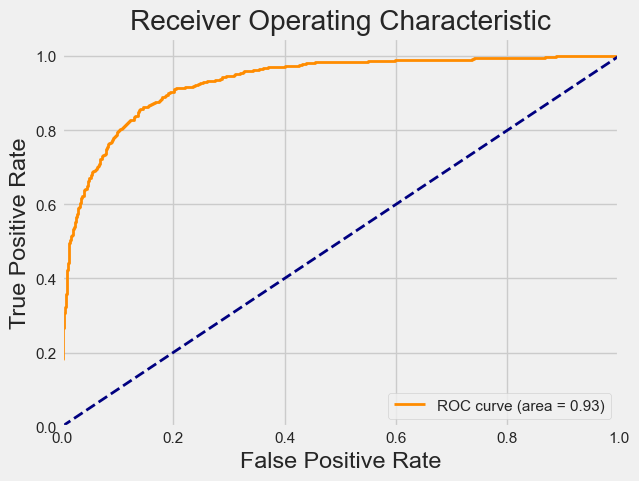

Training and evaluating base GradientBoosting with Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'learning_rate': 0.023999698964084628, 'loss': 'exponential', 'max_depth': 9, 'max_features': 'log2', 'min_samples_leaf': 15, 'min_samples_split': 13, 'n_estimators': 154, 'subsample': 0.9916154429033941}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      2072
           1       0.78      0.59      0.67       369

    accuracy                           0.91      2441
   macro avg       0.85      0.78      0.81      2441
weighted avg       0.91      0.91      0.91      2441

	ROC-AUC Score: 0.9378
	F1 Score: 0.6718
	G-mean: 0.7570
	Confusion Matrix:
 [[2010   62]
 [ 151  218]]


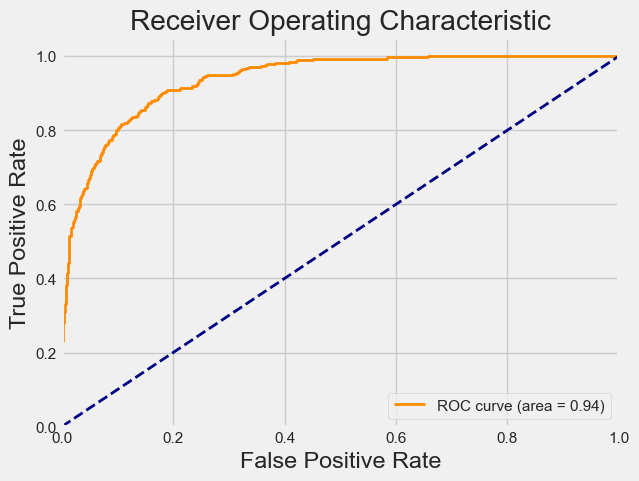

Training and evaluating base HistGradientBoosting with Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'class_weight': 'balanced', 'early_stopping': False, 'l2_regularization': 0.03142918568673425, 'learning_rate': 0.20092312337913412, 'max_bins': 101, 'max_depth': 7, 'max_iter': 195, 'max_leaf_nodes': 13, 'min_samples_leaf': 5}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.93      2072
           1       0.57      0.79      0.66       369

    accuracy                           0.88      2441
   macro avg       0.77      0.84      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9303
	F1 Score: 0.6644
	G-mean: 0.8415
	Confusion Matrix:
 [[1854  218]
 [  77  292]]


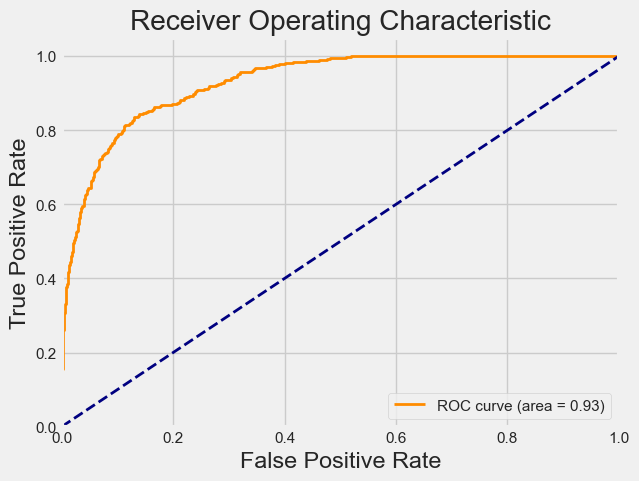

Training and evaluating base ExtraTrees with Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'bootstrap': False, 'class_weight': 'balanced_subsample', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 4, 'n_estimators': 271}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.93      2072
           1       0.57      0.81      0.67       369

    accuracy                           0.88      2441
   macro avg       0.76      0.85      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9335
	F1 Score: 0.6659
	G-mean: 0.8478
	Confusion Matrix:
 [[1844  228]
 [  71  298]]


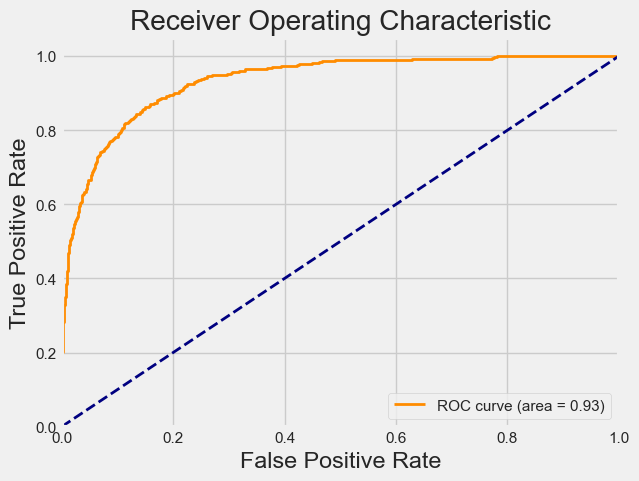

Training and evaluating base DecisionTree with Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 11, 'min_samples_split': 12, 'splitter': 'random'}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.88      0.92      2072
           1       0.54      0.83      0.66       369

    accuracy                           0.87      2441
   macro avg       0.76      0.86      0.79      2441
weighted avg       0.90      0.87      0.88      2441

	ROC-AUC Score: 0.8974
	F1 Score: 0.6588
	G-mean: 0.8548
	Confusion Matrix:
 [[1814  258]
 [  61  308]]


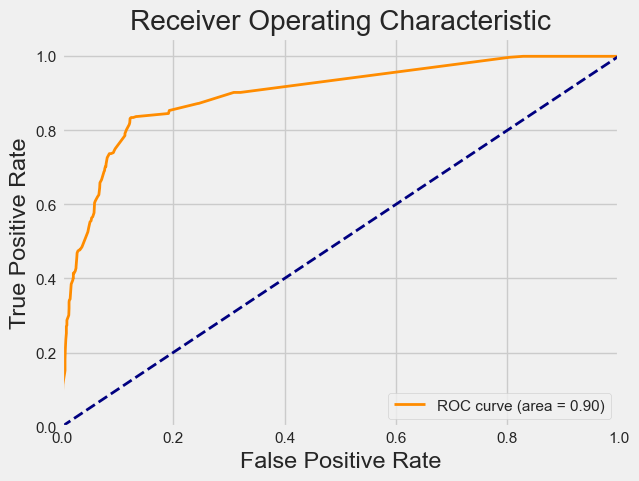

In [138]:
tunned_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name} with Hyperparameter tuning...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name=model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params=config["params"],
        search=True
    )
    tunned_result[model_name] = results

### **Data Level**

#### ***Under sampling***

##### *Base model*

Training and evaluating base RandomForest with Undersampling...

Results for  RandomForest:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.61      0.75      2072
           1       0.29      0.90      0.44       369

    accuracy                           0.66      2441
   macro avg       0.63      0.76      0.60      2441
weighted avg       0.87      0.66      0.71      2441

	ROC-AUC Score: 0.8235
	F1 Score: 0.4430
	G-mean: 0.7438
	Confusion Matrix:
 [[1274  798]
 [  37  332]]


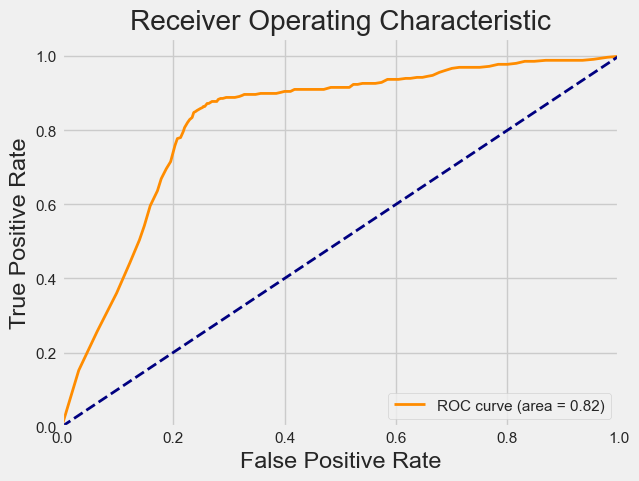

Training and evaluating base GradientBoosting with Undersampling...

Results for  GradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.60      0.74      2072
           1       0.29      0.90      0.43       369

    accuracy                           0.65      2441
   macro avg       0.63      0.75      0.59      2441
weighted avg       0.87      0.65      0.70      2441

	ROC-AUC Score: 0.8271
	F1 Score: 0.4335
	G-mean: 0.7342
	Confusion Matrix:
 [[1245  827]
 [  38  331]]


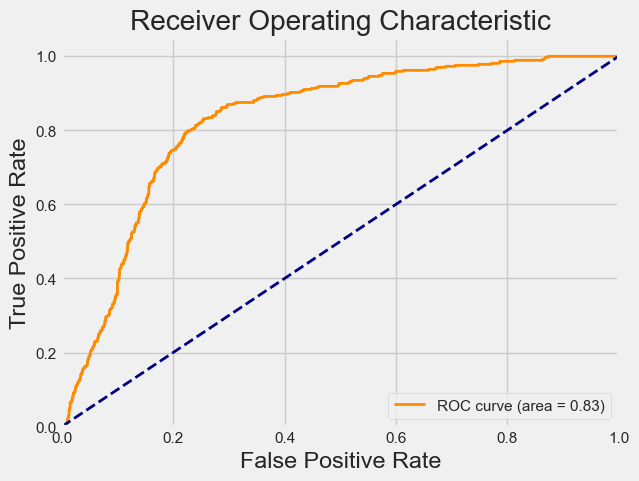

Training and evaluating base HistGradientBoosting with Undersampling...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.60      0.74      2072
           1       0.29      0.91      0.44       369

    accuracy                           0.65      2441
   macro avg       0.63      0.75      0.59      2441
weighted avg       0.87      0.65      0.70      2441

	ROC-AUC Score: 0.8326
	F1 Score: 0.4372
	G-mean: 0.7381
	Confusion Matrix:
 [[1247  825]
 [  35  334]]


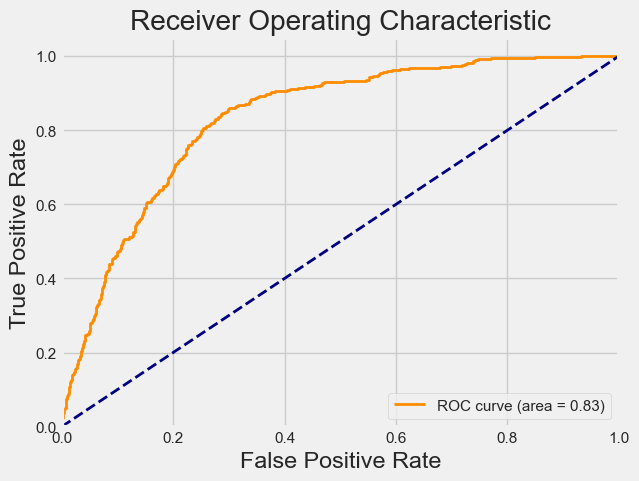

Training and evaluating base ExtraTrees with Undersampling...

Results for  ExtraTrees:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.54      0.69      2072
           1       0.26      0.91      0.40       369

    accuracy                           0.59      2441
   macro avg       0.61      0.72      0.55      2441
weighted avg       0.86      0.59      0.65      2441

	ROC-AUC Score: 0.8015
	F1 Score: 0.4019
	G-mean: 0.6971
	Confusion Matrix:
 [[1109  963]
 [  34  335]]


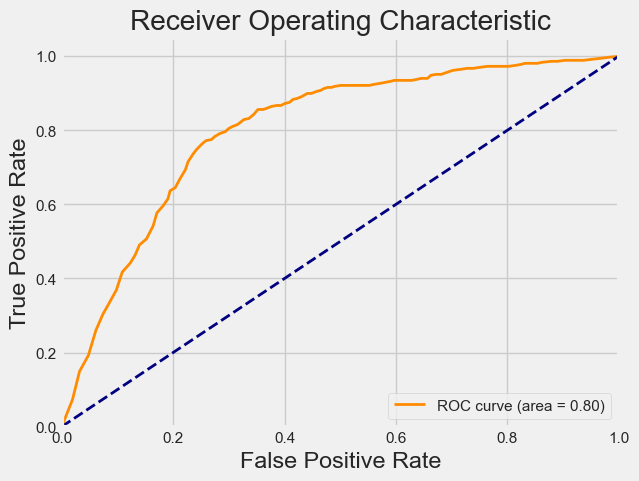

Training and evaluating base DecisionTree with Undersampling...

Results for  DecisionTree:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.51      0.67      2072
           1       0.25      0.89      0.38       369

    accuracy                           0.57      2441
   macro avg       0.60      0.70      0.53      2441
weighted avg       0.86      0.57      0.63      2441

	ROC-AUC Score: 0.7016
	F1 Score: 0.3848
	G-mean: 0.6754
	Confusion Matrix:
 [[1060 1012]
 [  40  329]]


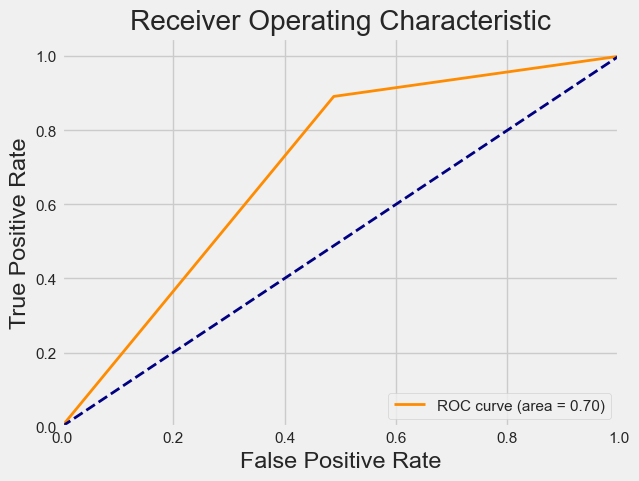

In [139]:
undersampling_base_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name} with Undersampling...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        pipeline=ImbPipeline(steps=[
            ('smote', NearMiss()),
            ('model', config["base_model"])
        ])
    )
    undersampling_base_result[model_name] = results

##### *Tunned model*

Training and evaluating base RandomForest with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'model__bootstrap': True, 'model__class_weight': None, 'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 14, 'model__min_samples_split': 19, 'model__n_estimators': 364}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.70      0.81      2072
           1       0.34      0.89      0.50       369

    accuracy                           0.73      2441
   macro avg       0.66      0.79      0.65      2441
weighted avg       0.88      0.73      0.77      2441

	ROC-AUC Score: 0.8431
	F1 Score: 0.4958
	G-mean: 0.7872
	Confusion Matrix:
 [[1449  623]
 [  42  327]]


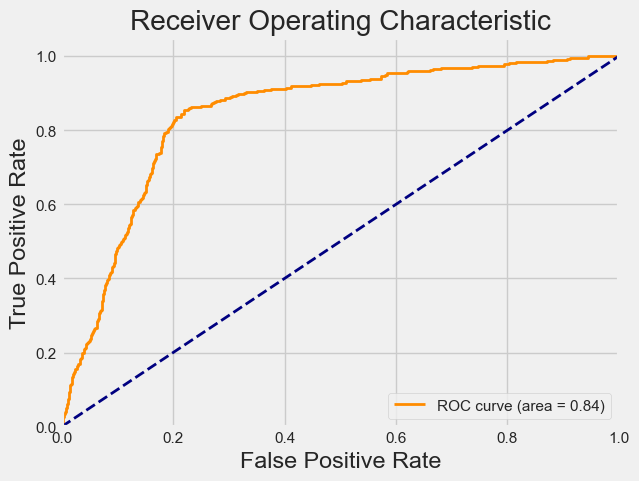

Training and evaluating base GradientBoosting with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'model__learning_rate': 0.06597101766581075, 'model__loss': 'exponential', 'model__max_depth': 8, 'model__max_features': None, 'model__min_samples_leaf': 7, 'model__min_samples_split': 2, 'model__n_estimators': 484, 'model__subsample': 0.6139675812709708}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.66      0.79      2072
           1       0.32      0.90      0.48       369

    accuracy                           0.70      2441
   macro avg       0.65      0.78      0.63      2441
weighted avg       0.88      0.70      0.74      2441

	ROC-AUC Score: 0.8619
	F1 Score: 0.4754
	G-mean: 0.7733
	Confusion Matrix:
 [[1373  699]
 [  36  333]]


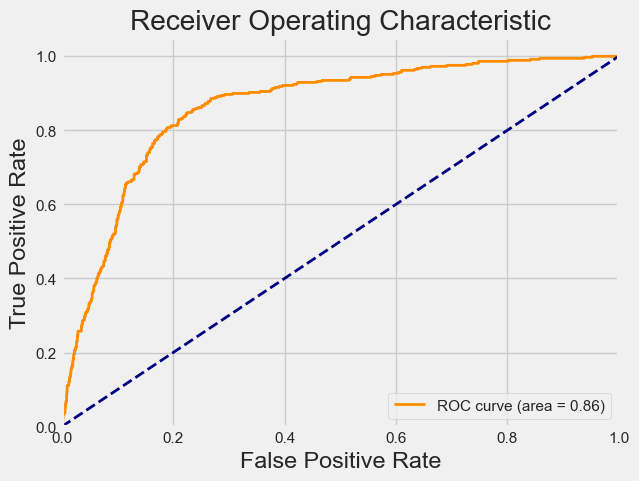

Training and evaluating base HistGradientBoosting with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'model__class_weight': None, 'model__early_stopping': 'auto', 'model__l2_regularization': 0.1834347898661638, 'model__learning_rate': 0.24390730008183079, 'model__max_bins': 70, 'model__max_depth': 9, 'model__max_iter': 221, 'model__max_leaf_nodes': 92, 'model__min_samples_leaf': 11}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.62      0.76      2072
           1       0.30      0.91      0.45       369

    accuracy                           0.66      2441
   macro avg       0.64      0.77      0.60      2441
weighted avg       0.87      0.66      0.71      2441

	ROC-AUC Score: 0.8460
	F1 Score: 0.4510
	G-mean: 0.7521
	Confusion Matrix:
 [[1287  785]
 [  33  336]]


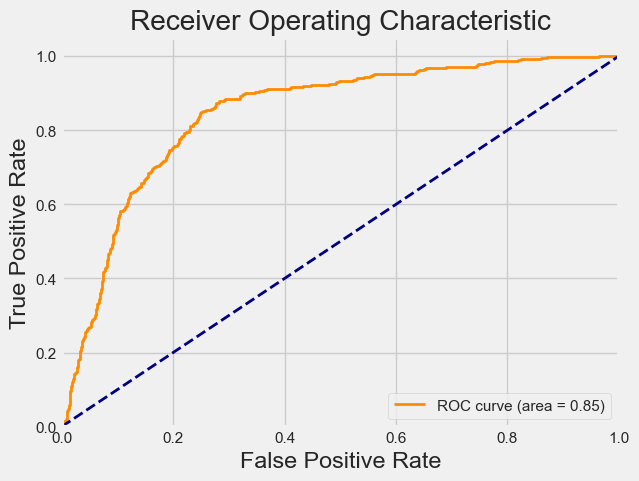

Training and evaluating base ExtraTrees with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'model__bootstrap': True, 'model__class_weight': 'balanced_subsample', 'model__max_depth': 30, 'model__max_features': None, 'model__min_samples_leaf': 15, 'model__min_samples_split': 13, 'model__n_estimators': 154}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.69      0.80      2072
           1       0.34      0.89      0.49       369

    accuracy                           0.72      2441
   macro avg       0.65      0.79      0.65      2441
weighted avg       0.88      0.72      0.76      2441

	ROC-AUC Score: 0.8545
	F1 Score: 0.4870
	G-mean: 0.7810
	Confusion Matrix:
 [[1422  650]
 [  41  328]]


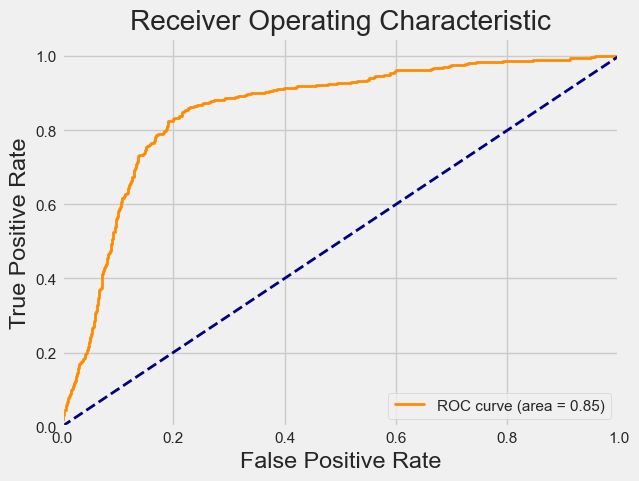

Training and evaluating base DecisionTree with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__criterion': 'entropy', 'model__max_depth': 50, 'model__max_features': None, 'model__min_samples_leaf': 12, 'model__min_samples_split': 9, 'model__splitter': 'random'}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.76      0.85      2072
           1       0.38      0.84      0.52       369

    accuracy                           0.77      2441
   macro avg       0.67      0.80      0.69      2441
weighted avg       0.88      0.77      0.80      2441

	ROC-AUC Score: 0.8410
	F1 Score: 0.5241
	G-mean: 0.7973
	Confusion Matrix:
 [[1568  504]
 [  59  310]]


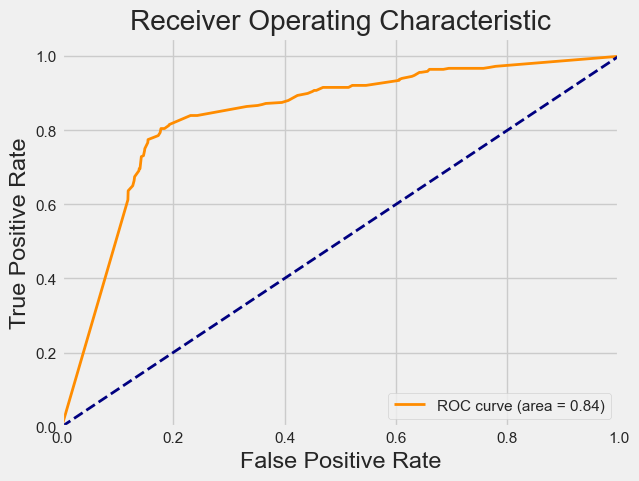

In [140]:
undersampling_tunned_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name} with Undersampling and Hyperparameter tuning...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name=model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params={"model__" + key: value for key, value in config["params"].items()},
        pipeline=ImbPipeline(steps=[
            ('NearMiss', NearMiss()),
            ('model', config["base_model"])
        ]),
        search=True
    )
    undersampling_tunned_result[model_name] = results

#### ***Over sampling***

##### *Base model*

Training and evaluating base RandomForest with oversampling...



Results for  RandomForest:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.62      0.74      0.67       369

    accuracy                           0.89      2441
   macro avg       0.79      0.83      0.81      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9278
	F1 Score: 0.6749
	G-mean: 0.8258
	Confusion Matrix:
 [[1903  169]
 [  95  274]]


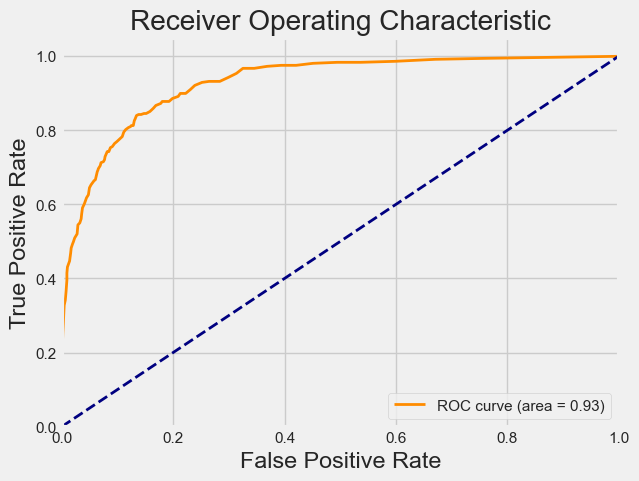

Training and evaluating base GradientBoosting with oversampling...

Results for  GradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.60      0.76      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9304
	F1 Score: 0.6667
	G-mean: 0.8289
	Confusion Matrix:
 [[1883  189]
 [  90  279]]


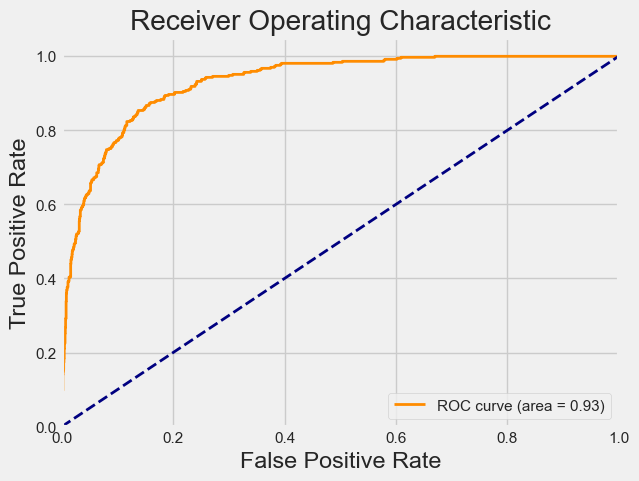

Training and evaluating base HistGradientBoosting with oversampling...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2072
           1       0.63      0.71      0.67       369

    accuracy                           0.89      2441
   macro avg       0.79      0.82      0.80      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9331
	F1 Score: 0.6684
	G-mean: 0.8120
	Confusion Matrix:
 [[1917  155]
 [ 106  263]]


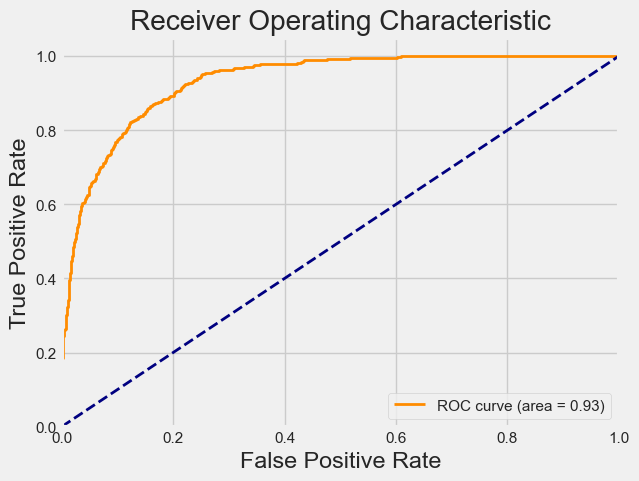

Training and evaluating base ExtraTrees with oversampling...

Results for  ExtraTrees:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.93      0.94      2072
           1       0.64      0.69      0.66       369

    accuracy                           0.89      2441
   macro avg       0.79      0.81      0.80      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9186
	F1 Score: 0.6614
	G-mean: 0.7989
	Confusion Matrix:
 [[1929  143]
 [ 116  253]]


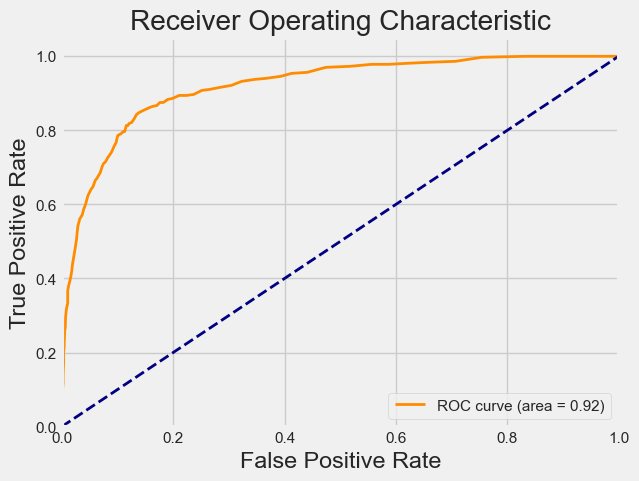

Training and evaluating base DecisionTree with oversampling...

Results for  DecisionTree:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.90      0.92      2072
           1       0.53      0.62      0.57       369

    accuracy                           0.86      2441
   macro avg       0.73      0.76      0.74      2441
weighted avg       0.87      0.86      0.86      2441

	ROC-AUC Score: 0.7597
	F1 Score: 0.5693
	G-mean: 0.7464
	Confusion Matrix:
 [[1868  204]
 [ 141  228]]


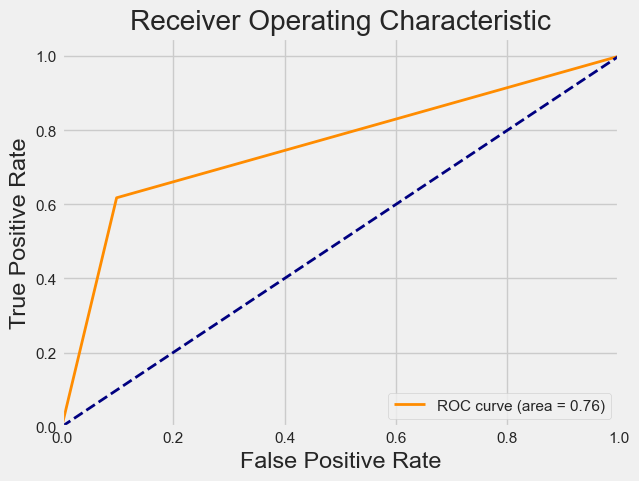

In [141]:
oversampling_base_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name} with oversampling...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name=model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        pipeline=ImbPipeline(steps=[
            ('smote', SMOTE(random_state=42)),
            ('model', config["base_model"])
        ])
    )
    oversampling_base_result[model_name] = results

##### *Tunned model*

Training and evaluating tuned RandomForest with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced', 'model__max_depth': None, 'model__max_features': 'log2', 'model__min_samples_leaf': 12, 'model__min_samples_split': 18, 'model__n_estimators': 158}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.77      0.67       369

    accuracy                           0.88      2441
   macro avg       0.77      0.84      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9297
	F1 Score: 0.6651
	G-mean: 0.8337
	Confusion Matrix:
 [[1871  201]
 [  85  284]]


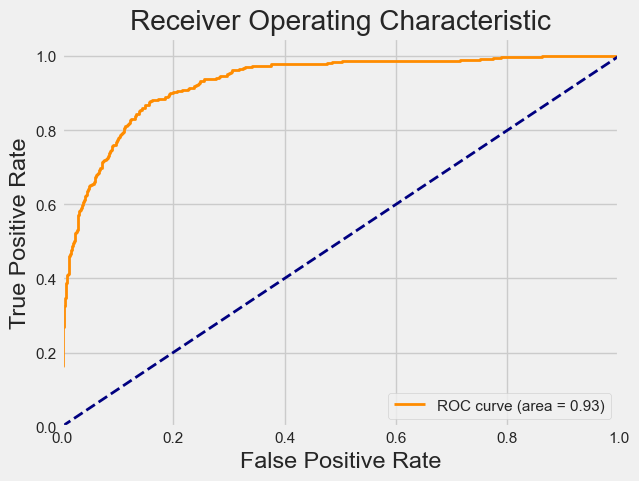

Training and evaluating tuned GradientBoosting with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'model__learning_rate': 0.023999698964084628, 'model__loss': 'exponential', 'model__max_depth': 9, 'model__max_features': 'log2', 'model__min_samples_leaf': 15, 'model__min_samples_split': 13, 'model__n_estimators': 154, 'model__subsample': 0.9916154429033941}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.59      0.75      0.66       369

    accuracy                           0.88      2441
   macro avg       0.77      0.83      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9341
	F1 Score: 0.6627
	G-mean: 0.8247
	Confusion Matrix:
 [[1884  188]
 [  93  276]]


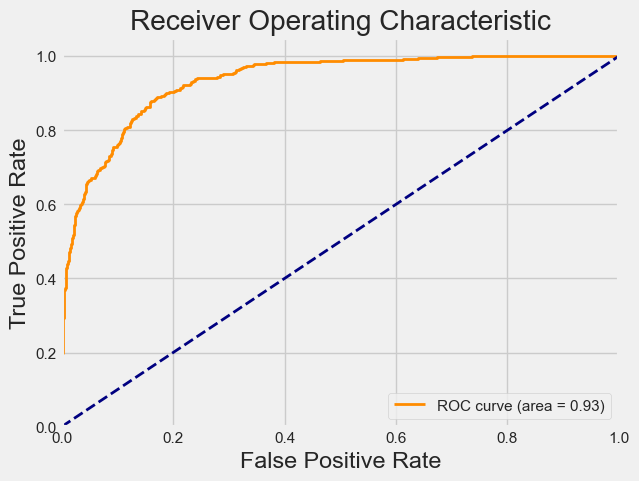

Training and evaluating tuned HistGradientBoosting with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__early_stopping': 'auto', 'model__l2_regularization': 0.8021969807540397, 'model__learning_rate': 0.032365193103931246, 'model__max_bins': 120, 'model__max_depth': 3, 'model__max_iter': 443, 'model__max_leaf_nodes': 10, 'model__min_samples_leaf': 12}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.62      0.75      0.68       369

    accuracy                           0.89      2441
   macro avg       0.79      0.83      0.81      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9315
	F1 Score: 0.6765
	G-mean: 0.8284
	Confusion Matrix:
 [[1901  171]
 [  93  276]]


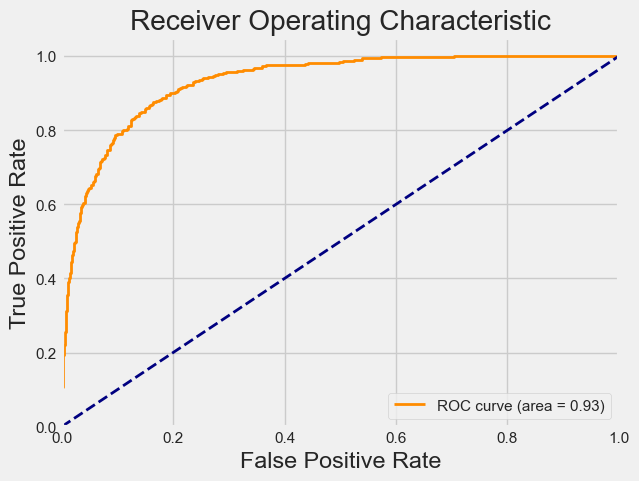

Training and evaluating tuned ExtraTrees with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced_subsample', 'model__max_depth': None, 'model__max_features': None, 'model__min_samples_leaf': 5, 'model__min_samples_split': 4, 'model__n_estimators': 271}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.92      2072
           1       0.57      0.77      0.65       369

    accuracy                           0.88      2441
   macro avg       0.76      0.83      0.79      2441
weighted avg       0.90      0.88      0.88      2441

	ROC-AUC Score: 0.9298
	F1 Score: 0.6536
	G-mean: 0.8303
	Confusion Matrix:
 [[1856  216]
 [  85  284]]


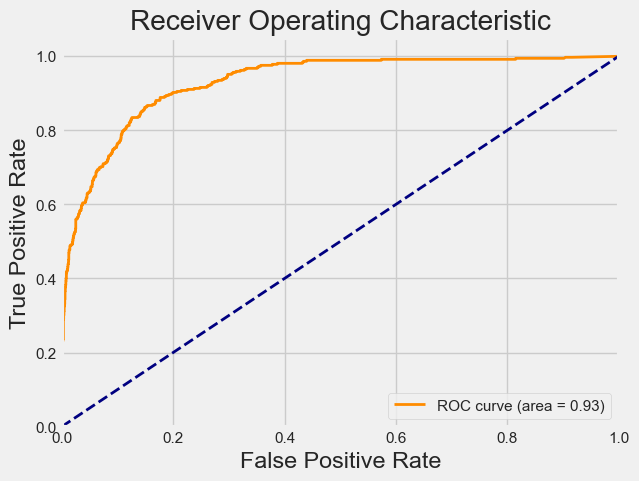

Training and evaluating tuned DecisionTree with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__criterion': 'gini', 'model__max_depth': 10, 'model__max_features': None, 'model__min_samples_leaf': 11, 'model__min_samples_split': 12, 'model__splitter': 'random'}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.88      0.91      2072
           1       0.52      0.77      0.62       369

    accuracy                           0.86      2441
   macro avg       0.74      0.82      0.77      2441
weighted avg       0.89      0.86      0.87      2441

	ROC-AUC Score: 0.8859
	F1 Score: 0.6220
	G-mean: 0.8194
	Confusion Matrix:
 [[1814  258]
 [  86  283]]


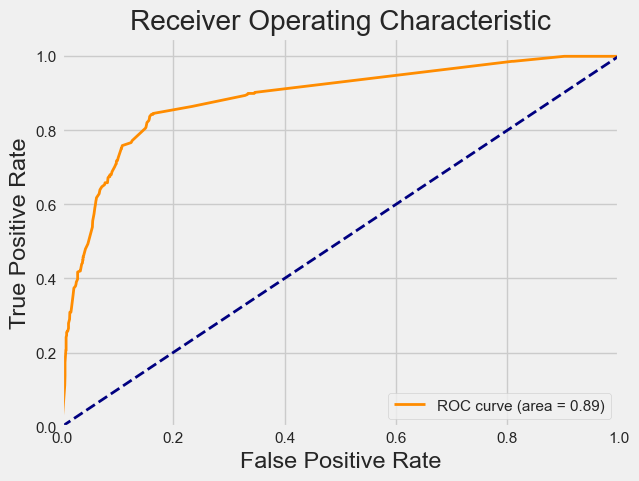

In [142]:
oversampling_tunned_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating tuned {model_name} with oversampling...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name=model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params={"model__" + key: value for key, value in config["params"].items()},
        pipeline=ImbPipeline(steps=[
            ('smote', SMOTE(random_state=42)),
            ('model', config["base_model"])
        ]),
        search=True,
    )
    oversampling_tunned_result[model_name] = results

#### ***Hybrid sampling***

##### *Base model*

Training and evaluating base RandomForest with oversampling...

Results for  RandomForest:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.93      2072
           1       0.61      0.73      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.82      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9255
	F1 Score: 0.6667
	G-mean: 0.8183
	Confusion Matrix:
 [[1903  169]
 [ 100  269]]


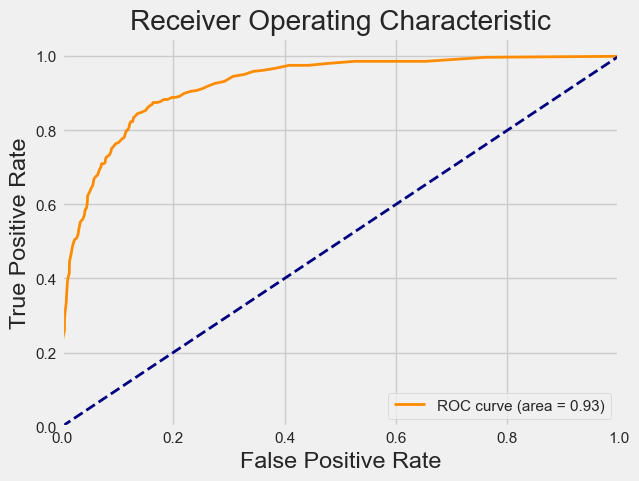

Training and evaluating base GradientBoosting with oversampling...

Results for  GradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.60      0.75      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9307
	F1 Score: 0.6659
	G-mean: 0.8277
	Confusion Matrix:
 [[1884  188]
 [  91  278]]


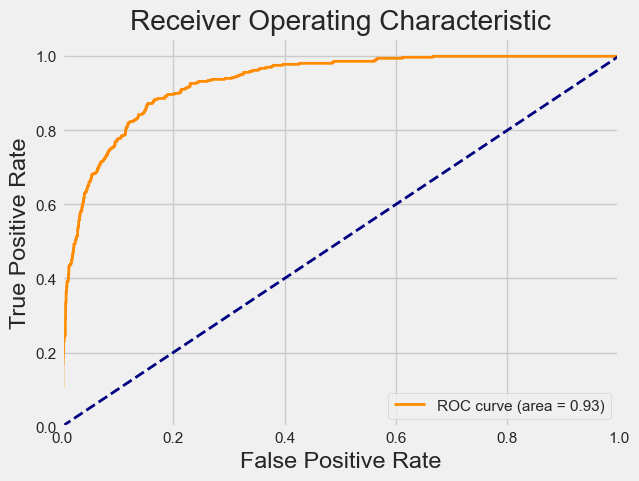

Training and evaluating base HistGradientBoosting with oversampling...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2072
           1       0.65      0.72      0.68       369

    accuracy                           0.90      2441
   macro avg       0.80      0.83      0.81      2441
weighted avg       0.90      0.90      0.90      2441

	ROC-AUC Score: 0.9354
	F1 Score: 0.6848
	G-mean: 0.8183
	Confusion Matrix:
 [[1932  140]
 [ 104  265]]


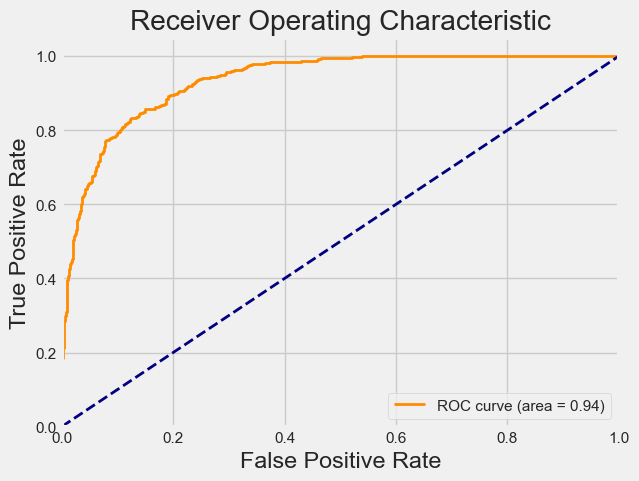

Training and evaluating base ExtraTrees with oversampling...

Results for  ExtraTrees:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.93      0.94      2072
           1       0.65      0.69      0.67       369

    accuracy                           0.90      2441
   macro avg       0.80      0.81      0.80      2441
weighted avg       0.90      0.90      0.90      2441

	ROC-AUC Score: 0.9187
	F1 Score: 0.6702
	G-mean: 0.8033
	Confusion Matrix:
 [[1935  137]
 [ 114  255]]


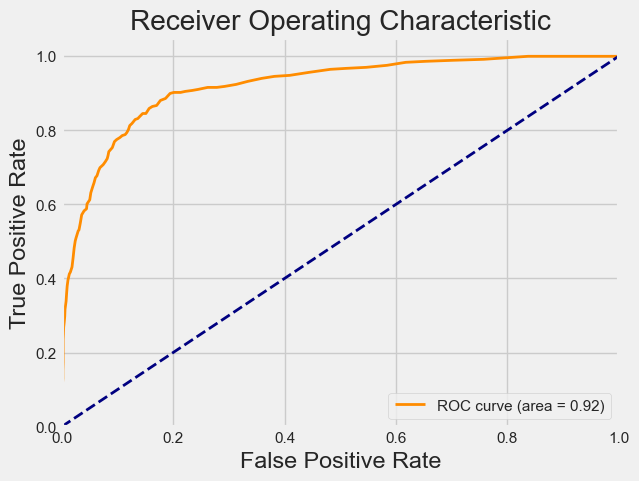

Training and evaluating base DecisionTree with oversampling...

Results for  DecisionTree:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.90      0.92      2072
           1       0.53      0.63      0.57       369

    accuracy                           0.86      2441
   macro avg       0.73      0.76      0.74      2441
weighted avg       0.87      0.86      0.86      2441

	ROC-AUC Score: 0.7631
	F1 Score: 0.5725
	G-mean: 0.7506
	Confusion Matrix:
 [[1865  207]
 [ 138  231]]


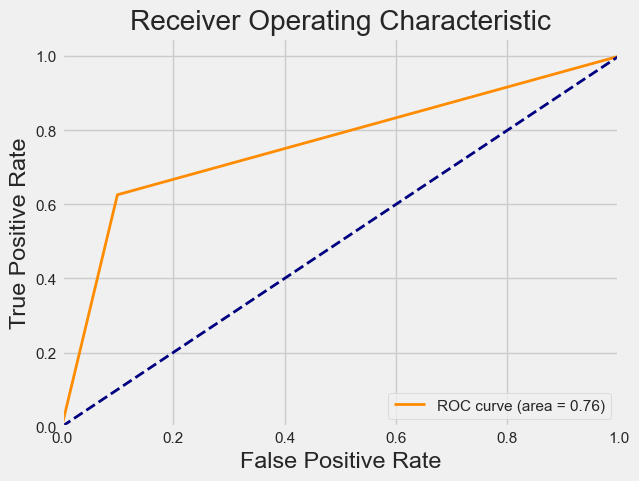

In [143]:
hybrid_base_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name} with oversampling...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name=model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        pipeline=ImbPipeline(steps=[
            ('smote', SMOTETomek(random_state=42)),
            ('model', config["base_model"])
        ])
    )
    hybrid_base_result[model_name] = results

##### *Tunned Model*

Training and evaluating tuned RandomForest with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced_subsample', 'model__max_depth': 30, 'model__max_features': 'log2', 'model__min_samples_leaf': 16, 'model__min_samples_split': 16, 'model__n_estimators': 314}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.93      2072
           1       0.57      0.78      0.66       369

    accuracy                           0.88      2441
   macro avg       0.76      0.84      0.79      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9300
	F1 Score: 0.6583
	G-mean: 0.8357
	Confusion Matrix:
 [[1854  218]
 [  81  288]]


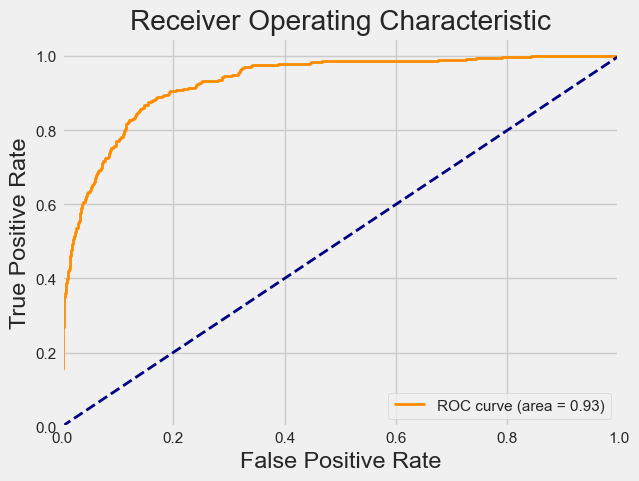

Training and evaluating tuned GradientBoosting with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'model__learning_rate': 0.023999698964084628, 'model__loss': 'exponential', 'model__max_depth': 9, 'model__max_features': 'log2', 'model__min_samples_leaf': 15, 'model__min_samples_split': 13, 'model__n_estimators': 154, 'model__subsample': 0.9916154429033941}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.59      0.76      0.67       369

    accuracy                           0.89      2441
   macro avg       0.77      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9342
	F1 Score: 0.6659
	G-mean: 0.8287
	Confusion Matrix:
 [[1882  190]
 [  90  279]]


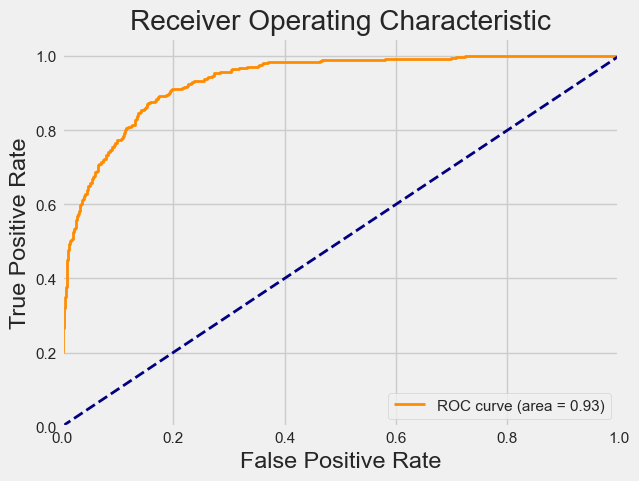

Training and evaluating tuned HistGradientBoosting with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__early_stopping': 'auto', 'model__l2_regularization': 0.8021969807540397, 'model__learning_rate': 0.032365193103931246, 'model__max_bins': 120, 'model__max_depth': 3, 'model__max_iter': 443, 'model__max_leaf_nodes': 10, 'model__min_samples_leaf': 12}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.93      2072
           1       0.61      0.74      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9312
	F1 Score: 0.6707
	G-mean: 0.8247
	Confusion Matrix:
 [[1898  174]
 [  95  274]]


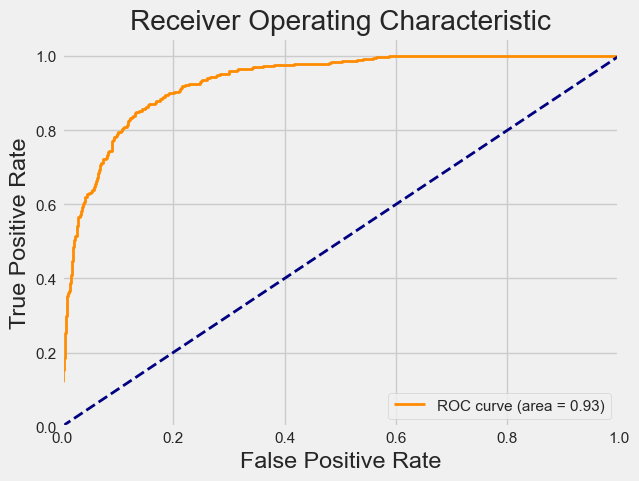

Training and evaluating tuned ExtraTrees with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced_subsample', 'model__max_depth': None, 'model__max_features': None, 'model__min_samples_leaf': 5, 'model__min_samples_split': 4, 'model__n_estimators': 271}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.92      2072
           1       0.56      0.77      0.65       369

    accuracy                           0.88      2441
   macro avg       0.76      0.83      0.79      2441
weighted avg       0.90      0.88      0.88      2441

	ROC-AUC Score: 0.9299
	F1 Score: 0.6514
	G-mean: 0.8306
	Confusion Matrix:
 [[1851  221]
 [  84  285]]


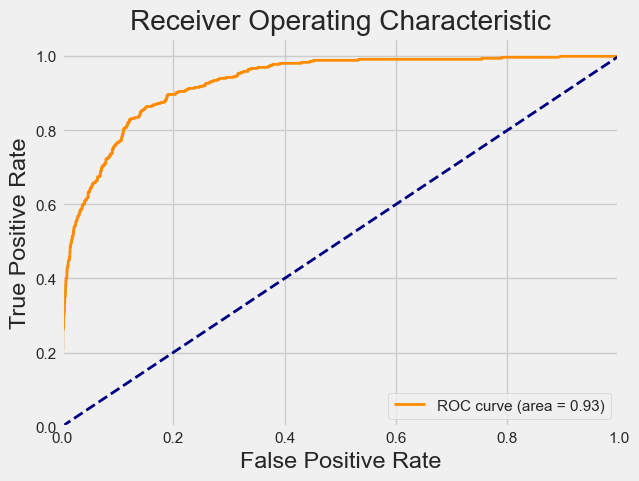

Training and evaluating tuned DecisionTree with oversampling...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__criterion': 'gini', 'model__max_depth': 10, 'model__max_features': None, 'model__min_samples_leaf': 11, 'model__min_samples_split': 12, 'model__splitter': 'random'}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.89      0.92      2072
           1       0.54      0.74      0.63       369

    accuracy                           0.87      2441
   macro avg       0.75      0.82      0.77      2441
weighted avg       0.89      0.87      0.88      2441

	ROC-AUC Score: 0.8885
	F1 Score: 0.6284
	G-mean: 0.8127
	Confusion Matrix:
 [[1843  229]
 [  95  274]]


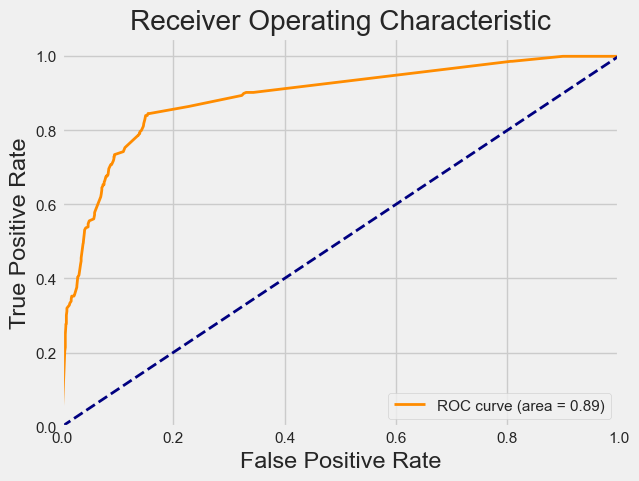

In [144]:
hybridsampling_tunned_result = {}
for model_name, config in models.items():
    print(f"Training and evaluating tuned {model_name} with oversampling...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params={"model__" + key: value for key, value in config["params"].items()},
        pipeline=ImbPipeline(steps=[
            ('smote', SMOTETomek(random_state=42)),
            ('model', config["base_model"])
        ]),
        search=True,
    )
    hybridsampling_tunned_result[model_name] = results

### **Algorithmic Level**

#### ***Threshold method***

##### *Base model*

Training and evaluating base RandomForest with threshold...

Results for  RandomForest:
	Optimal Threshold: 0.3535
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.62      0.75      0.68       369

    accuracy                           0.89      2441
   macro avg       0.79      0.83      0.81      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9262
	F1 Score: 0.6765
	G-mean: 0.8284
	Confusion Matrix:
 [[1901  171]
 [  93  276]]


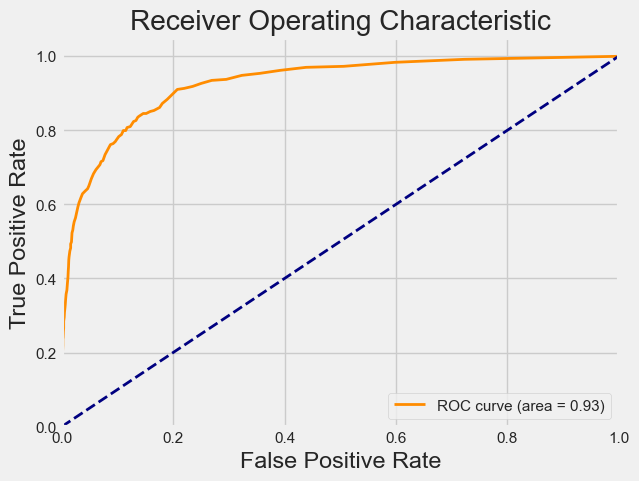

Training and evaluating base GradientBoosting with threshold...

Results for  GradientBoosting:
	Optimal Threshold: 0.3421
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2072
           1       0.64      0.75      0.69       369

    accuracy                           0.90      2441
   macro avg       0.80      0.84      0.82      2441
weighted avg       0.91      0.90      0.90      2441

	ROC-AUC Score: 0.9353
	F1 Score: 0.6941
	G-mean: 0.8351
	Confusion Matrix:
 [[1918  154]
 [  91  278]]


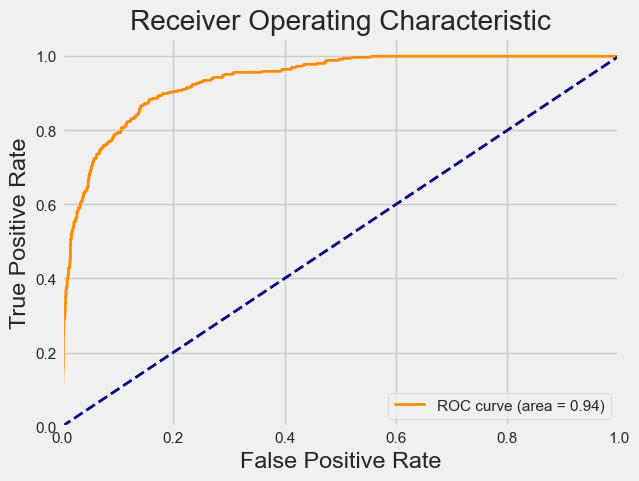

Training and evaluating base HistGradientBoosting with threshold...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.2516
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.80      0.68       369

    accuracy                           0.88      2441
   macro avg       0.77      0.85      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9378
	F1 Score: 0.6751
	G-mean: 0.8466
	Confusion Matrix:
 [[1864  208]
 [  75  294]]


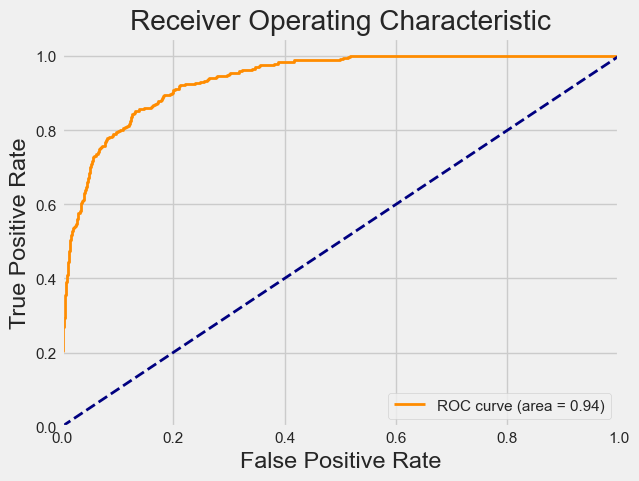

Training and evaluating base ExtraTrees with threshold...

Results for  ExtraTrees:
	Optimal Threshold: 0.2871
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.58      0.78      0.67       369

    accuracy                           0.88      2441
   macro avg       0.77      0.84      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9195
	F1 Score: 0.6682
	G-mean: 0.8396
	Confusion Matrix:
 [[1865  207]
 [  80  289]]


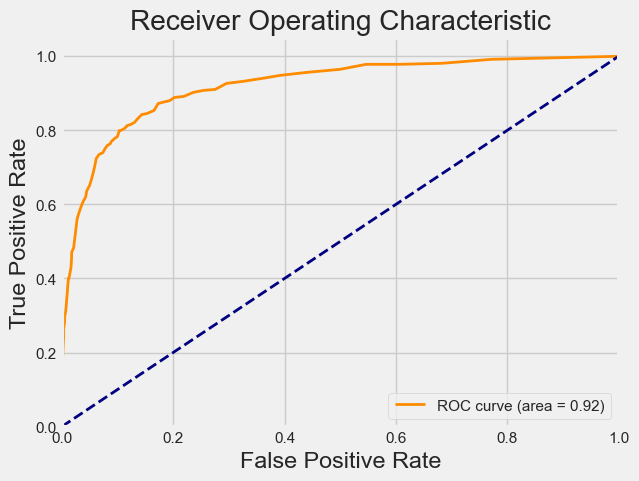

Training and evaluating base DecisionTree with threshold...

Results for  DecisionTree:
	Optimal Threshold: 0.0101
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      2072
           1       0.55      0.59      0.57       369

    accuracy                           0.87      2441
   macro avg       0.74      0.75      0.74      2441
weighted avg       0.87      0.87      0.87      2441

	ROC-AUC Score: 0.7513
	F1 Score: 0.5688
	G-mean: 0.7334
	Confusion Matrix:
 [[1895  177]
 [ 152  217]]


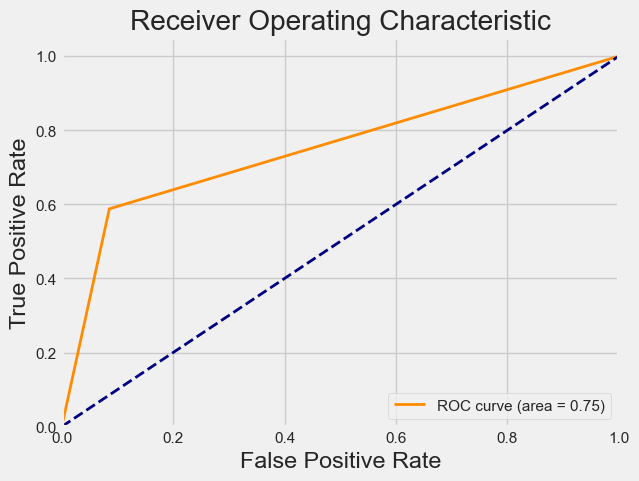

In [145]:
threshold_base_results = {}
for model_name, config in models.items():
    print(f"Training and evaluating base {model_name} with threshold...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        threshold=True  # Enable threshold optimization
    )
    threshold_base_results[model_name] = results

##### *Tunned model*

Training and evaluating tuned RandomForest...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'bootstrap': True, 'class_weight': 'balanced_subsample', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 15, 'n_estimators': 458}
	Optimal Threshold: 0.5764
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.63      0.74      0.68       369

    accuracy                           0.89      2441
   macro avg       0.79      0.83      0.81      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9310
	F1 Score: 0.6775
	G-mean: 0.8243
	Confusion Matrix:
 [[1910  162]
 [  97  272]]


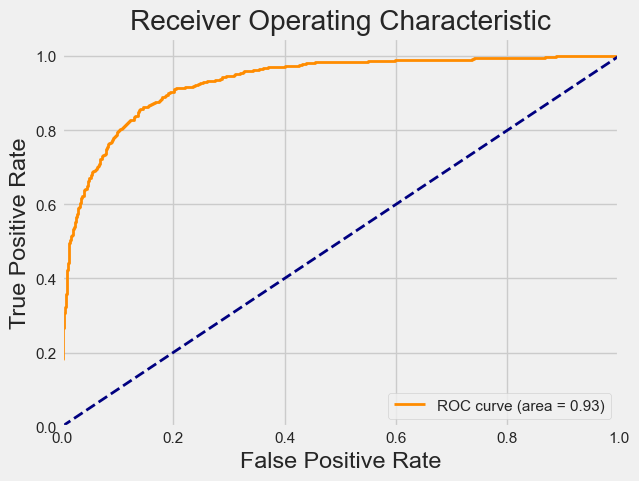

Training and evaluating tuned GradientBoosting...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'learning_rate': 0.023999698964084628, 'loss': 'exponential', 'max_depth': 9, 'max_features': 'log2', 'min_samples_leaf': 15, 'min_samples_split': 13, 'n_estimators': 154, 'subsample': 0.9916154429033941}
	Optimal Threshold: 0.2987
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.64      0.75      0.69       369

    accuracy                           0.90      2441
   macro avg       0.80      0.84      0.81      2441
weighted avg       0.91      0.90      0.90      2441

	ROC-AUC Score: 0.9378
	F1 Score: 0.6907
	G-mean: 0.8342
	Confusion Matrix:
 [[1914  158]
 [  91  278]]


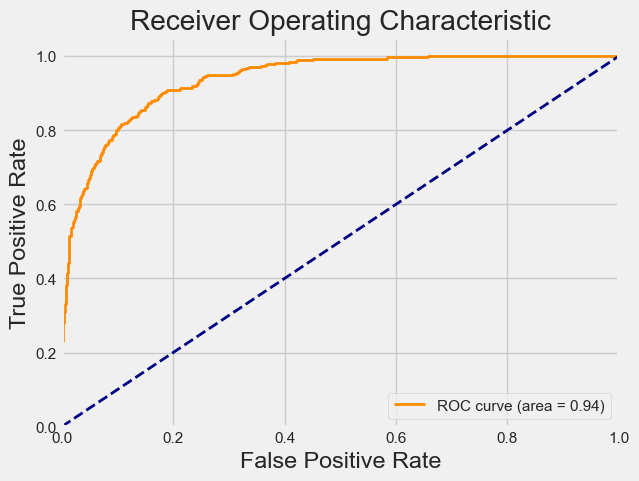

Training and evaluating tuned HistGradientBoosting...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'class_weight': 'balanced', 'early_stopping': False, 'l2_regularization': 0.03142918568673425, 'learning_rate': 0.20092312337913412, 'max_bins': 101, 'max_depth': 7, 'max_iter': 195, 'max_leaf_nodes': 13, 'min_samples_leaf': 5}
	Optimal Threshold: 0.5453
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93      2072
           1       0.59      0.77      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.84      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9303
	F1 Score: 0.6698
	G-mean: 0.8340
	Confusion Matrix:
 [[1879  193]
 [  86  283]]


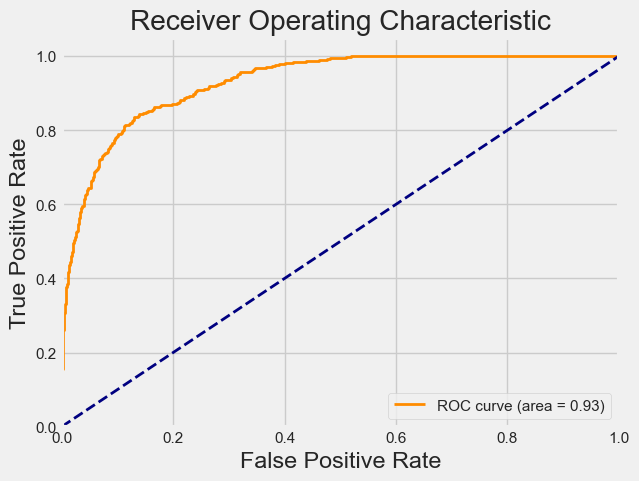

Training and evaluating tuned ExtraTrees...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'bootstrap': False, 'class_weight': 'balanced_subsample', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 4, 'n_estimators': 271}
	Optimal Threshold: 0.5844
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.94      2072
           1       0.62      0.77      0.68       369

    accuracy                           0.89      2441
   macro avg       0.79      0.84      0.81      2441
weighted avg       0.91      0.89      0.90      2441

	ROC-AUC Score: 0.9335
	F1 Score: 0.6843
	G-mean: 0.8390
	Confusion Matrix:
 [[1895  177]
 [  85  284]]


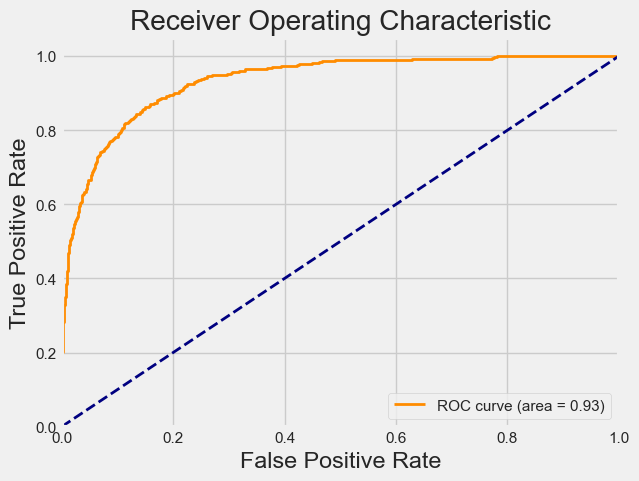

Training and evaluating tuned DecisionTree...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 11, 'min_samples_split': 12, 'splitter': 'random'}
	Optimal Threshold: 0.7172
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.61      0.74      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.8974
	F1 Score: 0.6650
	G-mean: 0.8211
	Confusion Matrix:
 [[1895  177]
 [  97  272]]


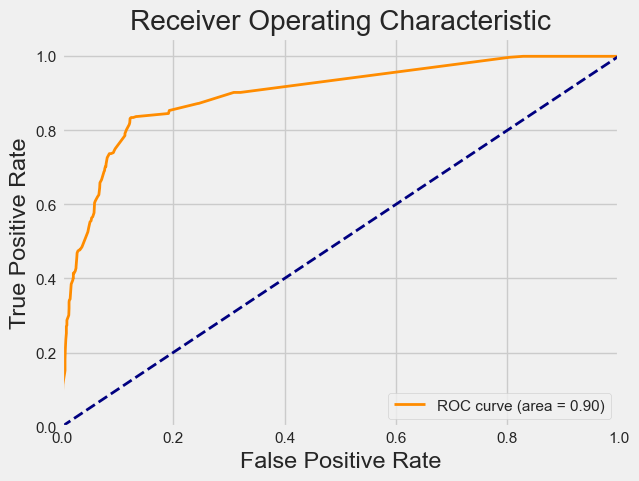

In [146]:
threshold_tuned_results = {}
for model_name, config in models.items():
    print(f"Training and evaluating tuned {model_name}...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params=config["params"],
        search=True,
        threshold=True  # Enable threshold optimization
    )
    threshold_tuned_results[model_name] = results

##### *Tunned model with Undersampling*

Training and evaluating RandomForest with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'model__bootstrap': True, 'model__class_weight': None, 'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 14, 'model__min_samples_split': 19, 'model__n_estimators': 364}
	Optimal Threshold: 0.7909
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.79      0.87      2072
           1       0.41      0.84      0.55       369

    accuracy                           0.80      2441
   macro avg       0.69      0.81      0.71      2441
weighted avg       0.88      0.80      0.82      2441

	ROC-AUC Score: 0.8431
	F1 Score: 0.5543
	G-mean: 0.8129
	Confusion Matrix:
 [[1635  437]
 [  60  309]]


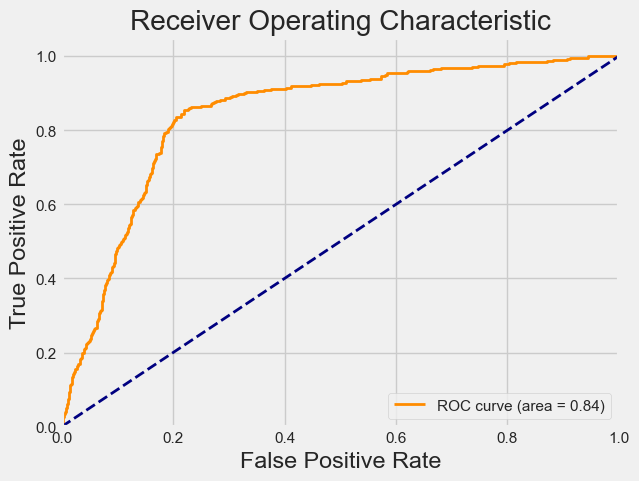

Training and evaluating GradientBoosting with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'model__learning_rate': 0.06597101766581075, 'model__loss': 'exponential', 'model__max_depth': 8, 'model__max_features': None, 'model__min_samples_leaf': 7, 'model__min_samples_split': 2, 'model__n_estimators': 484, 'model__subsample': 0.6139675812709708}
	Optimal Threshold: 0.9899
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.74      0.84      2072
           1       0.37      0.87      0.52       369

    accuracy                           0.76      2441
   macro avg       0.67      0.81      0.68      2441
weighted avg       0.88      0.76      0.79      2441

	ROC-AUC Score: 0.8619
	F1 Score: 0.5215
	G-mean: 0.8022
	Confusion Matrix:
 [[1528  544]
 [  47  322]]


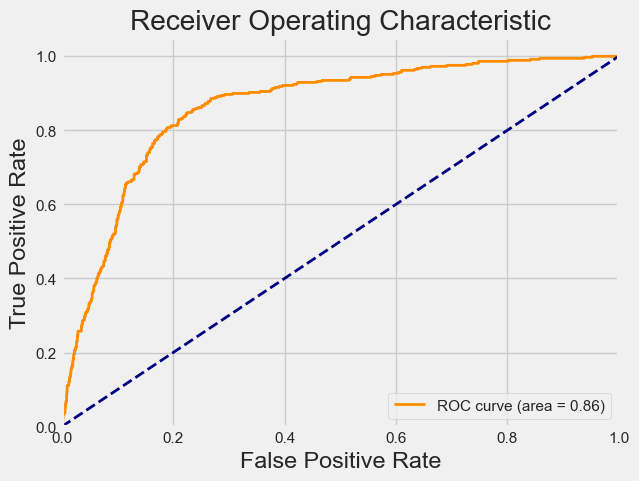

Training and evaluating HistGradientBoosting with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'model__class_weight': None, 'model__early_stopping': 'auto', 'model__l2_regularization': 0.1834347898661638, 'model__learning_rate': 0.24390730008183079, 'model__max_bins': 70, 'model__max_depth': 9, 'model__max_iter': 221, 'model__max_leaf_nodes': 92, 'model__min_samples_leaf': 11}
	Optimal Threshold: 0.9899
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.74      0.84      2072
           1       0.37      0.85      0.51       369

    accuracy                           0.76      2441
   macro avg       0.67      0.80      0.67      2441
weighted avg       0.88      0.76      0.79      2441

	ROC-AUC Score: 0.8460
	F1 Score: 0.5130
	G-mean: 0.7934
	Confusion Matrix:
 [[1528  544]
 [  54  315]]


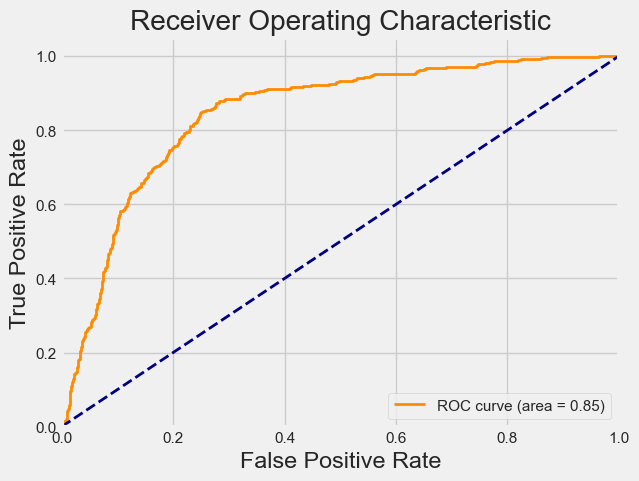

Training and evaluating ExtraTrees with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'model__bootstrap': True, 'model__class_weight': 'balanced_subsample', 'model__max_depth': 30, 'model__max_features': None, 'model__min_samples_leaf': 15, 'model__min_samples_split': 13, 'model__n_estimators': 154}
	Optimal Threshold: 0.8286
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.84      0.89      2072
           1       0.46      0.76      0.58       369

    accuracy                           0.83      2441
   macro avg       0.71      0.80      0.74      2441
weighted avg       0.88      0.83      0.85      2441

	ROC-AUC Score: 0.8545
	F1 Score: 0.5764
	G-mean: 0.8013
	Confusion Matrix:
 [[1747  325]
 [  88  281]]


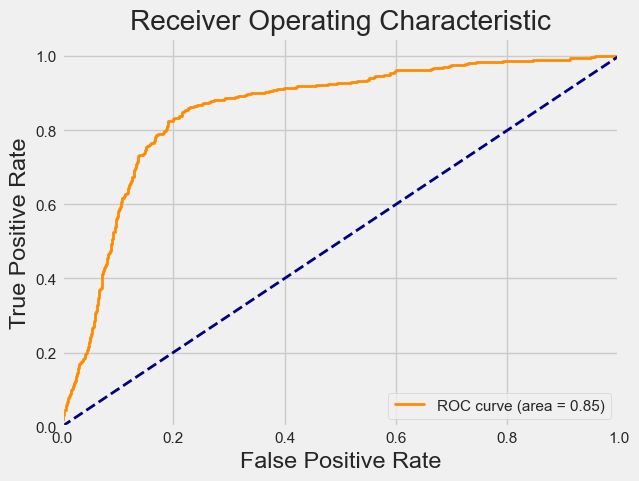

Training and evaluating DecisionTree with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__criterion': 'entropy', 'model__max_depth': 50, 'model__max_features': None, 'model__min_samples_leaf': 12, 'model__min_samples_split': 9, 'model__splitter': 'random'}
	Optimal Threshold: 0.8384
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.85      0.90      2072
           1       0.47      0.78      0.59       369

    accuracy                           0.83      2441
   macro avg       0.71      0.81      0.74      2441
weighted avg       0.88      0.83      0.85      2441

	ROC-AUC Score: 0.8410
	F1 Score: 0.5861
	G-mean: 0.8093
	Confusion Matrix:
 [[1751  321]
 [  83  286]]


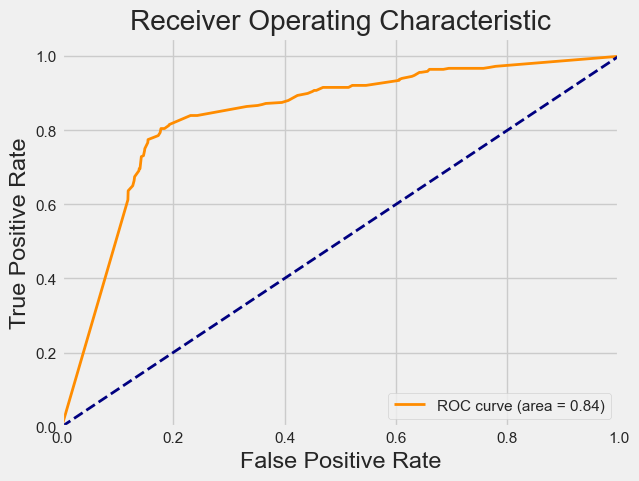

In [147]:
threshold_hybrid_undersampling_results = {}
for model_name, config in models.items():
    print(f"Training and evaluating {model_name} with Undersampling and Hyperparameter tuning...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params={"model__" + key: value for key, value in config["params"].items()},
        search=True,
        pipeline=ImbPipeline(steps=[
            ('Nearmiss', NearMiss()),
            ('model', config["base_model"])
        ]),
        threshold=True  # Enable threshold optimization
    )
    threshold_hybrid_undersampling_results[model_name] = results

##### *Tunned model with Oversampling*

Training and evaluating RandomForest with Oversampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced', 'model__max_depth': None, 'model__max_features': 'log2', 'model__min_samples_leaf': 12, 'model__min_samples_split': 18, 'model__n_estimators': 158}
	Optimal Threshold: 0.5101
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.76      0.66       369

    accuracy                           0.88      2441
   macro avg       0.77      0.83      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9297
	F1 Score: 0.6620
	G-mean: 0.8297
	Confusion Matrix:
 [[1873  199]
 [  88  281]]


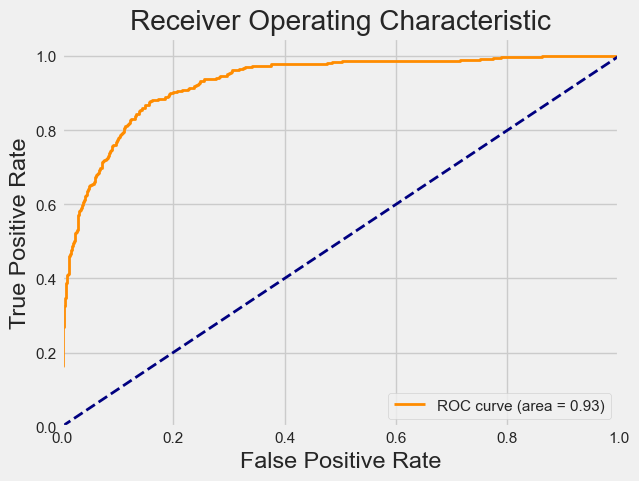

Training and evaluating GradientBoosting with Oversampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'model__learning_rate': 0.023999698964084628, 'model__loss': 'exponential', 'model__max_depth': 9, 'model__max_features': 'log2', 'model__min_samples_leaf': 15, 'model__min_samples_split': 13, 'model__n_estimators': 154, 'model__subsample': 0.9916154429033941}
	Optimal Threshold: 0.4734
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93      2072
           1       0.58      0.76      0.65       369

    accuracy                           0.88      2441
   macro avg       0.76      0.83      0.79      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9341
	F1 Score: 0.6534
	G-mean: 0.8252
	Confusion Matrix:
 [[1866  206]
 [  90  279]]


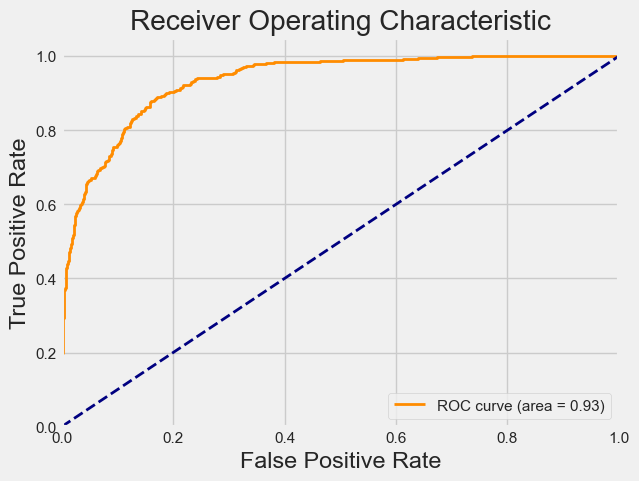

Training and evaluating HistGradientBoosting with Oversampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__early_stopping': 'auto', 'model__l2_regularization': 0.8021969807540397, 'model__learning_rate': 0.032365193103931246, 'model__max_bins': 120, 'model__max_depth': 3, 'model__max_iter': 443, 'model__max_leaf_nodes': 10, 'model__min_samples_leaf': 12}
	Optimal Threshold: 0.4980
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.93      2072
           1       0.62      0.75      0.68       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.81      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9315
	F1 Score: 0.6756
	G-mean: 0.8282
	Confusion Matrix:
 [[1900  172]
 [  93  276]]


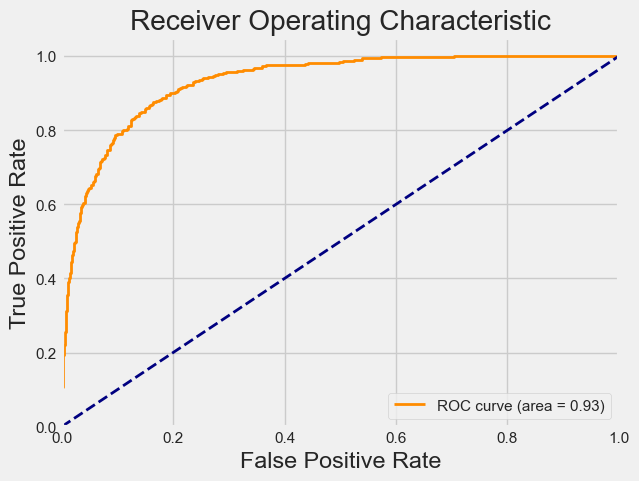

Training and evaluating ExtraTrees with Oversampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced_subsample', 'model__max_depth': None, 'model__max_features': None, 'model__min_samples_leaf': 5, 'model__min_samples_split': 4, 'model__n_estimators': 271}
	Optimal Threshold: 0.5051
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.57      0.77      0.65       369

    accuracy                           0.88      2441
   macro avg       0.76      0.83      0.79      2441
weighted avg       0.90      0.88      0.88      2441

	ROC-AUC Score: 0.9298
	F1 Score: 0.6536
	G-mean: 0.8293
	Confusion Matrix:
 [[1858  214]
 [  86  283]]


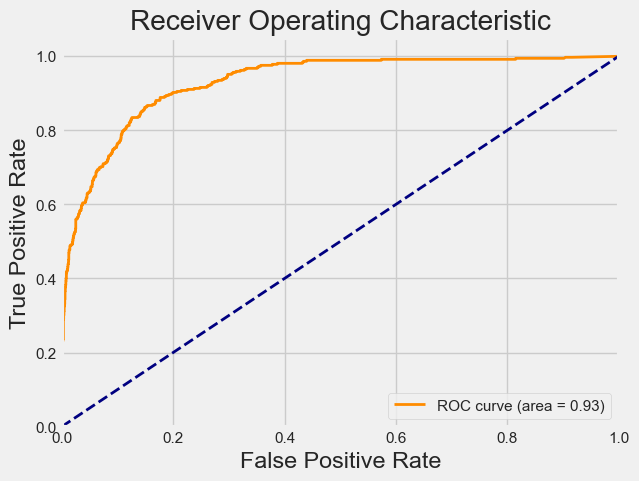

Training and evaluating DecisionTree with Oversampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__criterion': 'gini', 'model__max_depth': 10, 'model__max_features': None, 'model__min_samples_leaf': 11, 'model__min_samples_split': 12, 'model__splitter': 'random'}
	Optimal Threshold: 0.5556
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.92      2072
           1       0.56      0.73      0.63       369

    accuracy                           0.87      2441
   macro avg       0.75      0.81      0.78      2441
weighted avg       0.89      0.87      0.88      2441

	ROC-AUC Score: 0.8859
	F1 Score: 0.6328
	G-mean: 0.8079
	Confusion Matrix:
 [[1862  210]
 [ 101  268]]


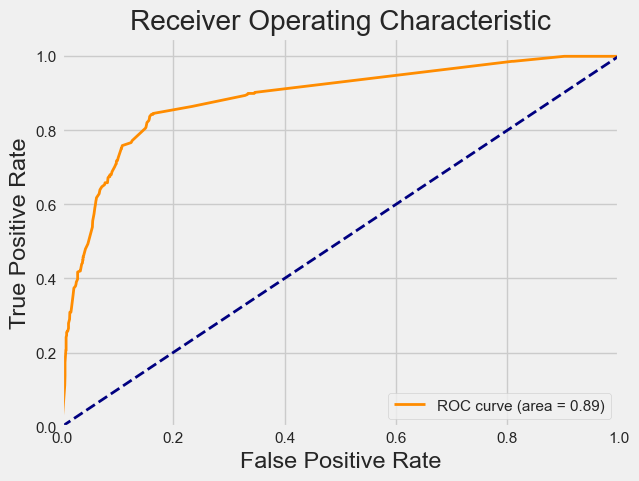

In [148]:
threshold_hybrid_oversampling_results = {}
for model_name, config in models.items():
    print(f"Training and evaluating {model_name} with Oversampling and Hyperparameter tuning...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params={"model__" + key: value for key, value in config["params"].items()},
        search=True,
        pipeline=ImbPipeline(steps=[
            ('smote', SMOTE(random_state=42)),
            ('model', config["base_model"])
        ]),
        threshold=True  # Enable threshold optimization
    )
    threshold_hybrid_oversampling_results[model_name] = results

##### *Tunned Model with Hybridsampling*

Training and evaluating RandomForest with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced_subsample', 'model__max_depth': 30, 'model__max_features': 'log2', 'model__min_samples_leaf': 16, 'model__min_samples_split': 16, 'model__n_estimators': 314}
	Optimal Threshold: 0.5288
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93      2072
           1       0.58      0.76      0.66       369

    accuracy                           0.88      2441
   macro avg       0.77      0.83      0.79      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9300
	F1 Score: 0.6604
	G-mean: 0.8282
	Confusion Matrix:
 [[1873  199]
 [  89  280]]


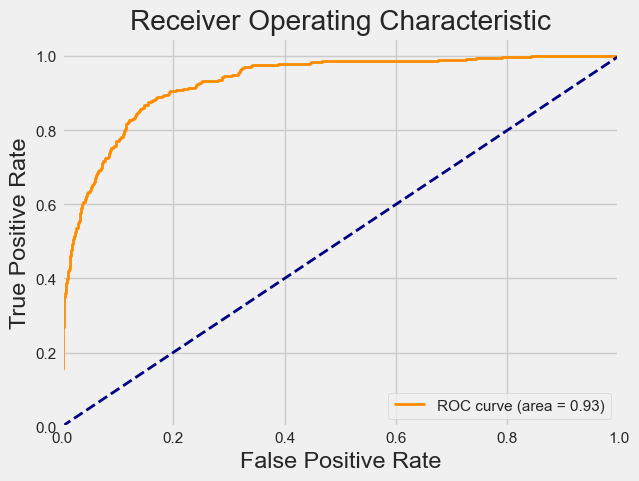

Training and evaluating GradientBoosting with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  GradientBoosting:
	Best Hyperparameters: {'model__learning_rate': 0.023999698964084628, 'model__loss': 'exponential', 'model__max_depth': 9, 'model__max_features': 'log2', 'model__min_samples_leaf': 15, 'model__min_samples_split': 13, 'model__n_estimators': 154, 'model__subsample': 0.9916154429033941}
	Optimal Threshold: 0.4735
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.58      0.77      0.66       369

    accuracy                           0.88      2441
   macro avg       0.77      0.83      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9342
	F1 Score: 0.6635
	G-mean: 0.8322
	Confusion Matrix:
 [[1871  201]
 [  86  283]]


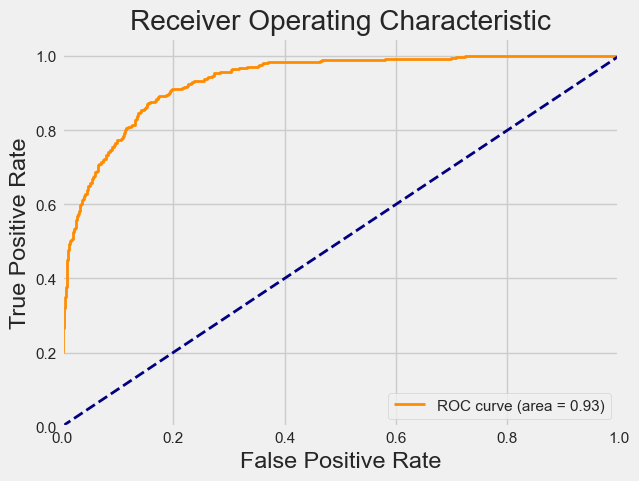

Training and evaluating HistGradientBoosting with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__early_stopping': 'auto', 'model__l2_regularization': 0.8021969807540397, 'model__learning_rate': 0.032365193103931246, 'model__max_bins': 120, 'model__max_depth': 3, 'model__max_iter': 443, 'model__max_leaf_nodes': 10, 'model__min_samples_leaf': 12}
	Optimal Threshold: 0.4869
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.60      0.75      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9312
	F1 Score: 0.6675
	G-mean: 0.8249
	Confusion Matrix:
 [[1892  180]
 [  94  275]]


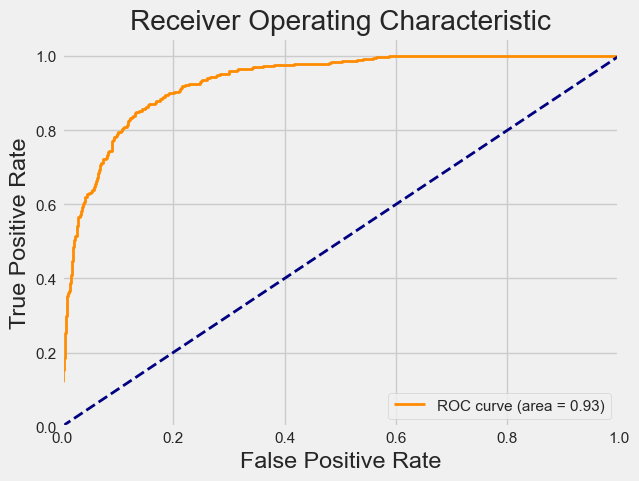

Training and evaluating ExtraTrees with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'model__bootstrap': False, 'model__class_weight': 'balanced_subsample', 'model__max_depth': None, 'model__max_features': None, 'model__min_samples_leaf': 5, 'model__min_samples_split': 4, 'model__n_estimators': 271}
	Optimal Threshold: 0.5553
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.59      0.74      0.66       369

    accuracy                           0.88      2441
   macro avg       0.77      0.82      0.79      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9299
	F1 Score: 0.6570
	G-mean: 0.8189
	Confusion Matrix:
 [[1885  187]
 [  97  272]]


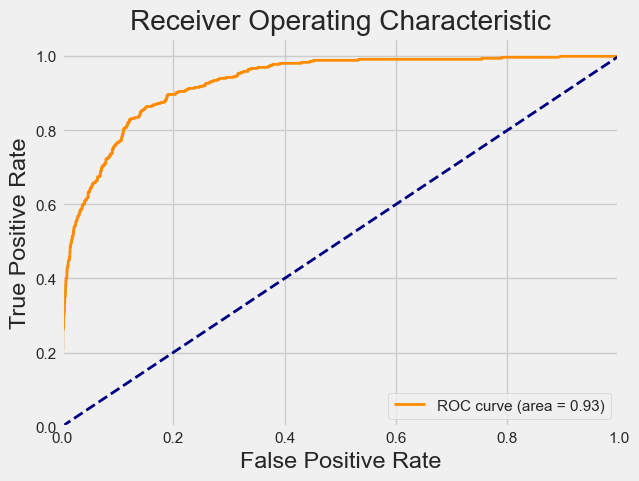

Training and evaluating DecisionTree with Undersampling and Hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'model__class_weight': 'balanced', 'model__criterion': 'gini', 'model__max_depth': 10, 'model__max_features': None, 'model__min_samples_leaf': 11, 'model__min_samples_split': 12, 'model__splitter': 'random'}
	Optimal Threshold: 0.5556
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      2072
           1       0.58      0.72      0.64       369

    accuracy                           0.88      2441
   macro avg       0.76      0.81      0.79      2441
weighted avg       0.89      0.88      0.88      2441

	ROC-AUC Score: 0.8885
	F1 Score: 0.6434
	G-mean: 0.8098
	Confusion Matrix:
 [[1878  194]
 [ 102  267]]


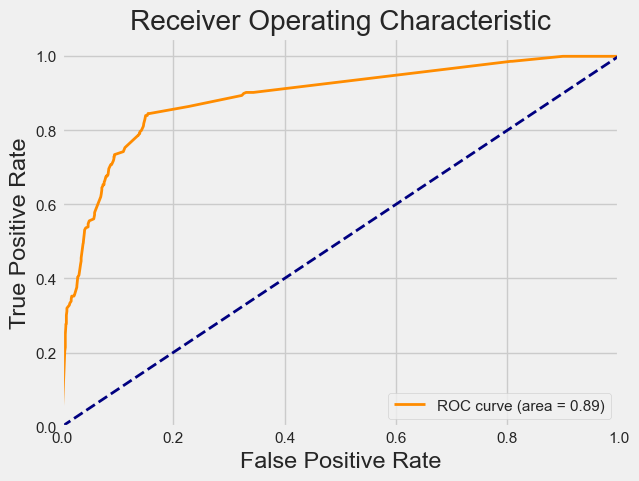

In [149]:
threshold_hybrid_hybridsampling_results = {}
for model_name, config in models.items():
    print(f"Training and evaluating {model_name} with Undersampling and Hyperparameter tuning...")
    results = train_evaluate_model(
        model=config["base_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params={"model__" + key: value for key, value in config["params"].items()},
        search=True,
        pipeline=ImbPipeline(steps=[
            ('Nearmiss', SMOTETomek(random_state=42)),
            ('model', config["base_model"])
        ]),
        threshold=True
    )
    threshold_hybrid_hybridsampling_results[model_name] = results

#### ***Cost sensitive learning***

##### *Base model*

Training and evaluating base RandomForest with cost-sensitive...

Results for  RandomForest:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.98      0.95      2072
           1       0.81      0.57      0.67       369

    accuracy                           0.91      2441
   macro avg       0.87      0.77      0.81      2441
weighted avg       0.91      0.91      0.91      2441

	ROC-AUC Score: 0.9252
	F1 Score: 0.6688
	G-mean: 0.7468
	Confusion Matrix:
 [[2021   51]
 [ 158  211]]


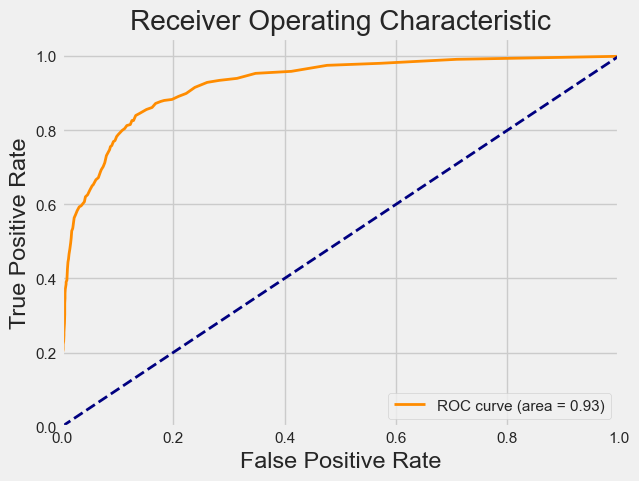

Training and evaluating base HistGradientBoosting with cost-sensitive...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.92      2072
           1       0.56      0.82      0.67       369

    accuracy                           0.88      2441
   macro avg       0.76      0.85      0.79      2441
weighted avg       0.90      0.88      0.88      2441

	ROC-AUC Score: 0.9347
	F1 Score: 0.6652
	G-mean: 0.8504
	Confusion Matrix:
 [[1837  235]
 [  68  301]]


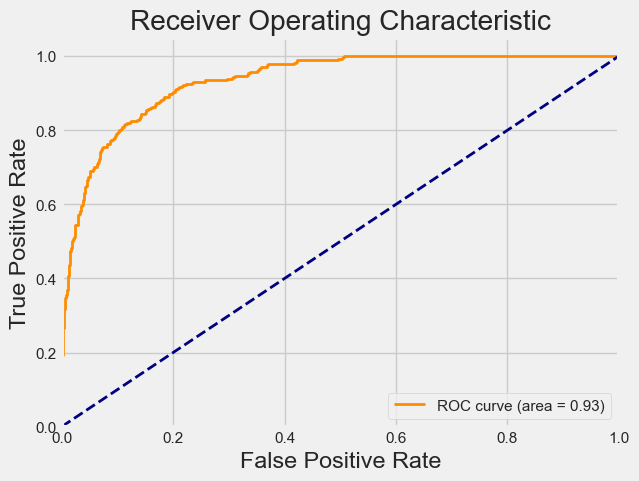

Training and evaluating base ExtraTrees with cost-sensitive...

Results for  ExtraTrees:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95      2072
           1       0.84      0.50      0.62       369

    accuracy                           0.91      2441
   macro avg       0.88      0.74      0.79      2441
weighted avg       0.90      0.91      0.90      2441

	ROC-AUC Score: 0.9180
	F1 Score: 0.6224
	G-mean: 0.6981
	Confusion Matrix:
 [[2036   36]
 [ 186  183]]


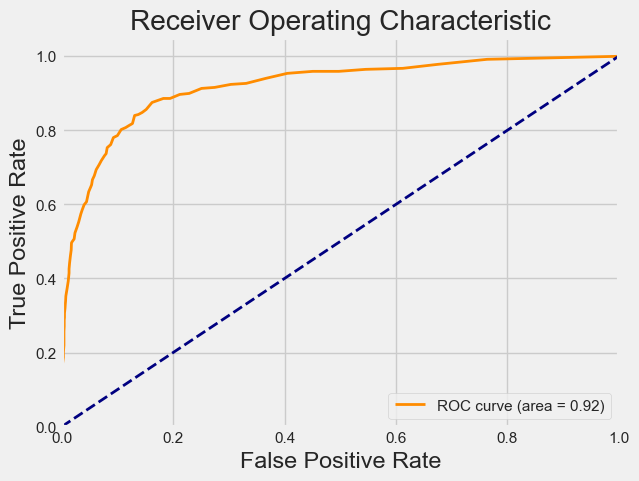

Training and evaluating base DecisionTree with cost-sensitive...

Results for  DecisionTree:
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.93      0.92      2072
           1       0.57      0.53      0.55       369

    accuracy                           0.87      2441
   macro avg       0.74      0.73      0.73      2441
weighted avg       0.86      0.87      0.87      2441

	ROC-AUC Score: 0.7283
	F1 Score: 0.5470
	G-mean: 0.7003
	Confusion Matrix:
 [[1923  149]
 [ 174  195]]


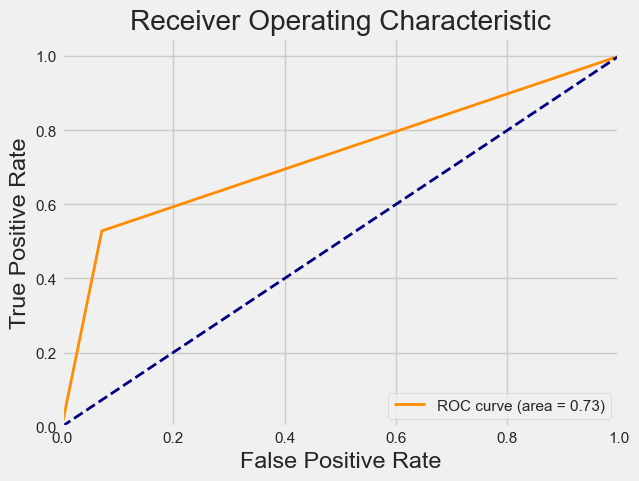

In [150]:
cs_base_results = {}
for model_name, config in models.items():
    if config["cs_model"] is None: continue
    print(f"Training and evaluating base {model_name} with cost-sensitive...")
    results = train_evaluate_model(
        model=config["cs_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
    )
    cs_base_results[model_name] = results

##### *Tunned model*

Training and evaluating tuned RandomForest...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 330}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93      2072
           1       0.60      0.78      0.68       369

    accuracy                           0.89      2441
   macro avg       0.78      0.84      0.81      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9324
	F1 Score: 0.6777
	G-mean: 0.8403
	Confusion Matrix:
 [[1881  191]
 [  82  287]]


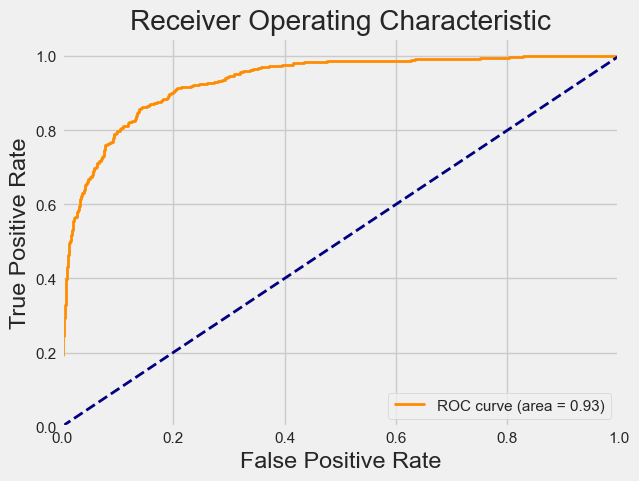

Training and evaluating tuned HistGradientBoosting...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'early_stopping': 'auto', 'l2_regularization': 0.2962735057040824, 'learning_rate': 0.05958008171890075, 'max_bins': 138, 'max_depth': 9, 'max_iter': 108, 'max_leaf_nodes': 97, 'min_samples_leaf': 1}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.77      0.67       369

    accuracy                           0.88      2441
   macro avg       0.77      0.84      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9353
	F1 Score: 0.6659
	G-mean: 0.8329
	Confusion Matrix:
 [[1874  198]
 [  86  283]]


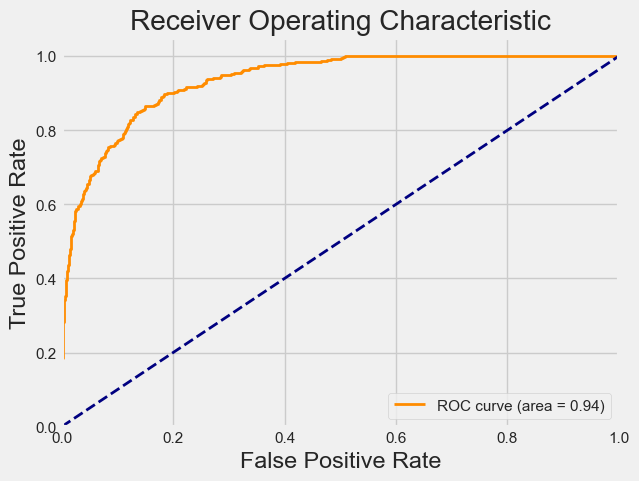

Training and evaluating tuned ExtraTrees...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'bootstrap': True, 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 13, 'n_estimators': 393}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.78      0.67       369

    accuracy                           0.88      2441
   macro avg       0.77      0.84      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9325
	F1 Score: 0.6690
	G-mean: 0.8378
	Confusion Matrix:
 [[1870  202]
 [  82  287]]


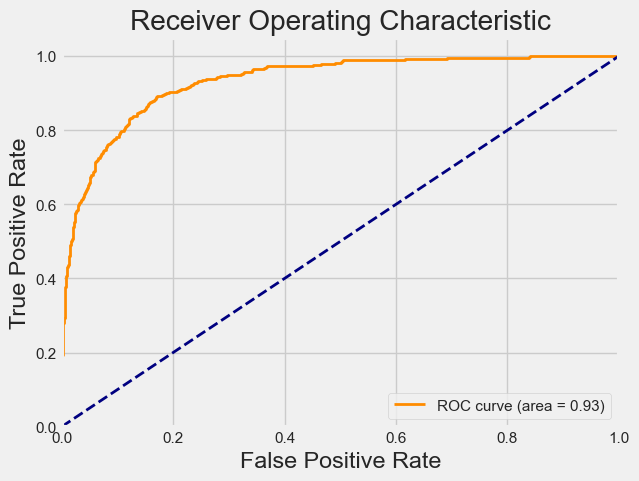

Training and evaluating tuned DecisionTree...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'criterion': 'gini', 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 11, 'min_samples_split': 18, 'splitter': 'random'}
	Optimal Threshold: 0.5000
	Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.82      0.89      2072
           1       0.46      0.87      0.60       369

    accuracy                           0.83      2441
   macro avg       0.72      0.84      0.74      2441
weighted avg       0.89      0.83      0.84      2441

	ROC-AUC Score: 0.9040
	F1 Score: 0.6004
	G-mean: 0.8423
	Confusion Matrix:
 [[1695  377]
 [  49  320]]


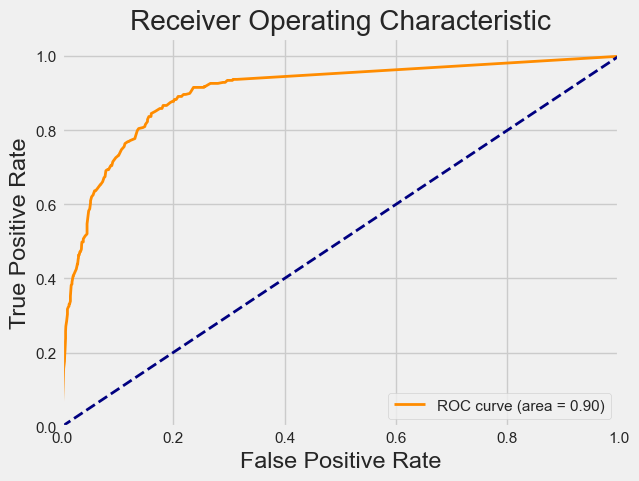

In [151]:
cs_tuned_results = {}
for model_name, config in models.items():
    if config["cs_model"] is None: continue
    print(f"Training and evaluating tuned {model_name}...")
    
    params_without_class_weight = {
        key: value for key, value in config["params"].items() if key != "class_weight"
    }
    
    results = train_evaluate_model(
        model=config["cs_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params=params_without_class_weight,
        search=True,
    )
    cs_tuned_results[model_name] = results

#### ***Cost sensitive learning + Threshold method***

##### *Base model*

Training and evaluating base RandomForest with threshold and cost-sensitive...

Results for  RandomForest:
	Optimal Threshold: 0.3333
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.93      2072
           1       0.61      0.74      0.67       369

    accuracy                           0.89      2441
   macro avg       0.78      0.83      0.80      2441
weighted avg       0.90      0.89      0.89      2441

	ROC-AUC Score: 0.9252
	F1 Score: 0.6708
	G-mean: 0.8237
	Confusion Matrix:
 [[1900  172]
 [  96  273]]


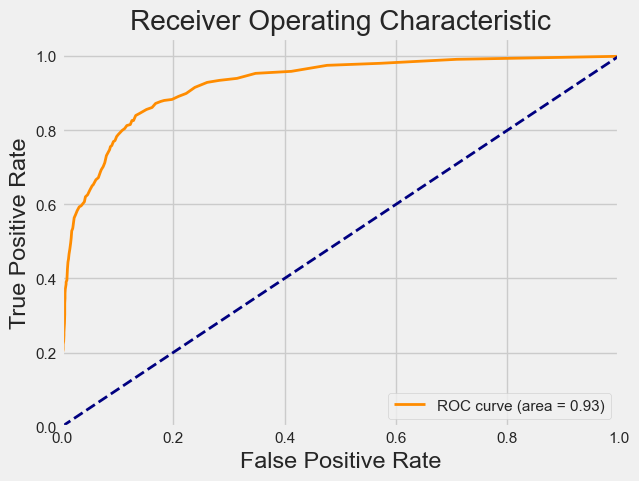

Training and evaluating base HistGradientBoosting with threshold and cost-sensitive...

Results for  HistGradientBoosting:
	Optimal Threshold: 0.5643
	Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93      2072
           1       0.59      0.79      0.67       369

    accuracy                           0.88      2441
   macro avg       0.77      0.85      0.80      2441
weighted avg       0.90      0.88      0.89      2441

	ROC-AUC Score: 0.9347
	F1 Score: 0.6744
	G-mean: 0.8434
	Confusion Matrix:
 [[1869  203]
 [  78  291]]


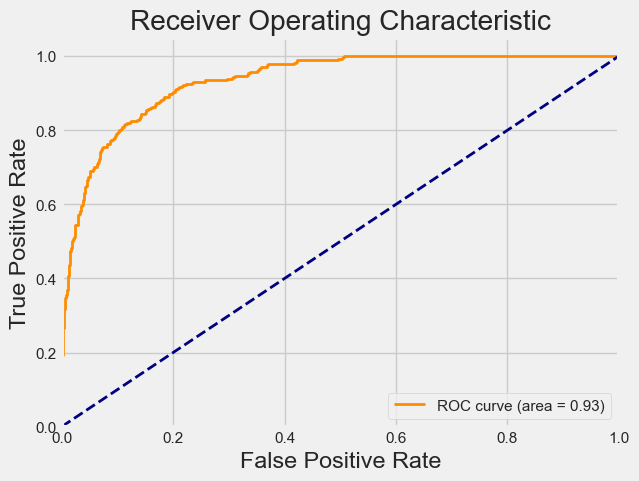

Training and evaluating base ExtraTrees with threshold and cost-sensitive...

Results for  ExtraTrees:
	Optimal Threshold: 0.2970
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.62      0.75      0.68       369

    accuracy                           0.89      2441
   macro avg       0.79      0.84      0.81      2441
weighted avg       0.90      0.89      0.90      2441

	ROC-AUC Score: 0.9180
	F1 Score: 0.6814
	G-mean: 0.8318
	Confusion Matrix:
 [[1903  169]
 [  91  278]]


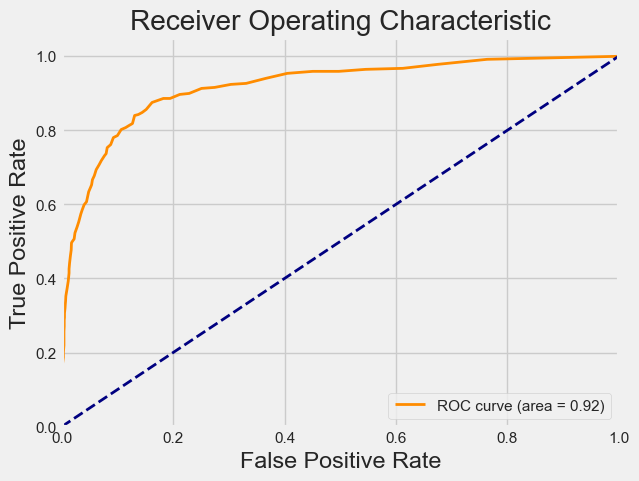

Training and evaluating base DecisionTree with threshold and cost-sensitive...

Results for  DecisionTree:
	Optimal Threshold: 0.0101
	Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.93      0.92      2072
           1       0.57      0.53      0.55       369

    accuracy                           0.87      2441
   macro avg       0.74      0.73      0.73      2441
weighted avg       0.86      0.87      0.87      2441

	ROC-AUC Score: 0.7283
	F1 Score: 0.5470
	G-mean: 0.7003
	Confusion Matrix:
 [[1923  149]
 [ 174  195]]


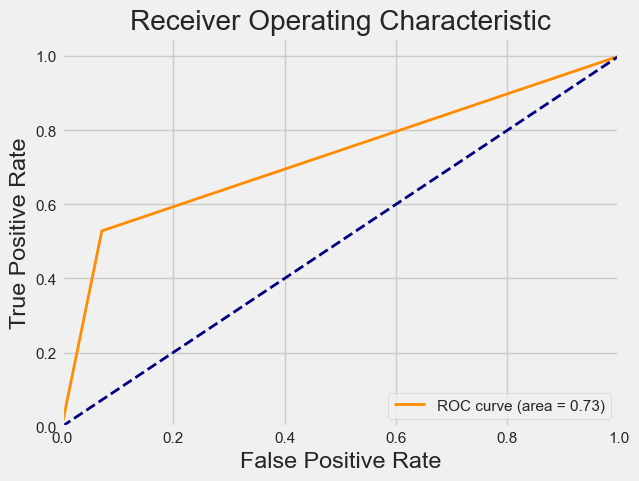

In [152]:
cs_vt_base_results = {}
for model_name, config in models.items():
    if config["cs_model"] is None: continue
    print(f"Training and evaluating base {model_name} with threshold and cost-sensitive...")
    results = train_evaluate_model(
        model=config["cs_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        threshold=True
    )
    cs_vt_base_results[model_name] = results

##### *Tunned model*

Training and evaluating tuned RandomForest...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  RandomForest:
	Best Hyperparameters: {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 330}
	Optimal Threshold: 0.5853
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2072
           1       0.64      0.72      0.68       369

    accuracy                           0.90      2441
   macro avg       0.80      0.82      0.81      2441
weighted avg       0.90      0.90      0.90      2441

	ROC-AUC Score: 0.9324
	F1 Score: 0.6803
	G-mean: 0.8184
	Confusion Matrix:
 [[1925  147]
 [ 103  266]]


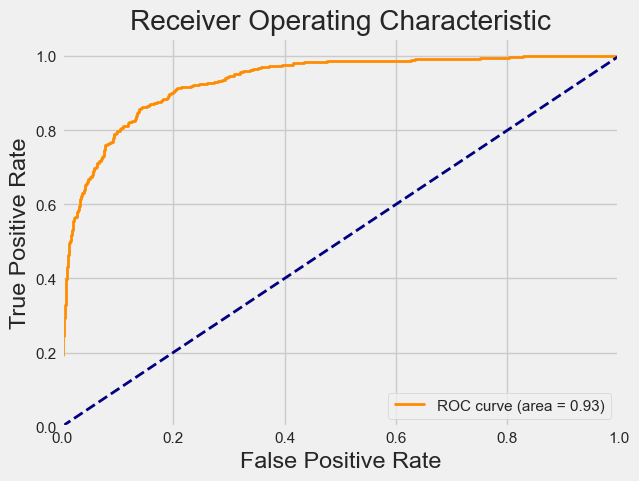

Training and evaluating tuned HistGradientBoosting...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  HistGradientBoosting:
	Best Hyperparameters: {'early_stopping': 'auto', 'l2_regularization': 0.2962735057040824, 'learning_rate': 0.05958008171890075, 'max_bins': 138, 'max_depth': 9, 'max_iter': 108, 'max_leaf_nodes': 97, 'min_samples_leaf': 1}
	Optimal Threshold: 0.6148
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94      2072
           1       0.65      0.73      0.68       369

    accuracy                           0.90      2441
   macro avg       0.80      0.83      0.81      2441
weighted avg       0.90      0.90      0.90      2441

	ROC-AUC Score: 0.9353
	F1 Score: 0.6837
	G-mean: 0.8214
	Confusion Matrix:
 [[1925  147]
 [ 101  268]]


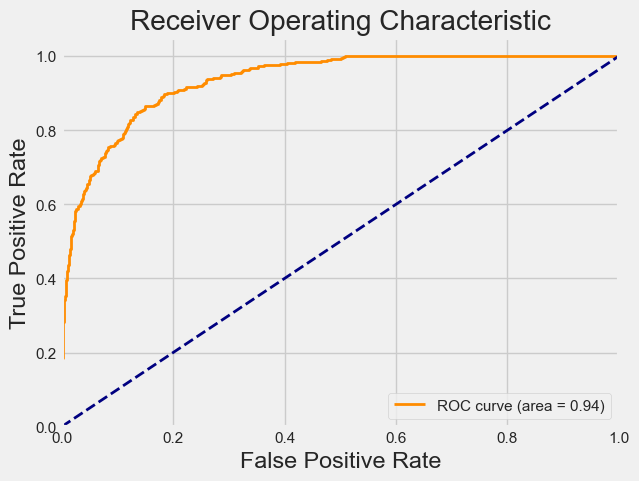

Training and evaluating tuned ExtraTrees...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  ExtraTrees:
	Best Hyperparameters: {'bootstrap': True, 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 13, 'n_estimators': 393}
	Optimal Threshold: 0.5530
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94      2072
           1       0.63      0.76      0.68       369

    accuracy                           0.89      2441
   macro avg       0.79      0.84      0.81      2441
weighted avg       0.91      0.89      0.90      2441

	ROC-AUC Score: 0.9325
	F1 Score: 0.6847
	G-mean: 0.8338
	Confusion Matrix:
 [[1905  167]
 [  90  279]]


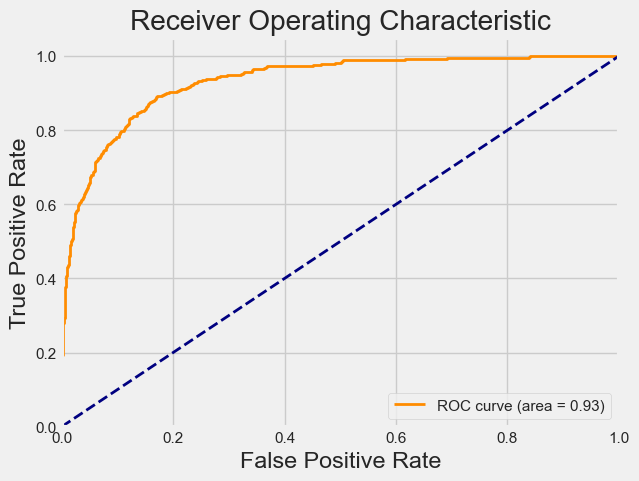

Training and evaluating tuned DecisionTree...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for  DecisionTree:
	Best Hyperparameters: {'criterion': 'gini', 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 11, 'min_samples_split': 18, 'splitter': 'random'}
	Optimal Threshold: 0.6869
	Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.92      2072
           1       0.56      0.73      0.64       369

    accuracy                           0.87      2441
   macro avg       0.75      0.82      0.78      2441
weighted avg       0.89      0.87      0.88      2441

	ROC-AUC Score: 0.9040
	F1 Score: 0.6354
	G-mean: 0.8117
	Confusion Matrix:
 [[1859  213]
 [  98  271]]


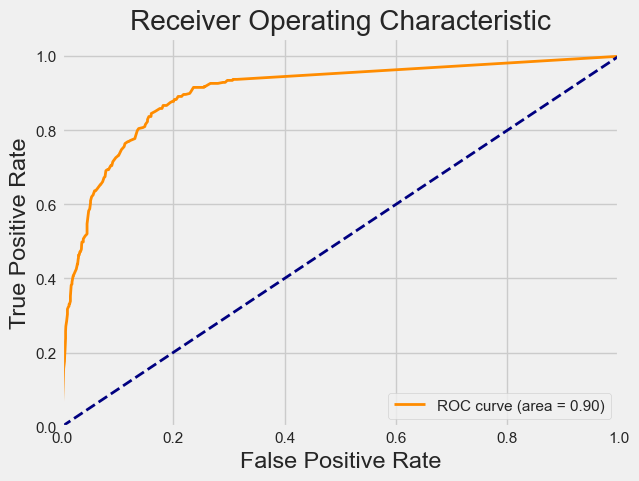

In [153]:
cs_vt_tuned_results = {}
for model_name, config in models.items():
    if config["cs_model"] is None: continue
    print(f"Training and evaluating tuned {model_name}...")
    
    params_without_class_weight = {
        key: value for key, value in config["params"].items() if key != "class_weight"
    }
    
    results = train_evaluate_model(
        model=config["cs_model"],
        model_name = model_name,
        X_train=X_train_clf,
        y_train=y_train_clf,
        X_test=X_test_clf,
        y_test=y_test_clf,
        params=params_without_class_weight,
        search=True,
        threshold=True  # Enable threshold optimization
    )
    cs_vt_tuned_results[model_name] = results

## **Regresison Task**

In the regression task, a set of models is trained, including base models and their hyperparameter-tuned versions. For each model, three key visualizations are plotted to evaluate performance: **Actual vs Predicted Values**, **Residual Plot**, and **Distribution of Residuals**. The **Actual vs Predicted Values** plot helps assess how closely the model's predictions align with the true values, indicating overall accuracy. The **Residual Plot** (residuals vs predicted values) is used to identify patterns in errors, such as heteroscedasticity or bias, which can reveal model shortcomings. The **Distribution of Residuals** provides insights into the error distribution, ensuring it is centered around zero and normally distributed, which is a key assumption in regression analysis. These visualizations collectively help diagnose model performance, identify issues, and guide improvements. Additionally, an **ensemble model** is built by stacking the base models, with **Ridge Regression** serving as the meta-learner. This approach combines the strengths of individual models to enhance predictive accuracy and robustness.

In [154]:
models_reg = {
    "RandomForest": {
        "base_model": RandomForestRegressor(random_state=42),
        "params": {
            "n_estimators": randint(100, 500),
            "max_depth": [None, 10, 20, 30, 50],
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "bootstrap": [True, False]
        }
    },
    "GradientBoosting": {
        "base_model": GradientBoostingRegressor(random_state=42),
        "params": {
            "n_estimators": randint(100, 500),
            "learning_rate": uniform(0.01, 0.3),
            "max_depth": randint(3, 10),
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "subsample": uniform(0.5, 0.5),
            "loss": ["squared_error", "absolute_error", "huber", "quantile"]
        }
    },
    "HistGradientBoosting": {
        "base_model": HistGradientBoostingRegressor(random_state=42),
        "params": {
            "max_iter": randint(100, 500),
            "learning_rate": uniform(0.01, 0.3),
            "max_depth": randint(3, 10),
            "min_samples_leaf": randint(1, 20),
            "max_leaf_nodes": randint(10, 100),
            "l2_regularization": uniform(0.0, 1.0),
            "max_bins": randint(50, 255),
            "early_stopping": ["auto", True, False]
        }
    },
    "ExtraTrees": {
        "base_model": ExtraTreesRegressor(random_state=42),
        "params": {
            "n_estimators": randint(100, 500),
            "max_depth": [None, 10, 20, 30, 50],
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "bootstrap": [True, False]
        }
    },
    "DecisionTree": {
        "base_model": DecisionTreeRegressor(random_state=42),
        "params": {
            "max_depth": [None, 10, 20, 30, 50],
            "min_samples_split": randint(2, 20),
            "min_samples_leaf": randint(1, 20),
            "max_features": ["sqrt", "log2", None],
            "splitter": ["best", "random"],
            "criterion": ["squared_error", "friedman_mse", "absolute_error", "poisson"]
        }
    }
}

In [155]:
def plot_regression_evaluation(y_true, y_pred):
    """
    Plots three evaluation charts for regression models:
    1. Actual vs Predicted Values
    2. Residual Plot
    3. Distribution of Residuals

    Args:
        y_true: Actual target values (ground truth).
        y_pred: Predicted target values from the model.
    """
    # Calculate residuals
    residuals = y_true - y_pred

    # Set up the figure and subplots
    plt.figure(figsize=(18, 5))

    # Visualization 1: Actual vs Predicted Values
    plt.subplot(1, 3, 1)
    plt.scatter(y_true, y_pred, alpha=0.5, label='Predictions')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], color='red', linestyle='--', lw=2, label='Ideal Fit')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs Predicted Values')
    plt.legend()
    plt.grid(True)

    # Visualization 2: Residual Plot
    plt.subplot(1, 3, 2)
    plt.scatter(y_pred, residuals, alpha=0.5, label='Residuals')
    plt.axhline(y=0, color='red', linestyle='--', lw=2, label='Zero Residual Line')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals (Actual - Predicted)')
    plt.title('Residual Plot')
    plt.legend()
    plt.grid(True)

    # Visualization 3: Distribution of Residuals
    plt.subplot(1, 3, 3)
    sns.histplot(residuals, kde=True, bins=30, label='Residuals')
    plt.axvline(x=0, color='red', linestyle='--', lw=2, label='Zero Residual Line')
    plt.xlabel('Residuals (Actual - Predicted)')
    plt.ylabel('Density')
    plt.title('Distribution of Residuals')
    plt.legend()
    plt.grid(True)

    # Show the plots
    plt.tight_layout()
    plt.show()

In [156]:
reg_scoring = {
    'neg_mean_squared_error': 'neg_mean_squared_error',  # Use predefined string
    'r2': 'r2',  # Use predefined string
}

def train_evaluate_reg_model(model, X_train, y_train, X_test, y_test, params=None, search=False, pipeline=None, model_name=""):
    """
    Train and evaluate a regression model.
    
    Args:
        model: The model to train.
        X_train, y_train: Training data.
        X_test, y_test: Test data.
        params: Hyperparameter grid for RandomizedSearchCV.
        search: Whether to perform hyperparameter tuning.
        pipeline: Whether to use a pipeline.
    
    Returns:
        Dictionary containing evaluation results.
    """
    if pipeline:
        model = pipeline

    if search:
        # Perform RandomizedSearchCV for hyperparameter tuning
        search_cv = RandomizedSearchCV(
            estimator=model,
            param_distributions=params,
            n_iter=20,
            scoring='r2',
            cv=5,
            random_state=42,
            n_jobs=-1,
            refit='r2',  # Refit the best model on the full training set using R2 score
            verbose=2
        )
        search_cv.fit(X_train, y_train)
        best_model = search_cv.best_estimator_
        best_params = search_cv.best_params_
    else:
        # Train the base model
        model.fit(X_train, y_train)
        best_model = model
        best_params = None

    # Make predictions
    y_pred = best_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"\nResults for {model_name}:")
    if best_params is not None:
        print("\tBest Hyperparameters:", best_params)
    print(f"\tMSE: {mse:.4f}")
    print(f"\tMAE: {mae:.4f}")
    print(f"\tr2 score: {r2:.4f}")

    plot_regression_evaluation(y_test, y_pred)
    
    # Store results
    results = {
        "best_params": best_params,
        "mean_squared_error": mse,
        "mean_absolute_error": mae,
        "r2_score": r2,
        "predictions": y_pred
    }
    return results

##### *Base model*

Training base RandomForest...

Results for RandomForest:
	MSE: 732104.0850
	MAE: 508.2923
	r2 score: 0.7836


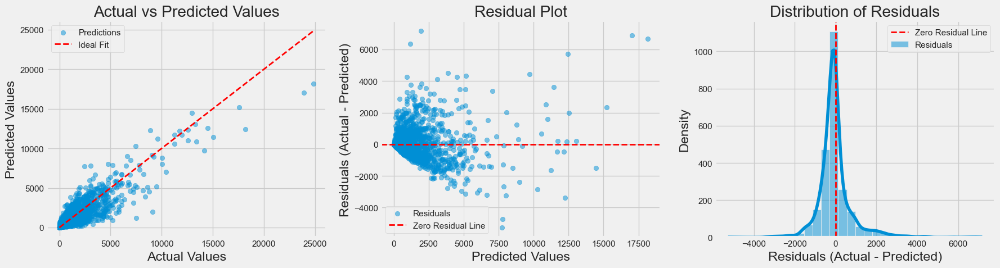

Training base GradientBoosting...

Results for GradientBoosting:
	MSE: 707289.4358
	MAE: 483.7664
	r2 score: 0.7910


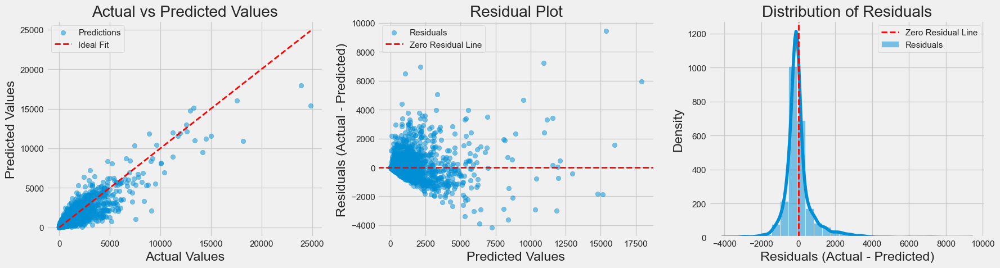

Training base HistGradientBoosting...

Results for HistGradientBoosting:
	MSE: 757709.5175
	MAE: 496.5602
	r2 score: 0.7761


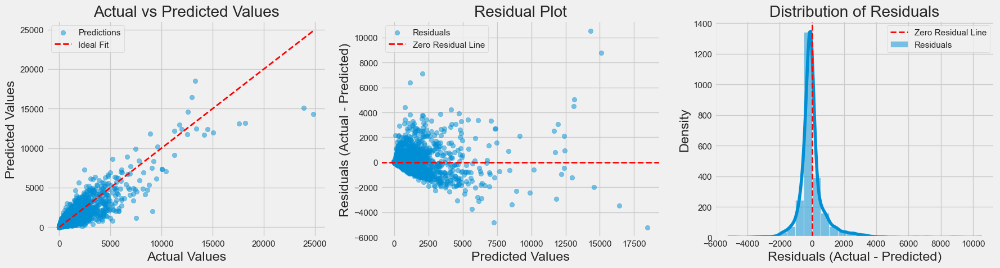

Training base ExtraTrees...

Results for ExtraTrees:
	MSE: 749316.6848
	MAE: 518.1720
	r2 score: 0.7786


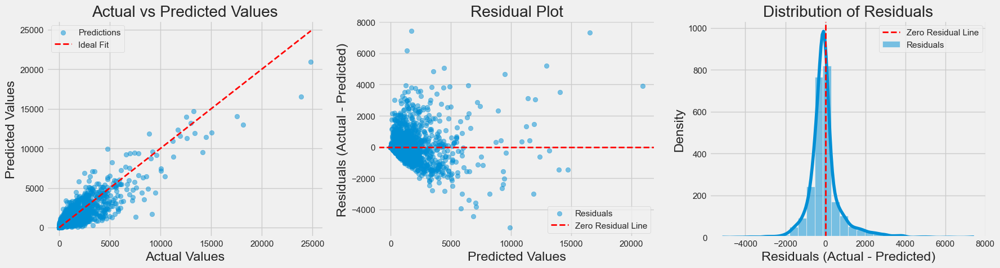

Training base DecisionTree...

Results for DecisionTree:
	MSE: 1681065.9561
	MAE: 695.5501
	r2 score: 0.5032


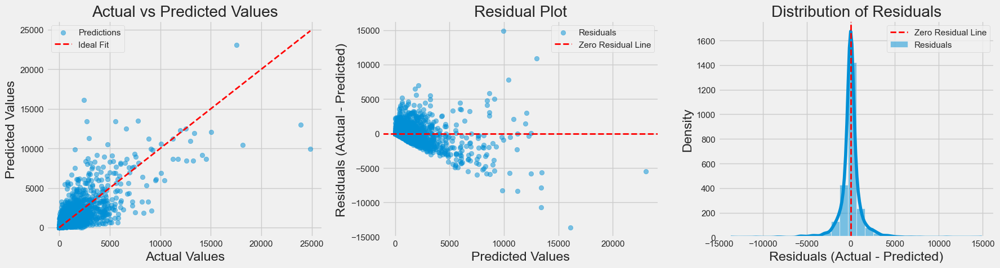

In [157]:
reg_based_results = {}

for model_name, config in models_reg.items():
    if config["base_model"] is None: continue
    print(f"Training base {model_name}...")
    results = train_evaluate_reg_model(
        model=config["base_model"],
        model_name=model_name,
        X_train=X_train_reg,
        y_train=y_train_reg,
        X_test=X_test_reg,
        y_test=y_test_reg,
    )
    reg_based_results[model_name] = results

##### *Tunned model*

Training base RandomForest and hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for RandomForest:
	Best Hyperparameters: {'bootstrap': True, 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 13, 'n_estimators': 393}
	MSE: 717939.9203
	MAE: 496.9207
	r2 score: 0.7878


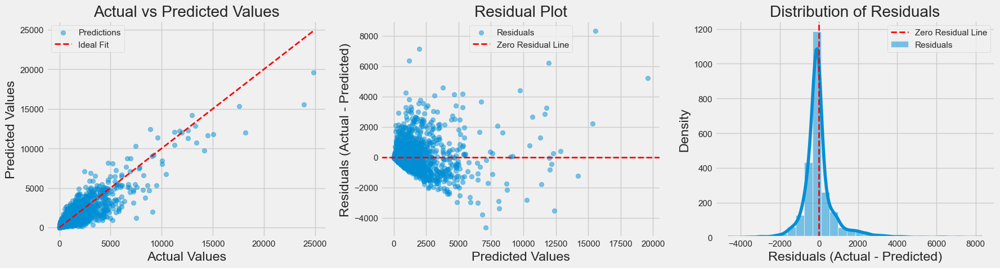

Training base GradientBoosting and hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for GradientBoosting:
	Best Hyperparameters: {'learning_rate': 0.12236203565420874, 'loss': 'squared_error', 'max_depth': 9, 'max_features': None, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 221, 'subsample': 0.5779972601681014}
	MSE: 867556.9933
	MAE: 522.1695
	r2 score: 0.7436


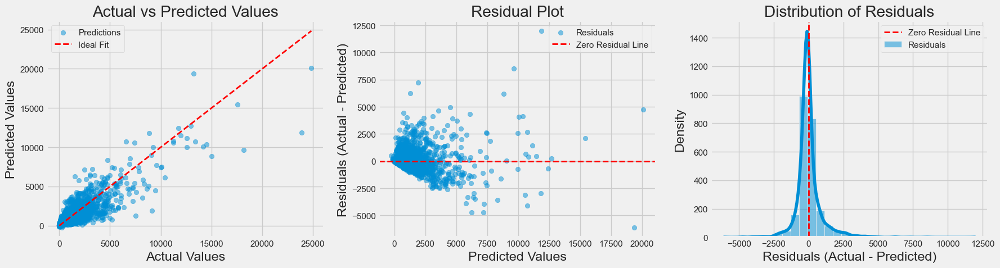

Training base HistGradientBoosting and hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for HistGradientBoosting:
	Best Hyperparameters: {'early_stopping': 'auto', 'l2_regularization': 0.8331949117361643, 'learning_rate': 0.062009396052331626, 'max_bins': 130, 'max_depth': 6, 'max_iter': 149, 'max_leaf_nodes': 13, 'min_samples_leaf': 2}
	MSE: 1137595.7881
	MAE: 510.1129
	r2 score: 0.6638


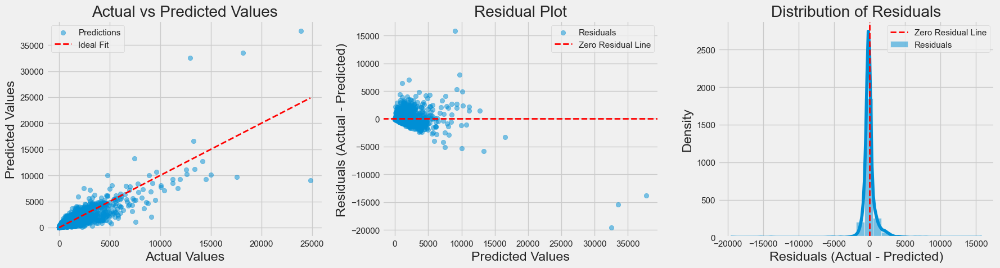

Training base ExtraTrees and hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for ExtraTrees:
	Best Hyperparameters: {'bootstrap': False, 'max_depth': 20, 'max_features': None, 'min_samples_leaf': 3, 'min_samples_split': 6, 'n_estimators': 406}
	MSE: 723503.8007
	MAE: 496.5549
	r2 score: 0.7862


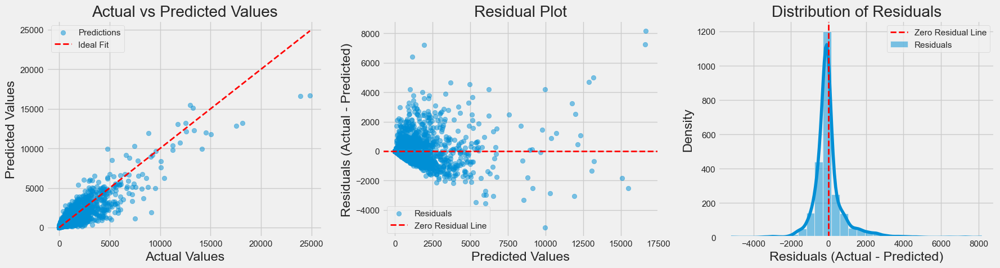

Training base DecisionTree and hyperparameter tuning...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Results for DecisionTree:
	Best Hyperparameters: {'criterion': 'squared_error', 'max_depth': 50, 'max_features': None, 'min_samples_leaf': 19, 'min_samples_split': 12, 'splitter': 'best'}
	MSE: 897334.5480
	MAE: 535.1657
	r2 score: 0.7348


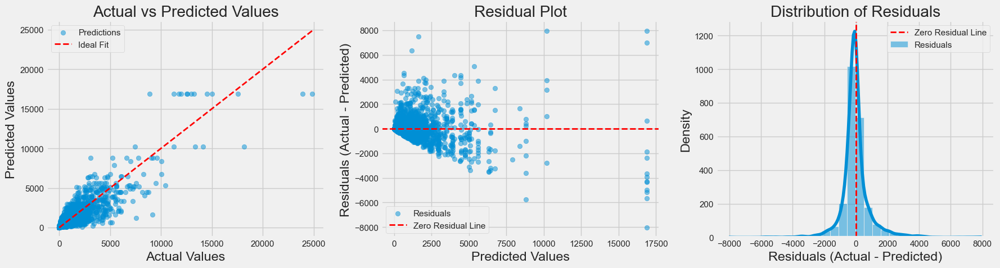

In [158]:
reg_tunned_results = {}

for model_name, config in models_reg.items():
    if config["base_model"] is None: continue
    print(f"Training base {model_name} and hyperparameter tuning...")
    results = train_evaluate_reg_model(
        model=config["base_model"],
        model_name=model_name,
        params=config['params'],
        X_train=X_train_reg,
        y_train=y_train_reg,
        X_test=X_test_reg,
        y_test=y_test_reg,
        search=True
    )
    reg_tunned_results[model_name] = results

##### *Ensembled model*

In [159]:
# Stacking function with hyperparameter tuning
def stacking_ensemble(X, y, models_reg, meta_model, n_folds=5, random_state=42):
    """
    Perform stacking ensemble for regression with detailed hyperparameter tuning.
    
    Args:
        X: Feature matrix (NumPy array).
        y: Target vector (NumPy array).
        models_reg: Dictionary of base models with hyperparameter grids.
        meta_model: Meta-model with hyperparameter grid.
        n_folds: Number of folds for cross-validation.
        random_state: Random seed for reproducibility.
    
    Returns:
        Trained meta-model, base models, and evaluation metrics.
    """
    # Ensure X and y are NumPy arrays
    X = np.array(X)
    y = np.array(y)

    kfold = KFold(n_splits=n_folds, shuffle=True, random_state=random_state)
    base_model_predictions = np.zeros((X.shape[0], len(models_reg)))  # Store out-of-fold predictions
    trained_base_models = []

    # Step 1: Tune and train base models
    for i, (name, model_info) in enumerate(models_reg.items()):
        print(f"Tuning and training base model {i+1}: {name}")
        model = model_info["base_model"]
        params = model_info["params"]
        search_cv = RandomizedSearchCV(
            estimator=model,
            param_distributions=params,
            n_iter=20,
            scoring="r2",
            cv=5,
            random_state=random_state,
            n_jobs=-1,
            verbose=2,
        )
        search_cv.fit(X, y)
        best_model = search_cv.best_estimator_
        print(f"Best parameters for {name}: {search_cv.best_params_}")

        # Generate out-of-fold predictions
        for train_idx, val_idx in kfold.split(X, y):
            clone_model = clone(best_model)
            X_train_fold, X_val_fold = X[train_idx], X[val_idx]
            y_train_fold = y[train_idx]
            clone_model.fit(X_train_fold, y_train_fold)
            base_model_predictions[val_idx, i] = clone_model.predict(X_val_fold)
        trained_base_models.append(best_model)  # Store the best model

    # Step 2: Tune the meta-model
    print("Tuning meta-model...")
    meta_model_cv = RandomizedSearchCV(
        estimator=meta_model["model"],
        param_distributions=meta_model["params"],
        n_iter=20,
        scoring="neg_mean_squared_error",
        cv=5,
        random_state=random_state,
        n_jobs=-1,
        verbose=2,
    )
    meta_model_cv.fit(base_model_predictions, y)
    best_meta_model = meta_model_cv.best_estimator_
    print(f"Best meta-model parameters: {meta_model_cv.best_params_}\n")

    return best_meta_model, trained_base_models

In [160]:
# Function to make predictions using the stacking ensemble
def stacking_predict(X, base_models, meta_model):
    """
    Make predictions using the stacking ensemble.
    
    Args:
        X: Feature matrix.
        base_models: List of trained base models.
        meta_model: Trained meta-model.
    
    Returns:
        Stacked predictions.
    """
    base_model_predictions = np.column_stack([
        model.predict(X) for model in base_models
    ])
    return meta_model.predict(base_model_predictions)

In [161]:
# Meta-model with detailed hyperparameter grid
meta_model = {
    "name": "Ridge",
    "model": Ridge(),
    "params": {
        "alpha": uniform(0.01, 10),  # Regularization strength
        "fit_intercept": [True, False],  # Whether to fit the intercept
    },
}

Tuning and training base model 1: RandomForest
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters for RandomForest: {'bootstrap': True, 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 13, 'n_estimators': 393}
Tuning and training base model 2: GradientBoosting
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters for GradientBoosting: {'learning_rate': 0.12236203565420874, 'loss': 'squared_error', 'max_depth': 9, 'max_features': None, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 221, 'subsample': 0.5779972601681014}
Tuning and training base model 3: HistGradientBoosting
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters for HistGradientBoosting: {'early_stopping': 'auto', 'l2_regularization': 0.8331949117361643, 'learning_rate': 0.062009396052331626, 'max_bins': 130, 'max_depth': 6, 'max_iter': 149, 'max_leaf_nodes': 13, 'min_samples_leaf': 2}
Tuning and tra

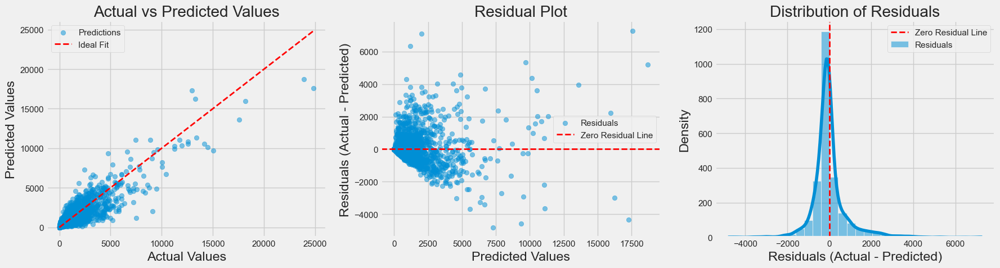

In [162]:
# Train the stacking ensemble
best_meta_model, trained_base_models = stacking_ensemble(
    X_train_reg, y_train_reg, models_reg, meta_model, n_folds=5, random_state=42
)

# Make predictions
y_pred = stacking_predict(X_test_reg, trained_base_models, best_meta_model)

# Evaluate the stacking ensemble
mse = mean_squared_error(y_test_reg, y_pred)
r2 = r2_score(y_test_reg, y_pred)
print(f"Stacking Ensemble MSE: {mse:.4f}")
print(f"Stacking Ensemble R2 Score: {r2:.4f}")

# Visualization: Actual vs Predicted Values
plot_regression_evaluation(y_test_reg, y_pred)